<b>Задание</b>
1. Познакомьтесь с данными.
2. Добавьте информацию из датасета region.csv.
3. Восстановите пропуски в столбце kitchen_area. 
4. Исследуйте рынок недвижимости в РФ за представленный период. Величина исследования - цена за м2. Обработайте аномалии.
5. Когда выгодно покупать/продавать объект недвижимости? 
6. Определите от каких признаков зависит стоимость объекта недвижимости. Найдите скрытые закономерности.
7. Выдвинете и проверьте собственную гипотезу статистическими методами.
8. Создайте модель прогноза цены объекта недвижимости.

In [400]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [401]:
df = pd.read_csv('realty_18_21.csv')
df.head(14)

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
0,6050000,2018-02-19,2661,1,8,10,3,82.6,10.8,1
1,8650000,2018-02-27,81,3,5,24,2,69.1,12.0,1
2,4000000,2018-02-28,2871,1,5,9,3,66.0,10.0,1
3,1850000,2018-03-01,2843,4,12,16,2,38.0,5.0,11
4,5450000,2018-03-01,81,3,13,14,2,60.0,10.0,1
5,3300000,2018-03-02,81,1,4,5,1,32.0,6.0,1
6,4704280,2018-03-04,3,2,1,25,1,31.7,6.0,11
7,3600000,2018-03-04,2661,1,2,5,1,31.1,6.0,1
8,3390000,2018-03-05,3106,2,4,24,2,64.0,13.0,11
9,2800000,2018-03-06,81,1,9,10,2,55.0,8.0,1


In [402]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5477006 entries, 0 to 5477005
Data columns (total 10 columns):
 #   Column         Dtype  
---  ------         -----  
 0   price          int64  
 1   date           object 
 2   region         int64  
 3   building_type  int64  
 4   level          int64  
 5   levels         int64  
 6   rooms          int64  
 7   area           float64
 8   kitchen_area   float64
 9   object_type    int64  
dtypes: float64(2), int64(7), object(1)
memory usage: 417.9+ MB


In [403]:
df

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
0,6050000,2018-02-19,2661,1,8,10,3,82.6,10.8,1
1,8650000,2018-02-27,81,3,5,24,2,69.1,12.0,1
2,4000000,2018-02-28,2871,1,5,9,3,66.0,10.0,1
3,1850000,2018-03-01,2843,4,12,16,2,38.0,5.0,11
4,5450000,2018-03-01,81,3,13,14,2,60.0,10.0,1
...,...,...,...,...,...,...,...,...,...,...
5477001,19739760,2021-05-01,3,1,8,17,4,93.2,13.8,11
5477002,12503160,2021-05-01,3,2,17,32,2,45.9,6.6,11
5477003,8800000,2021-05-01,2871,2,4,17,3,86.5,11.8,1
5477004,11831910,2021-05-01,3,1,8,33,2,52.1,18.9,11


<h2>Обработка данных</h2>

<h3>Обработка столбца цен</h3>

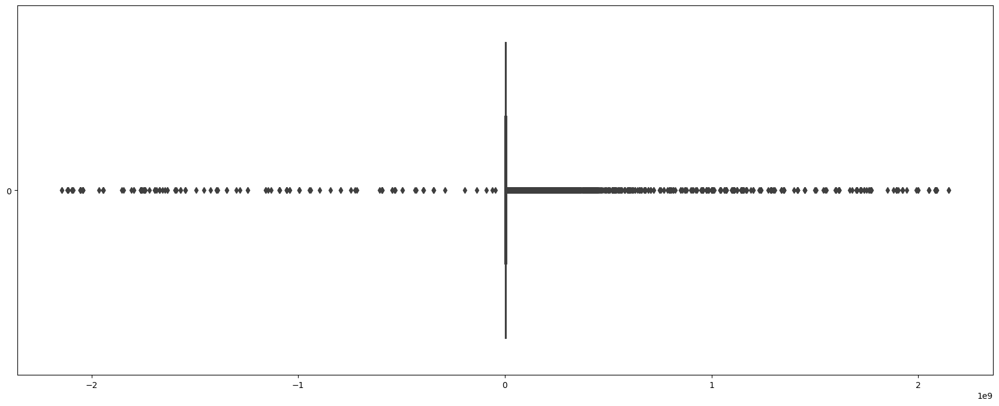

In [404]:
plt.figure(figsize=(21, 8))
sns.boxplot(df['price'], orient='h')
plt.savefig('grf1.pdf')

<strong>Детальный разбор отрицательных цен</strong>

In [405]:
df.query('price <= 0')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
43821,-1633967296,2018-09-14,5520,1,13,22,1,38.92,NaN,11
43822,-1633967296,2018-09-14,5520,1,14,22,1,38.92,17.26,11
179212,0,2018-10-01,6817,3,5,10,3,104.00,15.00,1
199895,-429242296,2018-10-04,9654,2,5,25,2,57.27,9.31,11
208483,-1744967296,2018-10-06,9654,3,4,5,2,45.00,6.00,1
...,...,...,...,...,...,...,...,...,...,...
5382188,-2041757296,2021-04-23,2604,3,2,4,1,41.08,9.31,11
5382595,-1794967296,2021-04-23,81,1,4,5,2,56.00,9.00,1
5398253,-1494967296,2021-04-26,2843,3,3,3,1,45.00,17.00,11
5419426,-2094967296,2021-04-27,3991,3,14,19,1,30.00,8.00,1


<i><u>Предлагаю разделить их по квантилям так, чтобы удалить уж слишком большие цены (1,6 млрд за 39 м2 слишком много)</u></i>

In [406]:
df.query('abs(price) > @st.scoreatpercentile(@df.price, 99.9999) and price <= 0')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
445500,-2114150296,2018-11-09,9654,1,2,10,3,87.00,13.0,11
1100970,-2114150296,2019-02-08,9654,1,8,10,3,87.39,NaN,11
1108531,-2114150296,2019-02-09,9654,1,8,10,3,87.39,13.0,11
1114226,-2114150296,2019-02-10,9654,1,8,10,3,87.39,13.0,11
1119183,-2114150296,2019-02-11,9654,1,8,10,3,87.39,13.0,11
...,...,...,...,...,...,...,...,...,...,...
3816852,-2114967296,2020-06-01,9654,3,2,5,2,43.40,6.0,1
3829586,-2114967296,2020-06-02,9654,3,2,5,2,43.40,6.0,1
4426359,-2144967296,2020-09-22,9654,1,1,10,1,33.60,9.0,1
4427261,-2144967296,2020-09-22,9654,1,1,10,1,33.60,9.0,1


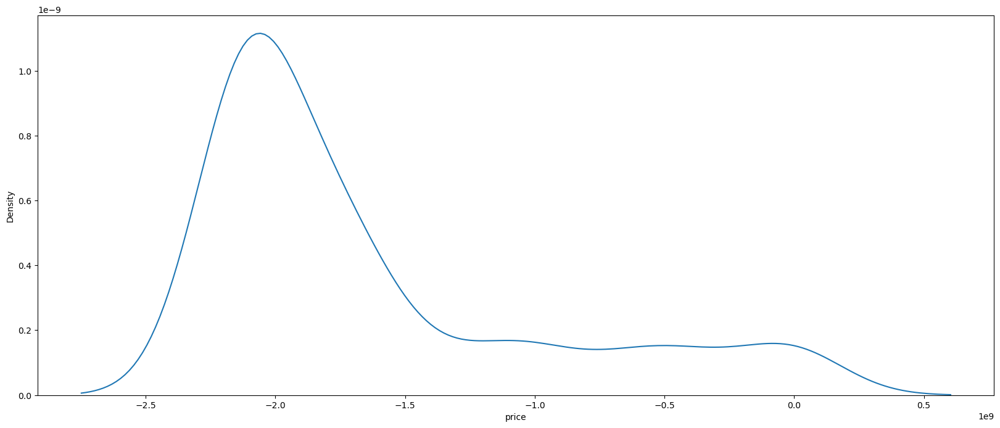

In [407]:
plt.figure(figsize=(20,8))
sns.kdeplot(df.query('price <= 0')['price'])
plt.plot()
plt.savefig('grf2.png')

<i><u>А данные-то распределены неравномерно, есть пик в районе 2 млрд (рублей ??, где такие цены??) и длинный хвост, 
поэтому предлагаю для начала перевести всё в модули, посмотреть, как изменится ус на boxplot, и, при необходимости, обрезать хвост по квантилю</u></i>

In [408]:
df.price = abs(df.price)
df.query('price <= 0')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
179212,0,2018-10-01,6817,3,5,10,3,104.0,15.0,1
386071,0,2018-10-31,2922,1,5,5,2,55.0,8.0,1
533137,0,2018-11-21,3991,1,2,9,3,94.0,16.0,1
1193624,0,2019-02-20,3230,3,1,3,2,57.0,9.0,11
1302153,0,2019-03-04,2604,3,1,2,2,40.5,5.3,1
1431531,0,2019-03-23,5520,3,5,5,4,61.4,11.4,1
1766269,0,2019-05-09,81,3,2,3,-1,109.5,20.0,11
1838690,0,2019-05-22,3,3,1,6,-1,137.0,18.0,1
1905050,0,2019-05-31,81,2,12,17,-1,46.6,12.0,11
1962361,0,2019-06-09,2843,3,1,1,2,65.0,NaN,1


<i><u>Так, отлично, отрицательных цен теперь нет. Смотрим boxplot и kdeplot</u></i>

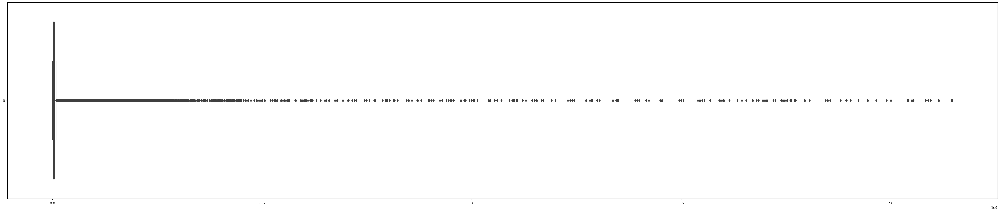

In [409]:
plt.figure(figsize=(50, 10))
sns.boxplot(df['price'], orient='h')
plt.plot()
plt.savefig('grf3.png')

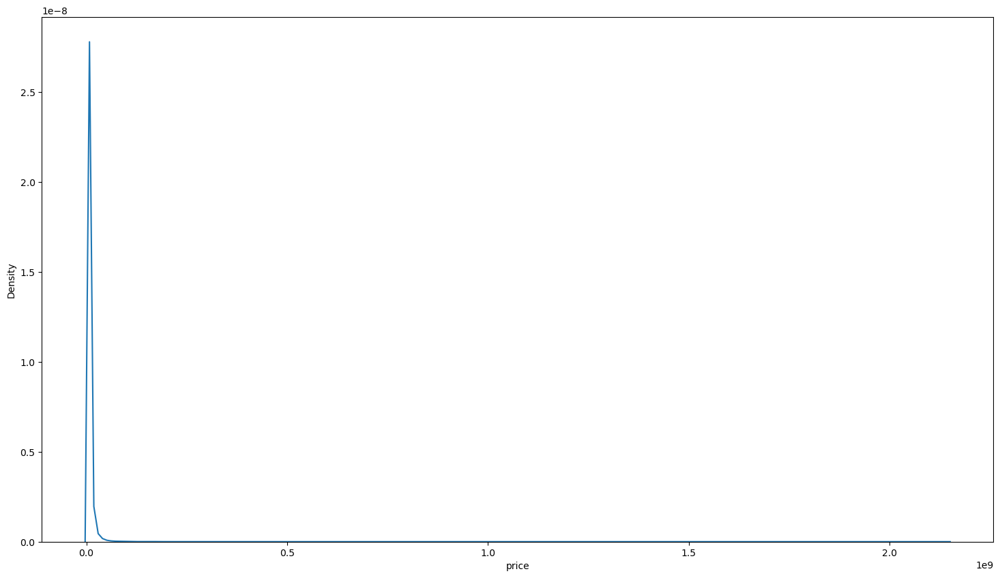

In [410]:
plt.figure(figsize=(18, 10))
sns.kdeplot(df['price'])
plt.plot()
plt.savefig('grf4.png')

In [411]:
print(f'Минимальная цена: {df.price.min()}. Максимальная цена: {df.price.max()}')

Минимальная цена: 0. Максимальная цена: 2147483647


<i><u>Всё равно, как был длинный хвост выбросов, так и остался, будум резать, а заодно и определённую часть слишком маленькиих цен отрежем</u></i>

In [412]:
df.query('price > @st.scoreatpercentile(@df.price, 99)').min()

price              24233000
date             2018-09-08
region                    3
building_type             0
level                     1
levels                    1
rooms                    -2
area                    2.0
kitchen_area           0.23
object_type               1
dtype: object

In [413]:
df.query('price < @st.scoreatpercentile(@df.price, 1)').max()

price                749999
date             2021-05-01
region                16705
building_type             5
level                    33
levels                   38
rooms                     9
area                 7190.0
kitchen_area         6270.0
object_type              11
dtype: object

<i><u>Методом тыка решено отрезать хвосты размером 1%</u></i>

In [414]:
df = df.drop(np.where(df['price'] <= st.scoreatpercentile(df['price'], 1))[0]).reset_index(drop=True)
df = df.drop(np.where(df['price'] >=  st.scoreatpercentile(df['price'], 99))[0]).reset_index(drop=True)
print(f'Минимальная цена: {df.price.min()}, Максимальна цена:{df.price.max()}')

Минимальная цена: 750007, Максимальна цена:24444776


<i><strong>Теперь цены более-менее адекватные. Посмотрим распределение</strong></i>

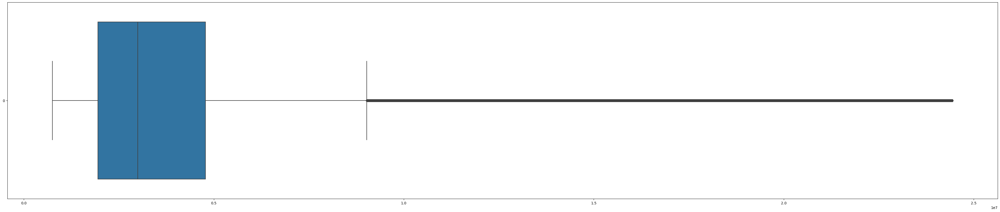

In [415]:
plt.figure(figsize=(50, 10))
sns.boxplot(df['price'], orient='h')
plt.plot()
plt.savefig('grf5.png')

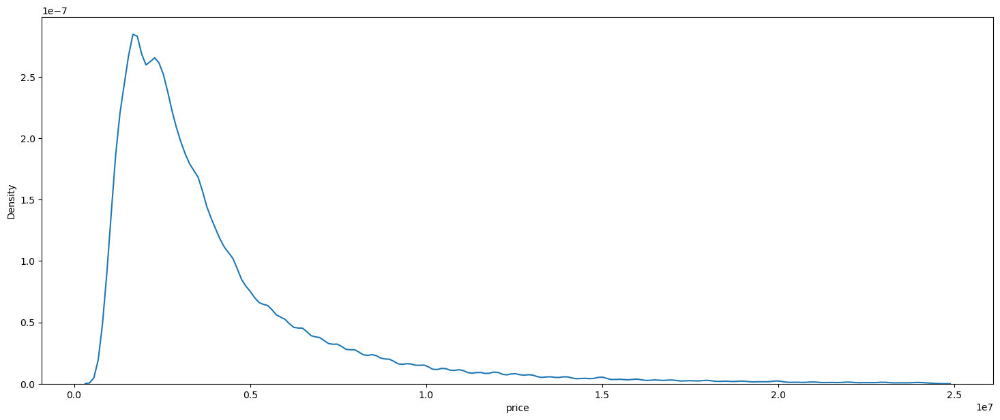

In [416]:
plt.figure(figsize=(18, 7))
sns.kdeplot(df['price'])
plt.plot()
plt.savefig('grf6.png')

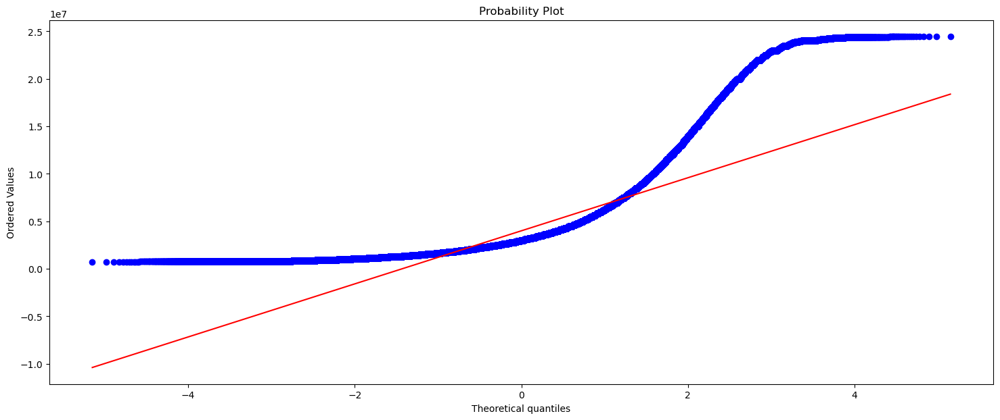

In [417]:
plt.figure(figsize=(18, 7))
st.probplot(df['price'], dist='norm', plot=plt)
plt.plot()
plt.savefig('grf7.png')

In [418]:
df[df['price'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i><strong>Распределение цен ненормальное.
<br>Незаполненных значений нет.
<br>На этом с ценами закончено</strong></i>

<h3>Рассмотрение столбца регионов</h3>

In [419]:
regions = pd.read_csv('region.csv')
regions

,code,reg_name
0,2661,Санкт-Петербург
1,3446,Ленинградская область
2,3,Москва
3,81,Московская область
4,2843,Краснодарский край
...,...,...
78,16705,Магаданская область
79,69,Еврейская автономная область
80,4963,Приморский край
81,1901,Сахалинская область


<strong><u>Будем сравнивать списки из кодов</u></strong>

In [420]:
regions_list = sorted(regions.code.values)
regions_list

['1010',
 '10160',
 '10201',
 '10582',
 '11171',
 '11416',
 '11991',
 '13098',
 '13913',
 '13919',
 '14368',
 '14880',
 '1491',
 '16705',
 '1901',
 '2072',
 '2328',
 '2359',
 '2484',
 '2528',
 '2594',
 '2604',
 '2661',
 '2722',
 '2806',
 '2814',
 '2843',
 '2860',
 '2871',
 '2880',
 '2885',
 '2900',
 '2922',
 '3',
 '3019',
 '3106',
 '3153',
 '3230',
 '3446',
 '3870',
 '3991',
 '4007',
 '4086',
 '4189',
 '4240',
 '4249',
 '4374',
 '4417',
 '4695',
 '4963',
 '4982',
 '5143',
 '5178',
 '5241',
 '5282',
 '5368',
 '5520',
 '5703',
 '5736',
 '5789',
 '5794',
 '5952',
 '5993',
 '6171',
 '61888',
 '6309',
 '6543',
 '6817',
 '69',
 '7121',
 '7793',
 '7873, 6937',
 '7896',
 '7929',
 '8090',
 '81',
 '821',
 '8509',
 '8640',
 '8894',
 '9579',
 '9648',
 '9654']

<i><u>Что за регион с раздвоением личности?</u></i>

In [421]:
regions.query('code == "7873, 6937"')

,code,reg_name
36,"7873, 6937",Республика Крым


In [422]:
regions_df_list = df.region.unique()
regions_df_list

array([ 2661,    81,  2871,  2843,     3,  3106,  2922,  2900,  2722,
        6171,  3230,  4417,  5282,  5368,  3446,  5520,  6817,  9579,
        2604,  1010,  9648,  7793, 13919,  2860,  3019,  4982,  5241,
        3870,  3991,  2359,  9654,  2072,  8090,  4007, 11171, 10160,
        7873,  2594,  8509, 11416, 11991,  5178, 13913,  6309,  5952,
        6543,  2880,  5993,  2484,  4240,  5789, 14880,  1491,  2885,
        5794,  2528,  4374,  4695,  2328,  5143,  6937,  2806, 14368,
        5736,  7121,  4086,   821, 10582,  7896,  8640,  5703, 10201,
        4249,  3153,  4189,  2814, 13098,  8894,  7929, 16705,    69,
        4963,  1901, 61888], dtype=int64)

<i><u>Уже видно, что будут проблемы с Крымом. Предлагаю оставить для него код 6937. Значения в таблице regions перевести в int, потому что сейчас они, очевидно, str, и провести условие, которе я написал дальше, не получится</u></i>

In [423]:
regions['code'] = regions['code'].replace("7873, 6937", "6937")
regions['code'] = regions['code'].astype('int64')
regions_list = np.array(sorted(regions.code.values))
regions_list

array([    3,    69,    81,   821,  1010,  1491,  1901,  2072,  2328,
        2359,  2484,  2528,  2594,  2604,  2661,  2722,  2806,  2814,
        2843,  2860,  2871,  2880,  2885,  2900,  2922,  3019,  3106,
        3153,  3230,  3446,  3870,  3991,  4007,  4086,  4189,  4240,
        4249,  4374,  4417,  4695,  4963,  4982,  5143,  5178,  5241,
        5282,  5368,  5520,  5703,  5736,  5789,  5794,  5952,  5993,
        6171,  6309,  6543,  6817,  6937,  7121,  7793,  7896,  7929,
        8090,  8509,  8640,  8894,  9579,  9648,  9654, 10160, 10201,
       10582, 11171, 11416, 11991, 13098, 13913, 13919, 14368, 14880,
       16705, 61888], dtype=int64)

In [424]:
df['region'] = df['region'].replace(7873, 6937)
regions_df_list = np.array(sorted(df.region.unique()))
regions_df_list

array([    3,    69,    81,   821,  1010,  1491,  1901,  2072,  2328,
        2359,  2484,  2528,  2594,  2604,  2661,  2722,  2806,  2814,
        2843,  2860,  2871,  2880,  2885,  2900,  2922,  3019,  3106,
        3153,  3230,  3446,  3870,  3991,  4007,  4086,  4189,  4240,
        4249,  4374,  4417,  4695,  4963,  4982,  5143,  5178,  5241,
        5282,  5368,  5520,  5703,  5736,  5789,  5794,  5952,  5993,
        6171,  6309,  6543,  6817,  6937,  7121,  7793,  7896,  7929,
        8090,  8509,  8640,  8894,  9579,  9648,  9654, 10160, 10201,
       10582, 11171, 11416, 11991, 13098, 13913, 13919, 14368, 14880,
       16705, 61888], dtype=int64)

In [425]:
#  по идее, у нас все регионы, в которых продавалась недвижимость, должны также быть в кодификаторе.
#  может так получиться, что в каких-то регионах недвижимость не продавалась, поэтому регион будет в кодификаторе, но не будет в таблице данных
print(f'Невыясненные регионы: {np.setdiff1d(regions_df_list, regions_list)}')
print(f'Нет продаж: {np.setdiff1d(regions_list, regions_df_list)}')

Невыясненные регионы: []
Нет продаж: []


<i><strong>Отлично, больше проблем с соответствием регионов нет. Проверим пустые значения</strong></i>

In [426]:
df[df['region'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i><strong>Отлично, таких тоже нет.
<br>С регионами всё.
<br>Заменять коды на названия на данном этапе не буду, потому что int работает быстрее</strong></i>

<h3>Проверка проблем с этажами</h3>

In [427]:
df[df['level'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [428]:
df[df['levels'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [429]:
df[df['level'] > df['levels']]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
25713,1850000,2018-09-12,3870,3,17,13,1,37.00,10.00,1
35157,1100000,2018-09-13,9654,3,4,1,1,30.00,8.00,1
145494,3200000,2018-09-27,11171,2,4,3,1,31.00,10.00,1
161365,1050000,2018-09-28,2843,4,2,1,2,54.00,10.00,1
168099,900000,2018-09-29,3230,2,5,2,1,39.00,12.00,1
...,...,...,...,...,...,...,...,...,...,...
4842140,4750000,2021-01-19,2843,4,11,10,2,54.00,6.00,1
5069497,6984180,2021-03-18,81,3,4,3,2,57.80,11.68,11
5069501,7164620,2021-03-18,81,3,4,3,2,78.84,11.68,11
5070278,4136487,2021-03-18,81,3,4,3,1,48.40,9.01,11


<i><u>1055 объектов, где этажей меньше, чем этаж квартиры, удалим</u></i>

In [430]:
df = df.drop(np.where(df['level'] > df['levels'])[0]).reset_index(drop=True)
df[df['level'] > df['levels']]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [431]:
sorted(df['levels'].unique())

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39]

<i><u>Такс, ну с 20+ этажами я уже свыкся, что такое есть, но 39?? что это?</u></i>

In [432]:
df.groupby(by='levels').nunique()

,price,date,region,building_type,level,rooms,area,kitchen_area,object_type
levels,,,,,,,,,
1,792,965,78,6,1,11,1018,311,2
2,2367,971,82,6,2,11,1665,587,2
3,7766,973,83,6,3,11,2364,952,2
4,10433,974,81,6,4,11,2857,1315,2
5,17037,1016,83,6,5,11,3946,1680,2
6,8199,970,81,6,6,11,2568,926,2
7,7040,968,77,6,7,11,2167,846,2
8,14331,970,75,6,8,11,2574,1249,2
9,32051,998,82,6,9,11,4364,1844,2


<i><u>Ладно, допустим, таких квартир не одна</u></i>

<i><strong>Проблемы с этажами решены</strong></i>

<h3>Разбор проблем с количеством комнат</h3>

In [433]:
df[df['rooms'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [434]:
df[df['building_type'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [435]:
sorted(df.rooms.unique())

[-2, -1, 1, 2, 3, 4, 5, 6, 7, 8, 9]

<i><u>Что значит -2 комнаты?</u></i>

In [436]:
df.query('rooms == -2')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
109859,3150000,2018-09-21,2661,2,2,17,-2,35.0,9.0,1
115417,4300000,2018-09-22,81,3,3,5,-2,61.0,5.6,1
158996,20000000,2018-09-28,2843,4,3,5,-2,102.0,20.0,11
167954,1800000,2018-09-29,3230,3,4,5,-2,46.0,6.0,1
170997,13900000,2018-09-30,2922,3,1,2,-2,375.0,13.0,1
...,...,...,...,...,...,...,...,...,...,...
5203883,13000000,2021-04-09,4007,3,1,3,-2,9.0,20.0,1
5229316,1750000,2021-04-14,2722,3,4,9,-2,9.0,10.0,1
5246202,2350000,2021-04-19,3019,4,4,5,-2,9.0,10.7,1
5318929,5200000,2021-04-29,81,2,7,17,-2,9.0,10.7,1


<i><u>Данных не хватает. Нужна площадь квартиры, чтобы либо выкинуть, либо перевести. Квартира-двушка не может быть площадью 9 м2</u></i>

In [437]:
df.query('rooms == -2').area.mode()

0    9.0
Name: area, dtype: float64

In [438]:
df.query('rooms == -2').area.mean()

94.23038674033148

In [439]:
df.query('rooms == -2').area.median()

34.0

<i><u>Переводить всё в двушки нельзя. Вычленять квартиры, которые действительно можно перевести в двушки - бессмысленно</u></i>

In [440]:
df.query('rooms == -2').index

Index([ 109859,  115417,  158996,  167954,  170997,  244365,  252962,  297172,
        318904,  343030,
       ...
       5132665, 5143364, 5166006, 5180035, 5181086, 5203883, 5229316, 5246202,
       5318929, 5360102],
      dtype='int64', length=181)

In [441]:
df = df.drop(df.query('rooms == -2').index).reset_index(drop=True)

In [442]:
df.query('rooms == -2')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i><strong>Проблемы с количеством комнат решены</strong></i>

<h3>Решение проблем с площадью квартиры и кухни</h3>

In [443]:
df[df['area'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [444]:
df.query('kitchen_area.isna() and rooms != -1')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
19,1650000,2018-03-16,2843,3,5,5,2,51.00,NaN,1
42,4400000,2018-04-14,81,3,11,14,2,54.00,NaN,1
78,2980000,2018-06-04,4417,1,7,9,2,52.00,NaN,1
114,2900000,2018-07-12,81,3,2,9,1,37.50,NaN,1
136,5800000,2018-07-31,2661,2,6,14,1,47.10,NaN,1
...,...,...,...,...,...,...,...,...,...,...
5362267,3200000,2021-05-01,2604,3,1,5,1,47.90,NaN,1
5362283,4250770,2021-05-01,6543,0,12,12,2,59.87,NaN,11
5362336,23319120,2021-05-01,3,2,2,11,3,96.36,NaN,11
5362339,13403880,2021-05-01,3,2,4,23,2,59.10,NaN,11


<i><u>Удалим все квартиры, где общая площадь меньше площади кухни, поскольку в части случаев там действительно перепутали столбцы, а в части случаев - нет. Детально рассматривать 2823 значений не будем</u></i>

In [445]:
df[df['area'] < df['kitchen_area']]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
500,4599000,2018-09-08,9654,3,6,10,2,5.60,7.70,1
671,1350000,2018-09-08,9654,1,5,10,1,13.78,48.02,11
4421,1570000,2018-09-08,1010,3,4,5,1,32.00,65.00,1
5647,1740900,2018-09-09,9654,1,4,10,2,58.03,78.00,11
5960,1350000,2018-09-09,9654,1,5,10,1,13.78,48.02,11
...,...,...,...,...,...,...,...,...,...,...
4954681,3400000,2021-02-22,2843,3,3,6,2,53.00,99.00,1
5052961,950000,2021-03-16,3991,3,1,3,1,15.00,23.00,1
5112229,2300000,2021-03-26,3991,3,1,5,1,31.00,60.00,1
5341600,2750000,2021-04-30,9648,4,3,3,2,45.00,45.60,1


<i><u>Дальше удалим явные выбросы по площади</u></i>

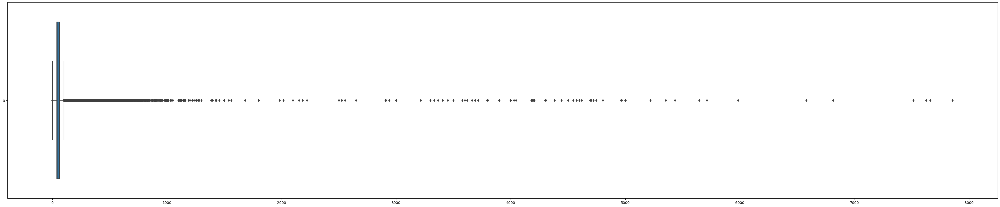

In [446]:
plt.figure(figsize=(50, 10))
sns.boxplot(df['area'], orient='h')
plt.savefig('grf10.png')

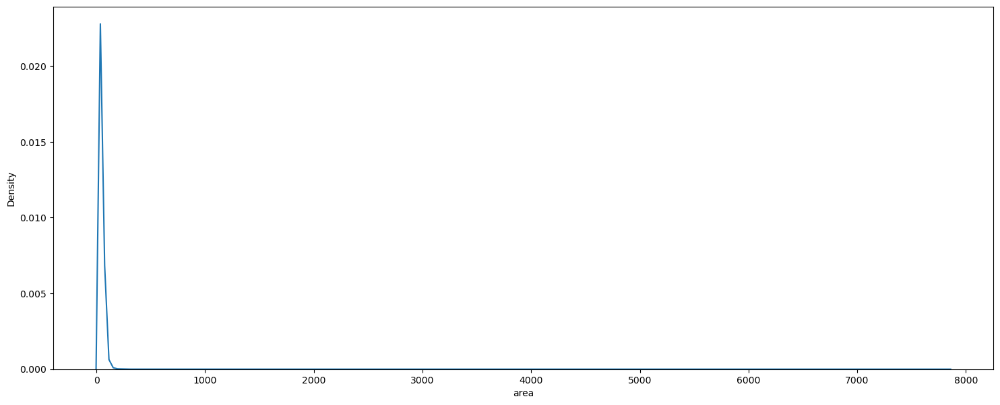

In [447]:
plt.figure(figsize=(18, 7))
sns.kdeplot(df['area'])
plt.savefig('grf11.png')

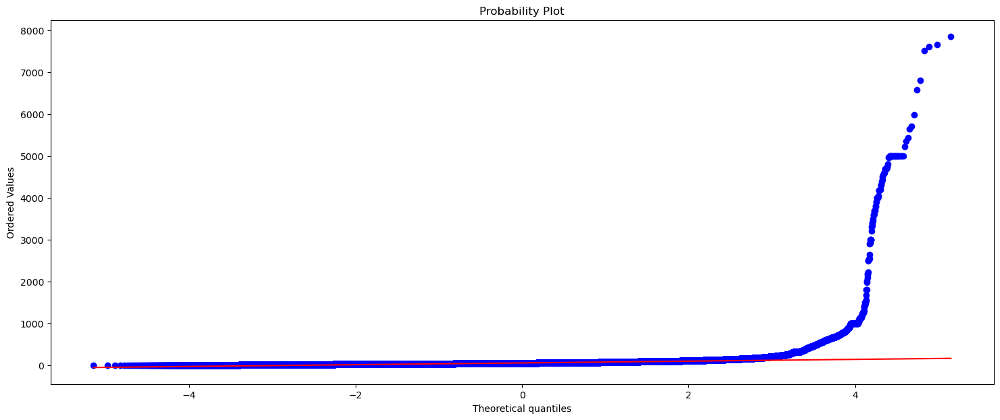

In [448]:
plt.figure(figsize=(18, 7))
st.probplot(df['area'], dist='norm', plot=plt)
plt.plot()
plt.savefig('grf12.png')

In [449]:
df[df['area'] <= st.scoreatpercentile(df['area'], 0.33)]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
500,4599000,2018-09-08,9654,3,6,10,2,5.60,7.70,1
671,1350000,2018-09-08,9654,1,5,10,1,13.78,48.02,11
3530,1100000,2018-09-08,3230,1,3,5,1,15.00,2.00,1
4231,1330000,2018-09-08,6171,4,1,2,-1,15.00,1.00,1
4555,2200000,2018-09-08,81,3,1,5,1,13.30,3.00,1
...,...,...,...,...,...,...,...,...,...,...
5361100,1500000,2021-05-01,2871,3,1,4,-1,13.00,2.00,1
5361567,3650000,2021-05-01,3,1,1,12,-1,13.00,2.00,1
5361772,1650000,2021-05-01,2843,1,5,5,1,13.00,4.00,1
5361967,1200000,2021-05-01,3991,1,1,8,1,12.70,2.00,1


In [450]:
st.scoreatpercentile(df['area'], 0.33)

15.0

In [451]:
df[df['area'] >= st.scoreatpercentile(df['area'], 99.67)]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
81,13825000,2018-06-07,81,3,7,7,2,197.5,14.8,11
255,10250000,2018-09-08,3230,3,2,3,7,166.0,24.0,1
374,11000000,2018-09-08,2843,2,12,20,3,160.0,20.0,1
776,14900000,2018-09-08,9654,0,2,16,5,323.0,13.0,1
1464,12999998,2018-09-08,2843,2,21,22,5,245.0,30.0,1
...,...,...,...,...,...,...,...,...,...,...
5361026,7500000,2021-05-01,3230,3,2,3,4,163.0,15.0,1
5361041,9100000,2021-05-01,3991,3,5,9,4,160.0,25.0,1
5361665,2500000,2021-05-01,2661,3,1,5,5,875.9,25.0,1
5361779,20500000,2021-05-01,2661,3,1,4,4,167.4,31.5,1


In [452]:
st.scoreatpercentile(df['area'], 99.67)

158.92043500001543

In [453]:
df = df.drop(np.where(df['area'] <= st.scoreatpercentile(df['area'], 0.33))[0]).reset_index(drop=True)
df = df.drop(np.where(df['area'] >= st.scoreatpercentile(df['area'], 99.67))[0]).reset_index(drop=True)
print(f'Минимальная площадь: {df.area.min()}. Максимальная площадь: {df.area.max()}.')

Минимальная площадь: 15.04. Максимальная площадь: 158.98.


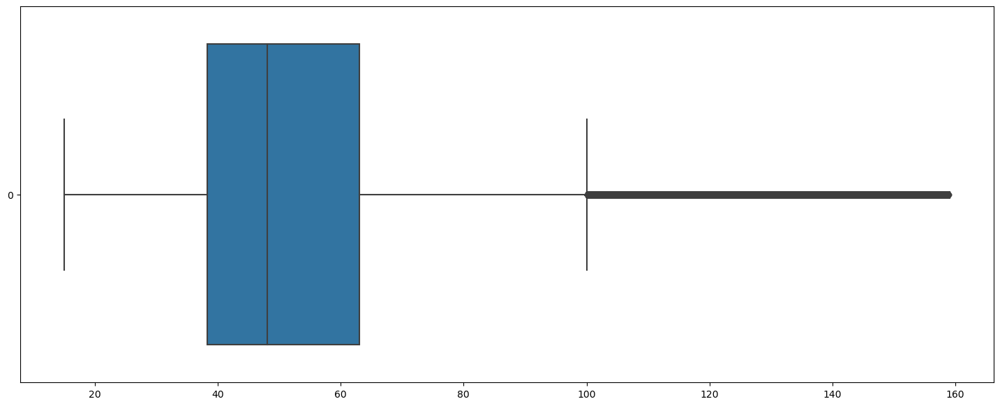

In [454]:
plt.figure(figsize=(18, 7))
sns.boxplot(df['area'], orient='h')
plt.savefig('grf13.png')

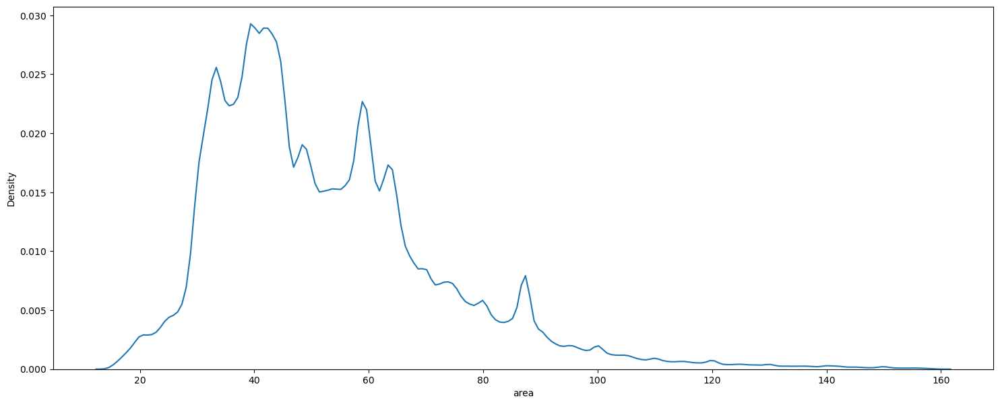

In [455]:
plt.figure(figsize=(18, 7))
sns.kdeplot(df['area'])
plt.savefig('grf14.png')

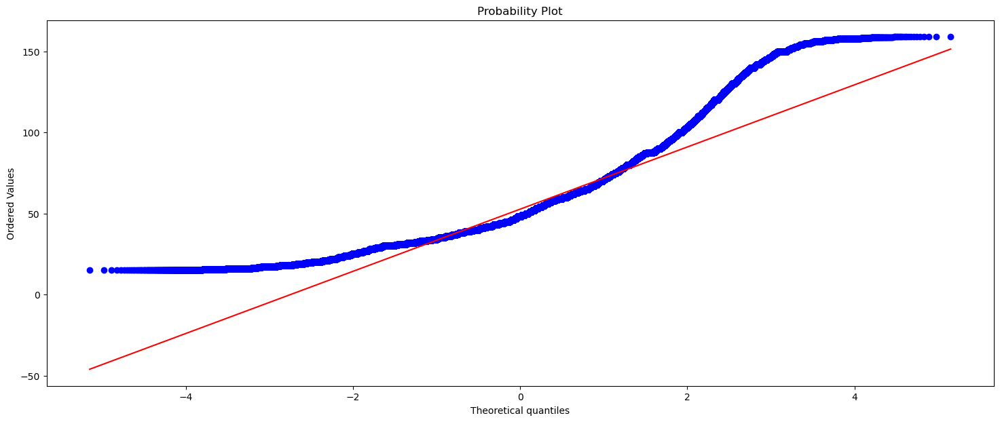

In [456]:
plt.figure(figsize=(18, 7))
st.probplot(df['area'], dist='norm', plot=plt)
plt.savefig('grf15.png')

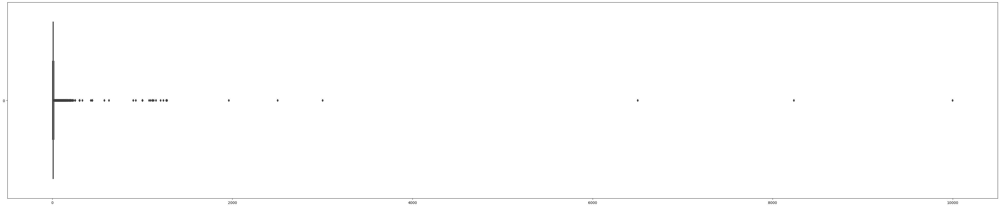

In [457]:
plt.figure(figsize=(50, 10))
sns.boxplot(df['kitchen_area'], orient='h')
plt.savefig('grf8.png')

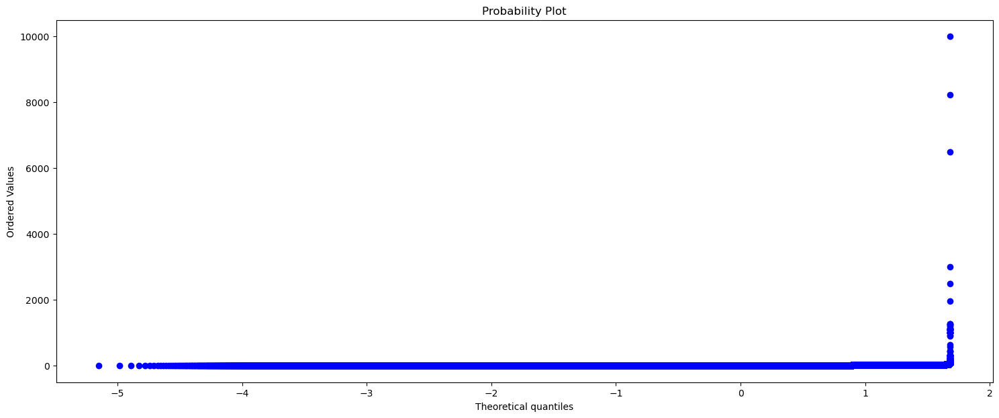

In [458]:
plt.figure(figsize=(18, 7))
st.probplot(df.kitchen_area, dist='norm', plot=plt)
plt.savefig('grf9.png')

<i><u>Данные распределены ненормально, но распределение площади подобно распределению цены, поэтому есть смысл в будущем рассмотреть зависимость между этими величинами</u></i>

<i><u>Предлагаю восполнить пропуски, а также выбросы расчётным значением в зависимости от количества комнат и общей площади</u></i>

In [459]:
rooms_list = sorted(df.query('kitchen_area.isna() and rooms != -1').rooms.unique())
rooms_list

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [460]:
x = np.array(df.query('kitchen_area.notna() and rooms != -1 and kitchen_area < area and kitchen_area != 0.0').area).reshape(-1, 1)
y = np.array(df.query('kitchen_area.notna() and rooms != -1 and kitchen_area < area and kitchen_area != 0.0').kitchen_area)
model = LinearRegression().fit(x, y)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x, y))**0.5, 4)}')
print(f'Количество квартир с невыясненной площадью кухни: {len(df.query("kitchen_area.isna()").index)}')
x_test = np.array(df.query('kitchen_area.isna()').area).reshape(-1, 1)
y_test = pd.DataFrame(model.predict(x_test)).set_index(df.query('kitchen_area.isna()').index)
df['kitchen_area'] = df['kitchen_area'].fillna(y_test.columns[0])
print(f'Незаполненных значений: {len(df.query("kitchen_area.isna()").index)}')

Модель регресии: y = 4.15 + 0.12 * x
Коэффициент корреляции: 0.4836
Количество квартир с невыясненной площадью кухни: 246690
Незаполненных значений: 0


In [461]:
df.query('kitchen_area.isna()')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i><u>Предлагаю так же заполнить ошибки, где площадь кухни больше общей</u></i>

In [462]:
df.query('area <= kitchen_area')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
3001,950000,2018-09-08,9654,3,2,9,-1,22.00,22.0,1
4026,1200000,2018-09-08,2359,3,3,9,-1,23.00,23.0,11
4408,1570000,2018-09-08,1010,3,4,5,1,32.00,65.0,1
5630,1740900,2018-09-09,9654,1,4,10,2,58.03,78.0,11
10703,1740900,2018-09-10,9654,1,4,10,2,58.03,78.0,11
...,...,...,...,...,...,...,...,...,...,...
5306097,2750000,2021-04-30,9648,4,3,3,2,45.00,45.6,1
5309524,2300000,2021-04-30,3991,0,5,16,1,23.50,23.5,1
5310767,1050000,2021-04-30,3991,0,4,5,1,18.00,18.0,1
5316034,1800000,2021-05-01,9654,2,4,18,1,18.50,18.5,1


In [463]:
x_test_2 = np.array(df.query('area <= kitchen_area').area).reshape(-1, 1)
y_test_2 = pd.DataFrame(pd.Series(model.predict(x_test_2)).apply(lambda x: round(x, 1))).set_index(df.query('area <= kitchen_area').index)
y_test_2.insert(1, 1, df.query('area <= kitchen_area')['kitchen_area'])
y_test_2.columns = ['new', 'old']
y_test_2

,new,old
3001,6.9,22.0
4026,7.0,23.0
4408,8.1,65.0
5630,11.3,78.0
10703,11.3,78.0
...,...,...
5306097,9.7,45.6
5309524,7.0,23.5
5310767,6.4,18.0
5316034,6.4,18.5


In [464]:
df['kitchen_area'] = df['kitchen_area'].replace(dict(zip(y_test_2['old'], y_test_2['new'])))
df.query('area <= kitchen_area')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [465]:
x_test_3 = np.array(df.query('kitchen_area == 0.0 and rooms != -1').area).reshape(-1, 1)
y_test_3 = pd.DataFrame(pd.Series(model.predict(x_test_3)).apply(lambda x: round(x, 1))).set_index(df.query('kitchen_area == 0.0 and rooms != -1').index)
y_test_3.insert(1, 1, df.query('kitchen_area == 0.0 and rooms != -1')['kitchen_area'])
y_test_3.columns = ['new', 'old']
y_test_3

,new,old
19,10.4,0.0
42,10.8,0.0
78,10.5,0.0
113,8.8,0.0
135,9.9,0.0
...,...,...
5326548,10.0,0.0
5326564,11.5,0.0
5326617,16.0,0.0
5326620,11.4,0.0


In [466]:
df['kitchen_area'] = df['kitchen_area'].replace(dict(zip(y_test_3['old'], y_test_3['new'])))
df.query('kitchen_area == 0.0 and rooms != -1')

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i><u>А для студий впринципе заменим площадь кухни на 0, поскольку в таких квартирах кухни нет по опрделеню</u></i>

In [467]:
df = df.reset_index(drop=True)

In [468]:
df['kitchen_area'] = np.where(df['rooms'] == -1, 0.0, df['kitchen_area'])

In [469]:
df.query('rooms == -1').kitchen_area.unique()

array([0.])

In [470]:
df['kitchen_area'].describe()

count    5.326642e+06
mean     9.023263e+00
std      4.075047e+00
min      0.000000e+00
25%      6.400000e+00
50%      9.000000e+00
75%      1.130000e+01
max      1.300000e+02
Name: kitchen_area, dtype: float64

In [471]:
print(df.query('rooms == -1').kitchen_area.describe())
print('_____________________')
for i in rooms_list:
    print(f'Количество комнат: {i}')
    print(df.query('rooms == @i').kitchen_area.describe())
    print('_____________________')
    i += 1

count    294064.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: kitchen_area, dtype: float64
_____________________
Количество комнат: 1
count    2.027230e+06
mean     9.463297e+00
std      3.263736e+00
min      1.000000e-02
25%      6.800000e+00
50%      9.500000e+00
75%      1.130000e+01
max      8.571000e+01
Name: kitchen_area, dtype: float64
_____________________
Количество комнат: 2
count    1.797331e+06
mean     9.445797e+00
std      3.507712e+00
min      1.000000e-02
25%      6.600000e+00
50%      9.000000e+00
75%      1.130000e+01
max      9.430000e+01
Name: kitchen_area, dtype: float64
_____________________
Количество комнат: 3
count    1.063498e+06
mean     9.872357e+00
std      3.960803e+00
min      1.000000e-02
25%      7.000000e+00
50%      9.000000e+00
75%      1.200000e+01
max      1.260000e+02
Name: kitchen_area, dtype: float64
_____________________
Количество комнат: 4
count    132098.

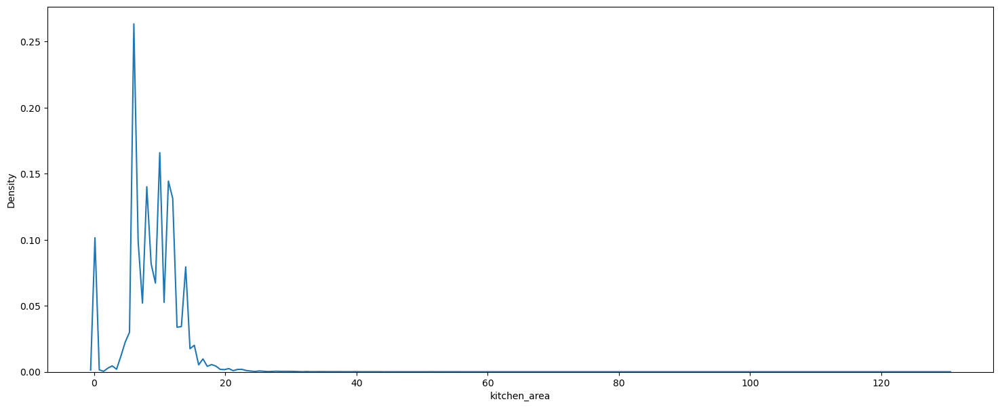

In [472]:
plt.figure(figsize=(18, 7))
sns.kdeplot(df['kitchen_area'])
plt.savefig('grf16.png')

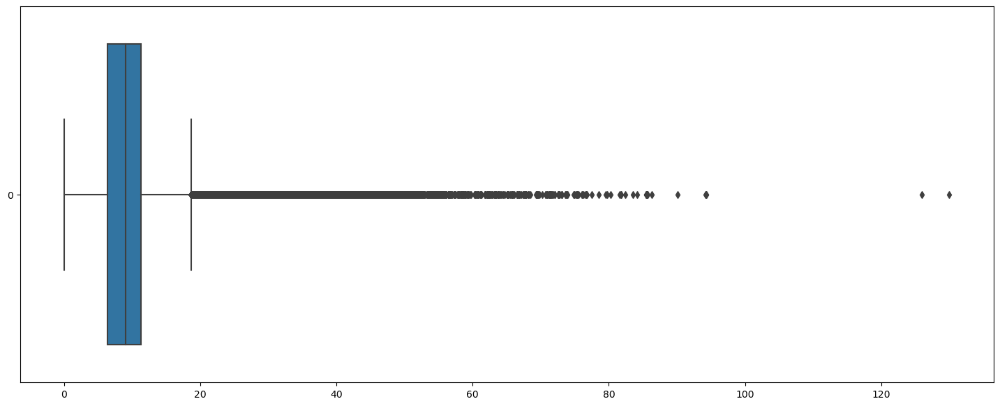

In [473]:
plt.figure(figsize=(18, 7))
sns.boxplot(df['kitchen_area'], orient='h')
plt.savefig('grf17.png')

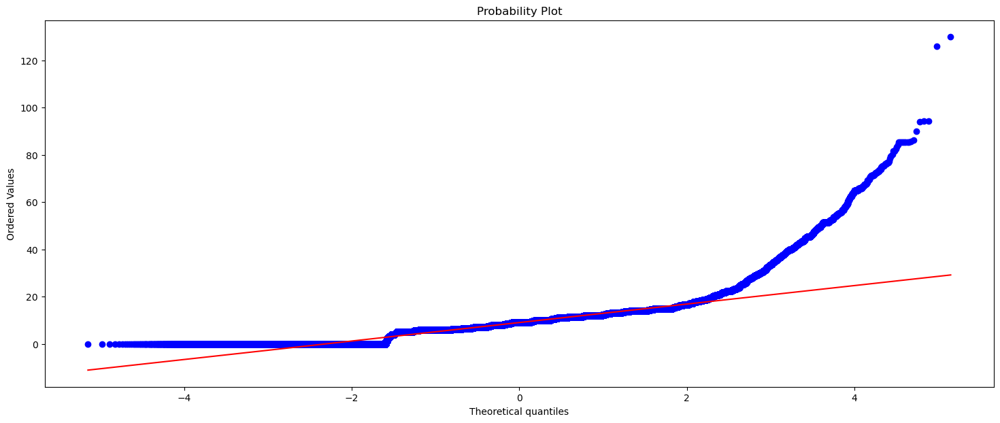

In [474]:
plt.figure(figsize=(18, 7))
st.probplot(df.kitchen_area, dist='norm', plot=plt)
plt.savefig('grf18.png')

<i><u>Не совсем, конечно, хорошо получилось, хотелось бы ещё избавиться от выбросов в роде кухни 130 м2, 0.01 м2, но не думаю, что это целесообразно</u></i>

<h3>Рассмотрение проблем в столбцах типа дома и рынка</h3>

In [475]:
df.building_type.value_counts()

building_type
1    1929813
3    1822394
2    1093020
0     300466
4     169190
5      11759
Name: count, dtype: int64

In [476]:
df.object_type.value_counts()

object_type
1     3736645
11    1589997
Name: count, dtype: int64

In [477]:
df['object_type'] = df['object_type'].replace(11, False)
df['object_type'] = df['object_type'].replace(1, True)
df['object_type'] = df['object_type'].astype('bool')
df.object_type.value_counts()

object_type
True     3736645
False    1589997
Name: count, dtype: int64

<i><u>Здесь проблем нет</u></i>

<h3>Итоговое рассмотрение датасета</h3>

In [478]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5326642 entries, 0 to 5326641
Data columns (total 10 columns):
 #   Column         Dtype  
---  ------         -----  
 0   price          int64  
 1   date           object 
 2   region         int64  
 3   building_type  int64  
 4   level          int64  
 5   levels         int64  
 6   rooms          int64  
 7   area           float64
 8   kitchen_area   float64
 9   object_type    bool   
dtypes: bool(1), float64(2), int64(6), object(1)
memory usage: 370.8+ MB


<h4>Распределение цен</h4>

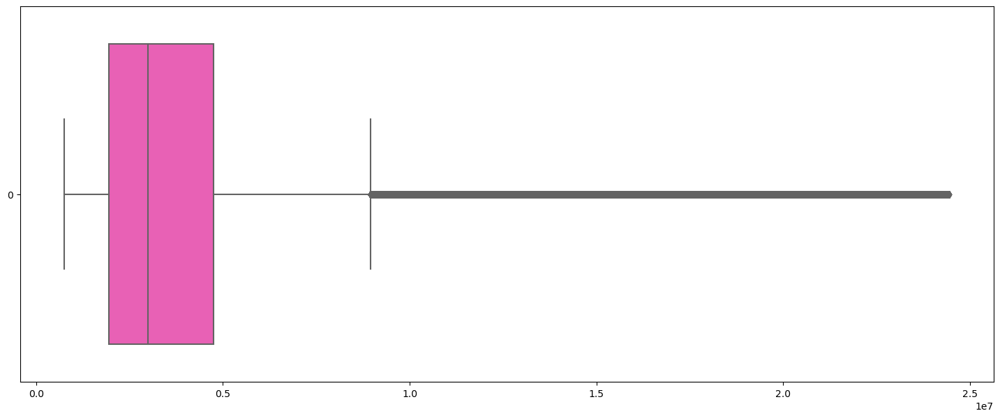

In [479]:
plt.figure(figsize=(18,7))
sns.boxplot(df.price, orient='h', color='#ff4abb')
plt.savefig('grf19.png')

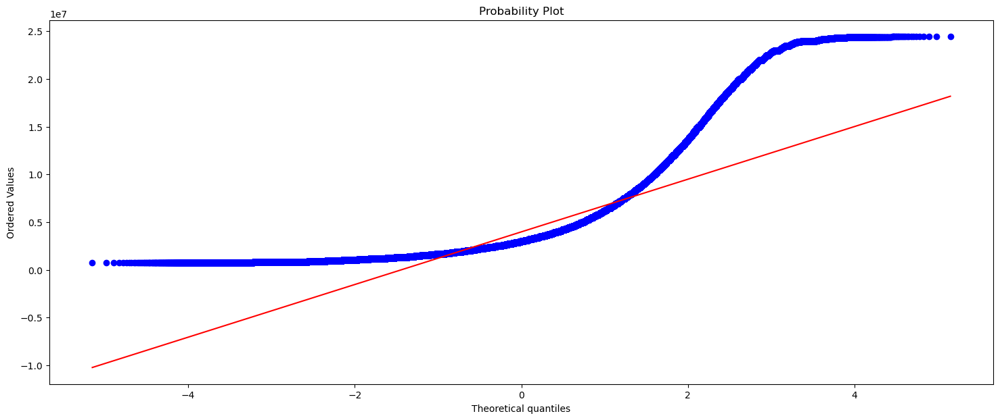

In [480]:
plt.figure(figsize=(18,7))
st.probplot(df.price, dist='norm', plot=plt)
plt.savefig('grf20.png')

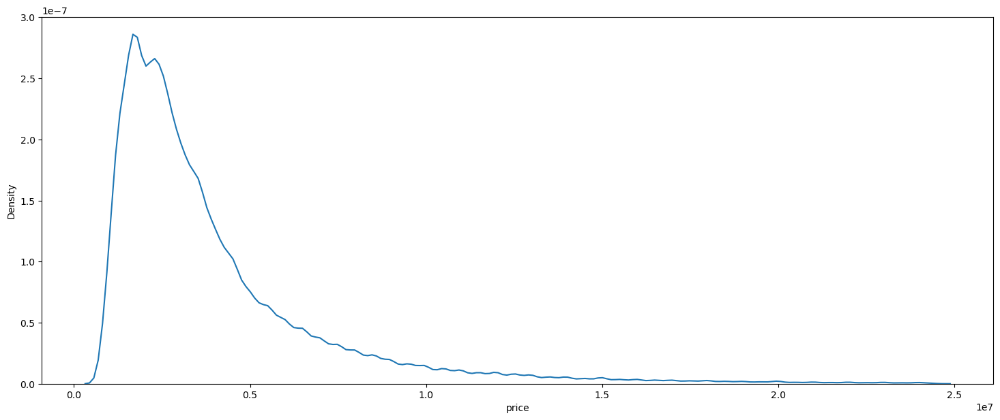

In [481]:
plt.figure(figsize=(18, 7))
sns.kdeplot(df['price'])
plt.savefig('grf21.png')

In [482]:
df.price.describe()

count    5.326642e+06
mean     3.977326e+06
std      3.174730e+06
min      7.500070e+05
25%      1.950630e+06
50%      2.990000e+06
75%      4.750000e+06
max      2.444478e+07
Name: price, dtype: float64

In [483]:
print(f'Медиана: {df.price.median()}, СКО: {round(df.price.std(), 2)}, Среднее: {round(df.price.mean(), 2)}')
print(f'Минимум: {df.price.min()}, Максимум: {df.price.max()}')

Медиана: 2990000.0, СКО: 3174729.89, Среднее: 3977325.63
Минимум: 750007, Максимум: 24444776


<i>Распределение цен не нормальное</i>

<h4>Столбец дат</h4>

In [484]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [485]:
df.groupby(df['date'].dt.month).count()

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
date,,,,,,,,,,
1,349100,349100,349100,349100,349100,349100,349100,349100,349100,349100
2,473214,473214,473214,473214,473214,473214,473214,473214,473214,473214
3,570088,570088,570088,570088,570088,570088,570088,570088,570088,570088
4,539637,539637,539637,539637,539637,539637,539637,539637,539637,539637
5,319300,319300,319300,319300,319300,319300,319300,319300,319300,319300
6,366695,366695,366695,366695,366695,366695,366695,366695,366695,366695
7,400089,400089,400089,400089,400089,400089,400089,400089,400089,400089
8,264385,264385,264385,264385,264385,264385,264385,264385,264385,264385
9,526997,526997,526997,526997,526997,526997,526997,526997,526997,526997


[]

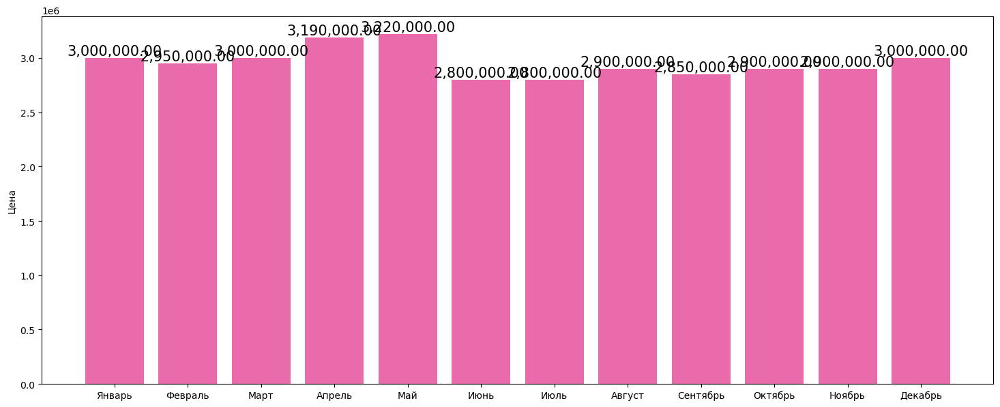

In [486]:
plt.figure(figsize=(18, 7))
ax = sns.barplot(data=df.groupby(df['date'].dt.month).count(), x=df['date'].dt.month.unique(), y=df['price'].groupby(df['date'].dt.month).median(), color='#ff56ab')
ax.bar_label(ax.containers[0], fontsize=15, fmt='{:,.2f}')
ax.set_ylabel('Цена')
ax.set_xticklabels(['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь'])
plt.plot()

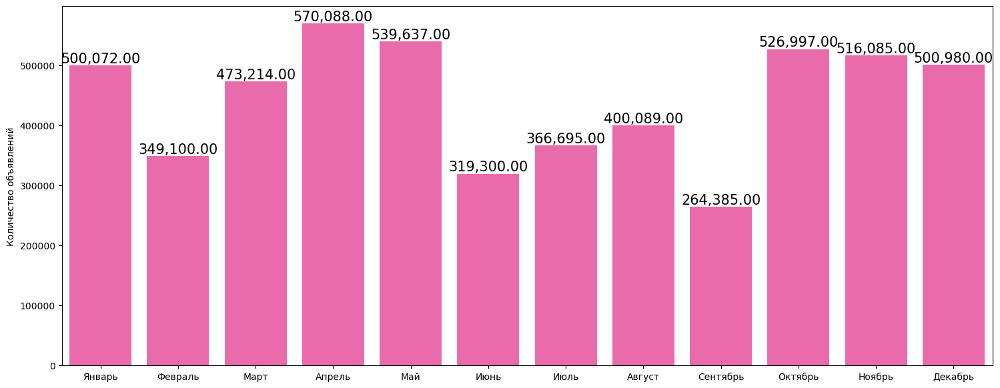

In [487]:
plt.figure(figsize=(18, 7))
ax = sns.barplot(data=df.groupby(df['date'].dt.month).count(), x=df['date'].dt.month.unique(), y=df['price'].groupby(df['date'].dt.month).count(), color='#ff56ab')
ax.bar_label(ax.containers[0], fontsize=15, fmt='{:,.2f}')
ax.set_ylabel('Количество объявлений')
ax.set_xticklabels(['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь'])
plt.savefig('grf22.png')

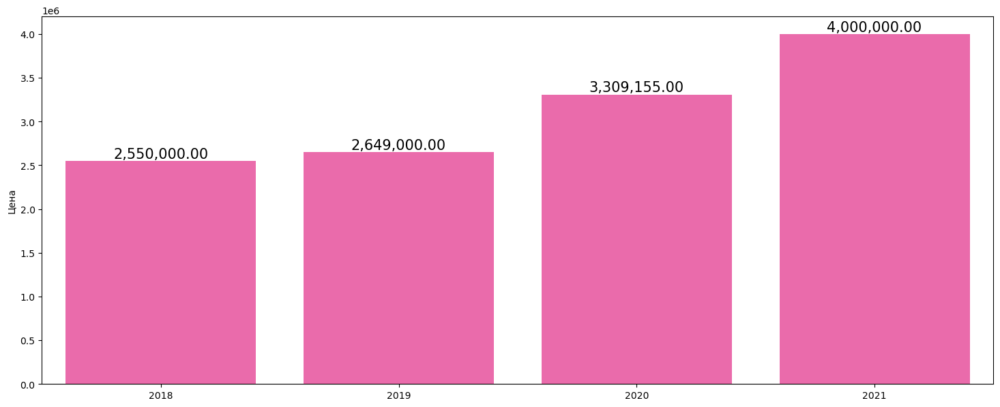

In [488]:
plt.figure(figsize=(18, 7))
ax = sns.barplot(data=df.groupby(df['date'].dt.year).count(), x=df['date'].dt.year.unique(), y=df['price'].groupby(df['date'].dt.year).median(), color='#ff56ab')
ax.bar_label(ax.containers[0], fontsize=15, fmt='{:,.2f}')
ax.set_ylabel('Цена')
plt.savefig('grf24.png')

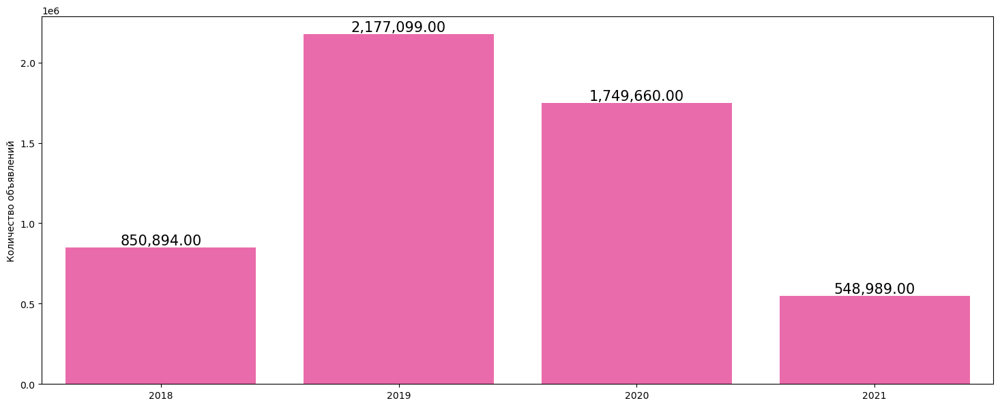

In [489]:
plt.figure(figsize=(18, 7))
ax = sns.barplot(data=df.groupby(df['date'].dt.year).count(), x=df['date'].dt.year.unique(), y=df['price'].groupby(df['date'].dt.year).count(), color='#ff56ab')
ax.bar_label(ax.containers[0], fontsize=15, fmt='{:,.2f}')
ax.set_ylabel('Количество объявлений')
plt.savefig('grf23.png')

<i>Выводы: 
<p>1. Самая дешёвая медианная цена квартиры - в июне</p>
<p>2. Цены с каждым годом только растут</p>
<p>3. Объяввлений больше всего в 2019 году</p>
<p>4. Объявлений больше всего в апреле</p>
</i>

<h4>Столбец регионов</h4>

In [490]:
df['region'].nunique()

83

In [491]:
df[df['region'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i>Недвижимость продавалась во всех регионах. Пропущенных значений нет</i>

<h4>Столбец типа дома</h4>

In [492]:
df['building_type'].nunique()

6

In [493]:
df[df['building_type'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i>Представлено 6 типов домов. Пропусков нет</i>

<h4>Столбец этажей</h4>

In [494]:
df['level'].nunique()

39

In [495]:
df['levels'].nunique()

39

In [496]:
df[df['level'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [497]:
df[df['levels'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i>Этажей в доме от 1 до 39. Квартиры продавались на каждом этаже. Пропущенных значений нет</i>

<h4>Столбец количества комнат</h4>

In [498]:
df['rooms'].nunique()

10

In [499]:
sorted(df['rooms'].unique())

[-1, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [500]:
df[df['rooms'].isna()]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


<i>На рынке представлена недвижимость разного количества комнат, от студий до девятикомнатных (скорее всего, частных домов). Пропущенных значений нет</i>

<h4>Столбец площади</h4>

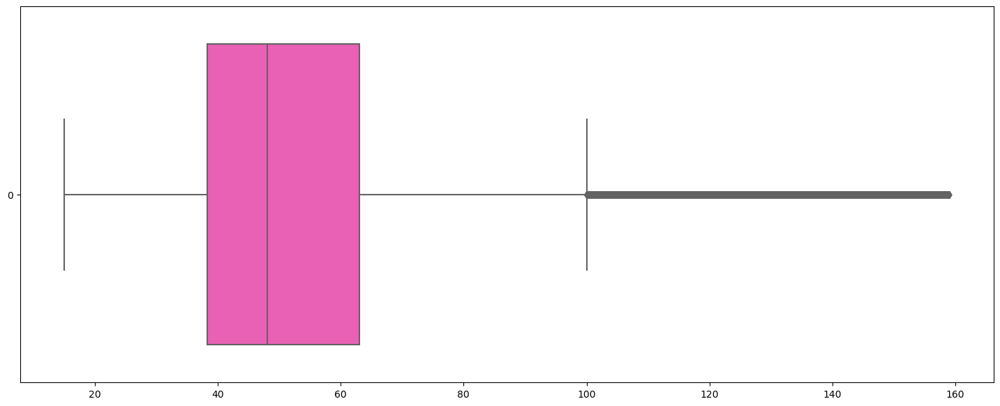

In [501]:
plt.figure(figsize=(18,7))
sns.boxplot(df.area, orient='h', color='#ff4abb')
plt.savefig('grf26.png')

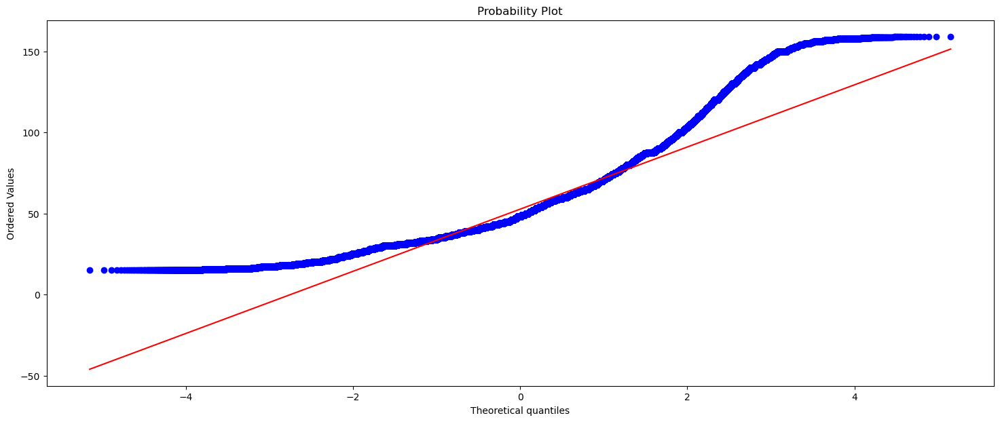

In [502]:
plt.figure(figsize=(18,7))
st.probplot(df.area, dist='norm', plot=plt)
plt.savefig('grf27.png')

In [503]:
df.area.describe()

count    5.326642e+06
mean     5.266418e+01
std      1.998719e+01
min      1.504000e+01
25%      3.830000e+01
50%      4.802000e+01
75%      6.300000e+01
max      1.589800e+02
Name: area, dtype: float64

In [504]:
print(f'Медиана: {df.area.median()}, СКО: {round(df.area.std(), 2)}, Среднее: {round(df.area.mean(), 2)}')
print(f'Минимум: {df.area.min()}, Максимум: {df.area.max()}')

Медиана: 48.02, СКО: 19.99, Среднее: 52.66
Минимум: 15.04, Максимум: 158.98


<i>Распределение площадей не нормальное</i>

<h4>Столбец площади кухни<h4>

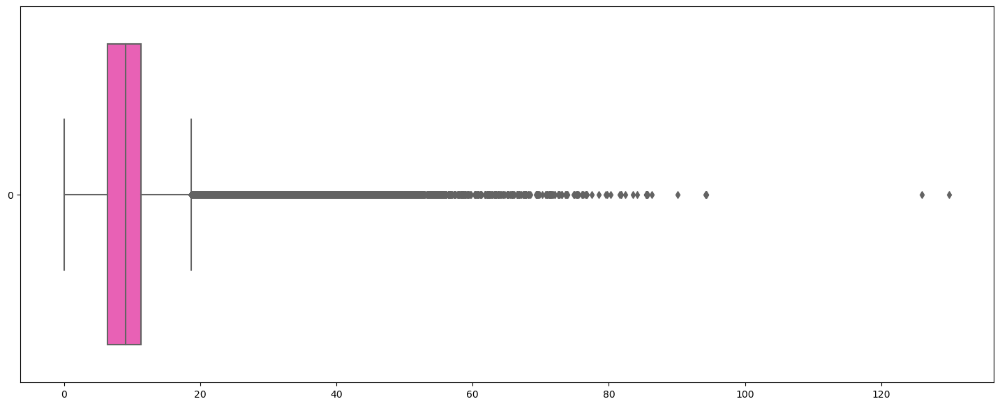

In [505]:
plt.figure(figsize=(18,7))
sns.boxplot(df.kitchen_area, orient='h', color='#ff4abb')
plt.savefig('grf25.png')

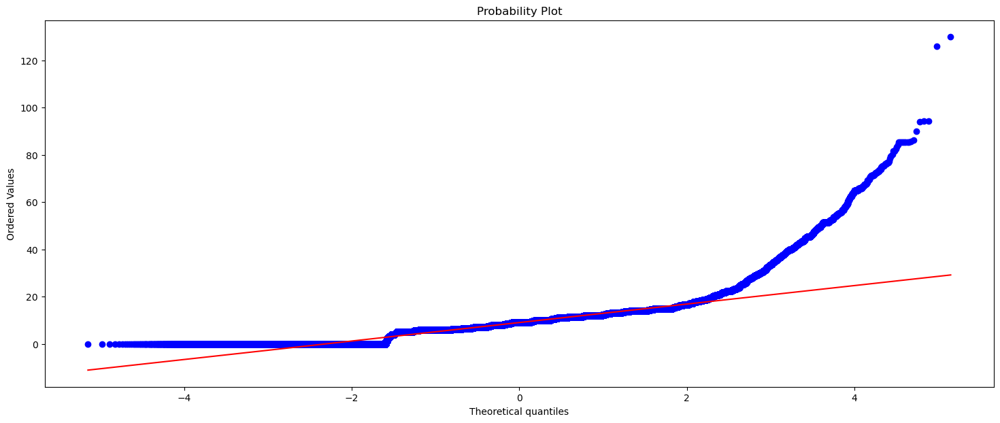

In [506]:
plt.figure(figsize=(18,7))
st.probplot(df.kitchen_area, dist='norm', plot=plt)
plt.savefig('grf28.png')

In [507]:
df[df['area'] < df['kitchen_area']]

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type


In [508]:
df.kitchen_area.describe()

count    5.326642e+06
mean     9.023263e+00
std      4.075047e+00
min      0.000000e+00
25%      6.400000e+00
50%      9.000000e+00
75%      1.130000e+01
max      1.300000e+02
Name: kitchen_area, dtype: float64

In [509]:
print(f'Медиана: {df.kitchen_area.median()}, СКО: {round(df.kitchen_area.std(), 2)}, Среднее: {round(df.kitchen_area.mean(), 2)}')
print(f'Минимум: {df.kitchen_area.min()}, Максимум: {df.kitchen_area.max()}')

Медиана: 9.0, СКО: 4.08, Среднее: 9.02
Минимум: 0.0, Максимум: 130.0


<i>Распределение площадей кухонь не нормальное, в датасете остались выбросы, 
<br>/на потом - может, перезапишу через уравнение регрессии, а может и саму модель регрессии исправлю, чтобы выбросы в ней не участвовали/</br>
</i>

<h4>Столбец рынка</h4>

In [510]:
sorted(df.object_type.unique())

[False, True]

In [511]:
df.object_type.value_counts()

object_type
True     3736645
False    1589997
Name: count, dtype: int64

<i>На рынке представлены как недвижимость из новостроек, так и вторичка. Незаполненных значений нет</i>

In [512]:
df.shape[0]

5326642

<i><strong>В датасете осталось 5326642 значений. Удалено 150364 значений (2,75%)</strong></i>

<u>Так оказалось, пункт 3 я выполнил на этапе предобработки данных, пункты 1 и 2, скорее, технические, поэтому работу начинаю с пункта 4</u>

In [513]:
df

,price,date,region,building_type,level,levels,rooms,area,kitchen_area,object_type
0,6050000,2018-02-19,2661,1,8,10,3,82.6,10.8,True
1,8650000,2018-02-27,81,3,5,24,2,69.1,12.0,True
2,4000000,2018-02-28,2871,1,5,9,3,66.0,10.0,True
3,1850000,2018-03-01,2843,4,12,16,2,38.0,5.0,False
4,5450000,2018-03-01,81,3,13,14,2,60.0,10.0,True
...,...,...,...,...,...,...,...,...,...,...
5326637,19739760,2021-05-01,3,1,8,17,4,93.2,13.8,False
5326638,12503160,2021-05-01,3,2,17,32,2,45.9,6.6,False
5326639,8800000,2021-05-01,2871,2,4,17,3,86.5,11.8,True
5326640,11831910,2021-05-01,3,1,8,33,2,52.1,6.5,False


<h2>4. Исследование цены за 1м2</h2>

<strong>Предисловие:
<br>Во-первых, надо разделить квартиры по количеству комнат, поскольку цена 1 м2 всегда будет отличаться
<br>Во-вторых, надо разделить первичный и вторичный рынки, и, по-хорошему, надо сделать разделение по возрасту дома, но такими данными мы не располагаем
<br>В-третьих, (скорее про хрущёвки и брежневки), надо разделить дома по типовым сериям, потому что есть серии с заметными недостатками, например, слышимость или холод, но этих данных тоже нет
<br>В-четвёртых, надо рассмотреть коммуникации, потому что в некоторых домах нет горячей воды, этого мы тоже не сделаем
<br>В-пятых, надо разделить регионы, потому что между регионами цены тоже разнятся</strong>

<strong><i>
А что по итогу:
<br>1. Выделим отдельно Санкт-Петербург, Ленинградскую область, Москву, Московскую область и Краснодарский край, создадим новые датасеты (6)
<br>2. Исследование будем вести отдельно сначала по количеству комнат, потом по типу рынка
<br>3. Если такая выборка будет репрезентативной (30 значений и более), то строим модель регрессии, а если нет - то делим медианную цену на медианную площадь
</i></strong>

<i>Почему датасетов я хочу сделать 6:
<br>1. В указанных регионах я ожидаю сильное отличие цены за 1 м2, что связанно с привлекательностью этих регионов
<br>2. Ленинградскую и Московскую области лучше рассматривать отдельно от Санкт-Петербурга и Москвы, потому что по площади они большие, и уровень жизни в условных Бокситогорске, Сиверском или Луге будет сильно отличаться от такового в Мурино или Кудрово. Более того, темпы ввода новой недвижимости в эксплуатацию также будут сильно отличаться</i>

<h3>Разделние датасета</h3>

In [514]:
regions.query('reg_name in ["Санкт-Петербург", "Ленинградская область", "Москва", "Московская область", "Краснодарский край"]')

,code,reg_name
0,2661,Санкт-Петербург
1,3446,Ленинградская область
2,3,Москва
3,81,Московская область
4,2843,Краснодарский край


In [515]:
realty_spb = df.query('region == 2661').reset_index(drop=True)
realty_lo = df.query('region == 3446').reset_index(drop=True)
realty_msk = df.query('region == 3').reset_index(drop=True)
realty_mo = df.query('region == 81').reset_index(drop=True)
realty_kk = df.query('region == 2843').reset_index(drop=True)
realty_mass = df.query('region not in [2661, 3446, 3, 81, 2843]').reset_index(drop=True)

In [516]:
realty_spb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444028 entries, 0 to 444027
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   price          444028 non-null  int64         
 1   date           444028 non-null  datetime64[ns]
 2   region         444028 non-null  int64         
 3   building_type  444028 non-null  int64         
 4   level          444028 non-null  int64         
 5   levels         444028 non-null  int64         
 6   rooms          444028 non-null  int64         
 7   area           444028 non-null  float64       
 8   kitchen_area   444028 non-null  float64       
 9   object_type    444028 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 30.9 MB


In [517]:
realty_lo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51939 entries, 0 to 51938
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   price          51939 non-null  int64         
 1   date           51939 non-null  datetime64[ns]
 2   region         51939 non-null  int64         
 3   building_type  51939 non-null  int64         
 4   level          51939 non-null  int64         
 5   levels         51939 non-null  int64         
 6   rooms          51939 non-null  int64         
 7   area           51939 non-null  float64       
 8   kitchen_area   51939 non-null  float64       
 9   object_type    51939 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 3.6 MB


In [518]:
realty_msk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398797 entries, 0 to 398796
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   price          398797 non-null  int64         
 1   date           398797 non-null  datetime64[ns]
 2   region         398797 non-null  int64         
 3   building_type  398797 non-null  int64         
 4   level          398797 non-null  int64         
 5   levels         398797 non-null  int64         
 6   rooms          398797 non-null  int64         
 7   area           398797 non-null  float64       
 8   kitchen_area   398797 non-null  float64       
 9   object_type    398797 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 27.8 MB


In [519]:
realty_mo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 496768 entries, 0 to 496767
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   price          496768 non-null  int64         
 1   date           496768 non-null  datetime64[ns]
 2   region         496768 non-null  int64         
 3   building_type  496768 non-null  int64         
 4   level          496768 non-null  int64         
 5   levels         496768 non-null  int64         
 6   rooms          496768 non-null  int64         
 7   area           496768 non-null  float64       
 8   kitchen_area   496768 non-null  float64       
 9   object_type    496768 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 34.6 MB


In [520]:
realty_kk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625286 entries, 0 to 625285
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   price          625286 non-null  int64         
 1   date           625286 non-null  datetime64[ns]
 2   region         625286 non-null  int64         
 3   building_type  625286 non-null  int64         
 4   level          625286 non-null  int64         
 5   levels         625286 non-null  int64         
 6   rooms          625286 non-null  int64         
 7   area           625286 non-null  float64       
 8   kitchen_area   625286 non-null  float64       
 9   object_type    625286 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 43.5 MB


In [521]:
realty_mass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3309824 entries, 0 to 3309823
Data columns (total 10 columns):
 #   Column         Dtype         
---  ------         -----         
 0   price          int64         
 1   date           datetime64[ns]
 2   region         int64         
 3   building_type  int64         
 4   level          int64         
 5   levels         int64         
 6   rooms          int64         
 7   area           float64       
 8   kitchen_area   float64       
 9   object_type    bool          
dtypes: bool(1), datetime64[ns](1), float64(2), int64(6)
memory usage: 230.4 MB


<i>На 5 регионов приходится 2'000'000 продаж из 5'300'000</i>

<h3>Рассмотрение первичного рынка</h3>

<h4>Санкт-Петербург</h4>

In [522]:
realty_spb.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,10879,10879,10879,10879,10879,10879,10879,10879,10879
1,90661,90661,90661,90661,90661,90661,90661,90661,90661
2,83432,83432,83432,83432,83432,83432,83432,83432,83432
3,56757,56757,56757,56757,56757,56757,56757,56757,56757
4,9233,9233,9233,9233,9233,9233,9233,9233,9233
5,1748,1748,1748,1748,1748,1748,1748,1748,1748
6,238,238,238,238,238,238,238,238,238
7,45,45,45,45,45,45,45,45,45
8,16,16,16,16,16,16,16,16,16


In [523]:
prices = []

<strong>Студии</strong>

In [524]:
x_st = np.array(realty_spb.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_spb.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = 1084607.81 + 100179.63 * x
Коэффициент корреляции: 0.623


<strong>Однушки</strong>

In [525]:
x_1 = np.array(realty_spb.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_spb.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = -257341.19 + 137650.54 * x
Коэффициент корреляции: 0.6742


<strong>Двушки</strong>

In [526]:
x_2 = np.array(realty_spb.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_spb.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = -3014254.55 + 179137.4 * x
Коэффициент корреляции: 0.7318


<strong>Трёшки</strong>

In [527]:
x_3 = np.array(realty_spb.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_spb.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = -3913698.81 + 170643.62 * x
Коэффициент корреляции: 0.8077


<strong>Четыре комнаты</strong>

In [528]:
x_4 = np.array(realty_spb.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_spb.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = -2726716.05 + 143034.75 * x
Коэффициент корреляции: 0.7801


<strong>Пять комнат</strong>

In [529]:
x_5 = np.array(realty_spb.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_spb.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = 195736.02 + 107283.66 * x
Коэффициент корреляции: 0.5989


<strong>Шесть комнат</strong>

In [530]:
x_6 = np.array(realty_spb.query('rooms == 6 and object_type == True').area).reshape(-1, 1)
y_6 = np.array(realty_spb.query('rooms == 6 and object_type == True').price)
model = LinearRegression().fit(x_6, y_6)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_6, y_6))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = 2467378.67 + 84515.06 * x
Коэффициент корреляции: 0.3743


<strong>Семь комнат</strong>

In [531]:
x_7 = np.array(realty_spb.query('rooms == 7 and object_type == True').area).reshape(-1, 1)
y_7 = np.array(realty_spb.query('rooms == 7 and object_type == True').price)
model = LinearRegression().fit(x_7, y_7)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_7, y_7))**0.5, 4)}')
prices.append(round(model.coef_.item(), 2))

Модель регресии: y = 2536930.87 + 97499.78 * x
Коэффициент корреляции: 0.5882


<strong>Восемь комнат</strong>

In [532]:
price = realty_spb.query('rooms == 8 and object_type == True').price.median() / realty_spb.query('rooms == 8 and object_type == True').area.median()
price

114652.85769083237

In [533]:
prices.append(price)

<strong>Девять комнат</strong>

In [534]:
price = realty_spb.query('rooms == 9 and object_type == True').price.median() / realty_spb.query('rooms == 9 and object_type == True').area.median()
price

137164.0407784986

In [535]:
prices.append(price)

<strong><i>
Подведение итогов
</i></strong>

In [536]:
prices = pd.DataFrame(pd.Series(prices).apply(lambda x: round(x, 2)))
prices

,0
0,100179.63
1,137650.54
2,179137.40
3,170643.62
4,143034.75
5,107283.66
6,84515.06
7,97499.78
8,114652.86
9,137164.04


In [537]:
prices.columns = ['price_m2']
prices

,price_m2
0,100179.63
1,137650.54
2,179137.40
3,170643.62
4,143034.75
5,107283.66
6,84515.06
7,97499.78
8,114652.86
9,137164.04


[Text(0, 0, '100180'),
 Text(0, 0, '137651'),
 Text(0, 0, '179137'),
 Text(0, 0, '170644'),
 Text(0, 0, '143035'),
 Text(0, 0, '107284'),
 Text(0, 0, '84515.1'),
 Text(0, 0, '97499.8'),
 Text(0, 0, '114653'),
 Text(0, 0, '137164')]

<Figure size 900x1700 with 0 Axes>

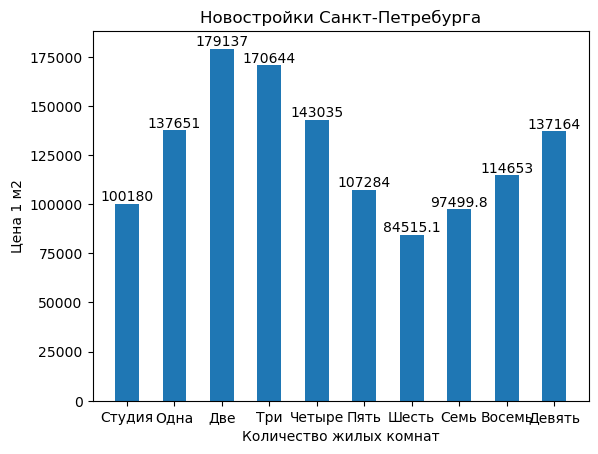

In [538]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices['price_m2'], width)
ax.set_title('Новостройки Санкт-Петребурга')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Вывод: самая маленькая цена за 1 м2 у шестикомнатного жилья, самая большая - у двушек и трёшек, потому что они пользуются повышенным спросом
</u></i></strong>

<h4>Ленинградская область</h4>

In [539]:
realty_lo.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,2956,2956,2956,2956,2956,2956,2956,2956,2956
1,16680,16680,16680,16680,16680,16680,16680,16680,16680
2,12312,12312,12312,12312,12312,12312,12312,12312,12312
3,6116,6116,6116,6116,6116,6116,6116,6116,6116
4,589,589,589,589,589,589,589,589,589
5,40,40,40,40,40,40,40,40,40
6,3,3,3,3,3,3,3,3,3
7,1,1,1,1,1,1,1,1,1
8,1,1,1,1,1,1,1,1,1


In [540]:
prices_nov_lo = []

<strong>Студии</strong>

In [541]:
x_st = np.array(realty_lo.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_lo.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 2102513.25 + 32410.34 * x
Коэффициент корреляции: 0.2367


<strong>Однушки</strong>

In [542]:
x_1 = np.array(realty_lo.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_lo.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 586222.35 + 75704.94 * x
Коэффициент корреляции: 0.3419


<strong>Двушки</strong>

In [543]:
x_2 = np.array(realty_lo.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_lo.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = -2501263.18 + 120838.25 * x
Коэффициент корреляции: 0.5837


<strong>Трёшки</strong>

In [544]:
x_3 = np.array(realty_lo.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_lo.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = -3502496.1 + 114412.81 * x
Коэффициент корреляции: 0.6366


<strong>Четыре комнаты</strong>

In [545]:
x_4 = np.array(realty_lo.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_lo.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = -3273744.1 + 95316.44 * x
Коэффициент корреляции: 0.7253


<strong>Пять комнат</strong>

In [546]:
x_5 = np.array(realty_lo.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_lo.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_nov_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = -4703883.69 + 93974.36 * x
Коэффициент корреляции: 0.6291


<strong>Шесть комнат</strong>

In [547]:
price = realty_lo.query('rooms == 6 and object_type == True').price.median() / realty_lo.query('rooms == 6 and object_type == True').area.median()
price

31538.46153846154

In [548]:
prices_nov_lo.append(price)

<strong>Семь комнат</strong>

In [549]:
price = realty_lo.query('rooms == 7 and object_type == True').price.median() / realty_lo.query('rooms == 7 and object_type == True').area.median()
price

36259.54198473283

In [550]:
prices_nov_lo.append(price)

<strong>Восемь комнат</strong>

In [551]:
price = realty_lo.query('rooms == 8 and object_type == True').price.median() / realty_lo.query('rooms == 8 and object_type == True').area.median()
price

92207.79220779221

In [552]:
prices_nov_lo.append(price)

<strong>Девять комнат</strong>

In [553]:
price = realty_lo.query('rooms == 9 and object_type == True').price.median() / realty_lo.query('rooms == 9 and object_type == True').area.median()
price

92473.1182795699

In [554]:
prices_nov_lo.append(price)

<strong><i>
Подведение итогов
</i></strong>

In [555]:
prices_nov_lo = pd.DataFrame(pd.Series(prices_nov_lo).apply(lambda x: round(x, 2)))
prices_nov_lo.columns = ['price_m2']
prices_nov_lo

,price_m2
0,32410.34
1,75704.94
2,120838.25
3,114412.81
4,95316.44
5,93974.36
6,31538.46
7,36259.54
8,92207.79
9,92473.12


[Text(0, 0, '32410.3'),
 Text(0, 0, '75704.9'),
 Text(0, 0, '120838'),
 Text(0, 0, '114413'),
 Text(0, 0, '95316.4'),
 Text(0, 0, '93974.4'),
 Text(0, 0, '31538.5'),
 Text(0, 0, '36259.5'),
 Text(0, 0, '92207.8'),
 Text(0, 0, '92473.1')]

<Figure size 900x1700 with 0 Axes>

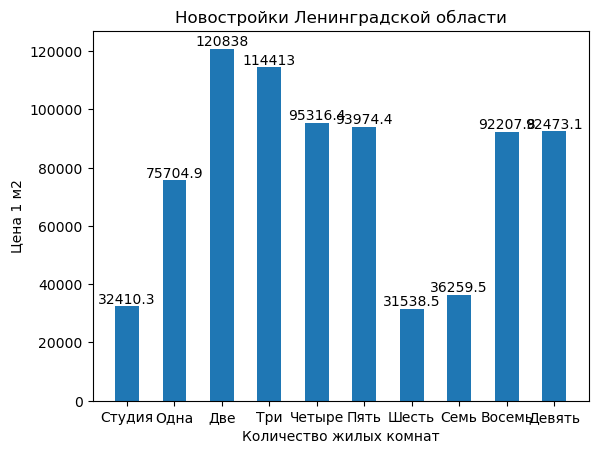

In [556]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_nov_lo['price_m2'], width)
ax.set_title('Новостройки Ленинградской области')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы: самая маленькая цена за 1 м2 у шести- и семикомнатного жилья и (внезапно) у квартир-студий, самая большая - у двушек и трёшек, потому что они пользуются повышенным спросом
</u></i></strong>

<h4>Москва</h4>

In [557]:
realty_msk.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,14167,14167,14167,14167,14167,14167,14167,14167,14167
1,68842,68842,68842,68842,68842,68842,68842,68842,68842
2,81875,81875,81875,81875,81875,81875,81875,81875,81875
3,50118,50118,50118,50118,50118,50118,50118,50118,50118
4,5168,5168,5168,5168,5168,5168,5168,5168,5168
5,502,502,502,502,502,502,502,502,502
6,44,44,44,44,44,44,44,44,44
7,15,15,15,15,15,15,15,15,15
8,5,5,5,5,5,5,5,5,5


In [558]:
prices_nov_msk = []

<strong>Студии</strong>

In [559]:
x_st = np.array(realty_msk.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_msk.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 313037.2 + 192753.57 * x
Коэффициент корреляции: 0.7023


<strong>Однушки</strong>

In [560]:
x_1 = np.array(realty_msk.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_msk.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = -68040.99 + 208374.25 * x
Коэффициент корреляции: 0.4644


<strong>Двушки</strong>

In [561]:
x_2 = np.array(realty_msk.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_msk.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 651422.74 + 186808.36 * x
Коэффициент корреляции: 0.5001


<strong>Трёшки</strong>

In [562]:
x_3 = np.array(realty_msk.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_msk.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 2123045.81 + 152522.69 * x
Коэффициент корреляции: 0.4868


<strong>Четыре комнаты</strong>

In [563]:
x_4 = np.array(realty_msk.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_msk.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 3615136.81 + 132444.53 * x
Коэффициент корреляции: 0.5027


<strong>Пять комнат</strong>

In [564]:
x_5 = np.array(realty_msk.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_msk.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 7853757.25 + 86238.38 * x
Коэффициент корреляции: 0.431


<strong>Шесть комнат</strong>

In [565]:
x_6 = np.array(realty_msk.query('rooms == 6 and object_type == True').area).reshape(-1, 1)
y_6 = np.array(realty_msk.query('rooms == 6 and object_type == True').price)
model = LinearRegression().fit(x_6, y_6)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_6, y_6))**0.5, 4)}')
prices_nov_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 8423017.23 + 77393.22 * x
Коэффициент корреляции: 0.556


<strong>Семь комнат</strong>

In [566]:
price = realty_msk.query('rooms == 7 and object_type == True').price.median() / realty_msk.query('rooms == 7 and object_type == True').area.median()
price

113475.17730496454

In [567]:
prices_nov_msk.append(price)

<strong>Восемь комнат</strong>

In [568]:
price = realty_msk.query('rooms == 8 and object_type == True').price.median() / realty_msk.query('rooms == 8 and object_type == True').area.median()
price

288461.53846153844

In [569]:
prices_nov_msk.append(price)

<strong>Девять комнат</strong>

In [570]:
price = realty_msk.query('rooms == 9 and object_type == True').price.median() / realty_msk.query('rooms == 9 and object_type == True').area.median()
price

227665.7060518732

In [571]:
prices_nov_msk.append(price)

<strong><i>
Подведение итогов
</i></strong>

In [572]:
prices_nov_msk = pd.DataFrame(pd.Series(prices_nov_msk).apply(lambda x: round(x, 2)))
prices_nov_msk.columns = ['price_m2']
prices_nov_msk

,price_m2
0,192753.57
1,208374.25
2,186808.36
3,152522.69
4,132444.53
5,86238.38
6,77393.22
7,113475.18
8,288461.54
9,227665.71


[Text(0, 0, '192754'),
 Text(0, 0, '208374'),
 Text(0, 0, '186808'),
 Text(0, 0, '152523'),
 Text(0, 0, '132445'),
 Text(0, 0, '86238.4'),
 Text(0, 0, '77393.2'),
 Text(0, 0, '113475'),
 Text(0, 0, '288462'),
 Text(0, 0, '227666')]

<Figure size 900x1700 with 0 Axes>

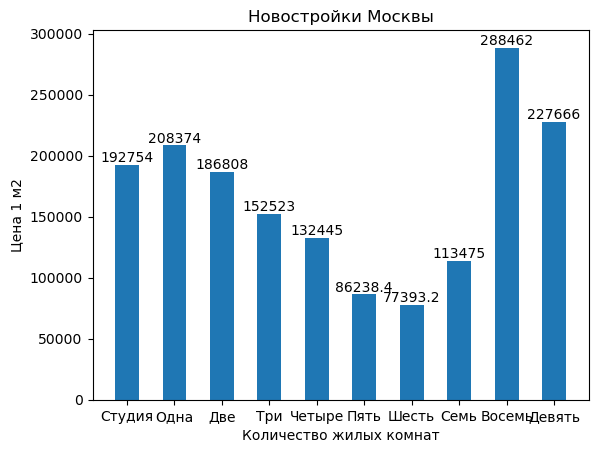

In [573]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_nov_msk['price_m2'], width)
ax.set_title('Новостройки Москвы')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. По большому счёту, самая дорогая в Москве недвижимость - восьми- и девятикомнатная, но таких объектов только один
<br>2. Из массового жилья самая большая цена за 1 м2 - у однушек, студий и двушек, это отличается от Санкт-Петребурга и Ленинградской области
<br>3. Самый дешёвый квадратный метр в пяти- и шестикомнатных квартирах
</u></i></strong>

<h4>Московская область</h4>

In [574]:
realty_mo.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,8548,8548,8548,8548,8548,8548,8548,8548,8548
1,139923,139923,139923,139923,139923,139923,139923,139923,139923
2,144264,144264,144264,144264,144264,144264,144264,144264,144264
3,74148,74148,74148,74148,74148,74148,74148,74148,74148
4,7414,7414,7414,7414,7414,7414,7414,7414,7414
5,656,656,656,656,656,656,656,656,656
6,47,47,47,47,47,47,47,47,47
7,7,7,7,7,7,7,7,7,7
8,2,2,2,2,2,2,2,2,2


In [575]:
prices_nov_mo = []

<strong>Студии</strong>

In [576]:
x_st = np.array(realty_mo.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_mo.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 1281997.38 + 72911.07 * x
Коэффициент корреляции: 0.5363


<strong>Однушки</strong>

In [577]:
x_1 = np.array(realty_mo.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_mo.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -1035144.21 + 123403.1 * x
Коэффициент корреляции: 0.5237


<strong>Двушки</strong>

In [578]:
x_2 = np.array(realty_mo.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_mo.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -2522768.5 + 133898.97 * x
Коэффициент корреляции: 0.6214


<strong>Трёшки</strong>

In [579]:
x_3 = np.array(realty_mo.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_mo.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -3088518.27 + 125894.03 * x
Коэффициент корреляции: 0.6393


<strong>Четыре комнаты</strong>

In [580]:
x_4 = np.array(realty_mo.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_mo.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -3289713.6 + 120120.25 * x
Коэффициент корреляции: 0.6815


<strong>Пять комнат</strong>

In [581]:
x_5 = np.array(realty_mo.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_mo.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -2218738.0 + 103383.02 * x
Коэффициент корреляции: 0.6005


<strong>Шесть комнат</strong>

In [582]:
x_6 = np.array(realty_mo.query('rooms == 6 and object_type == True').area).reshape(-1, 1)
y_6 = np.array(realty_mo.query('rooms == 6 and object_type == True').price)
model = LinearRegression().fit(x_6, y_6)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_6, y_6))**0.5, 4)}')
prices_nov_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = -2136240.77 + 85063.75 * x
Коэффициент корреляции: 0.5495


<strong>Семь комнат</strong>

In [583]:
price = realty_mo.query('rooms == 7 and object_type == True').price.median() / realty_mo.query('rooms == 7 and object_type == True').area.median()
price

85810.81081081081

In [584]:
prices_nov_mo.append(price)

<strong>Восемь комнат</strong>

In [585]:
price = realty_mo.query('rooms == 8 and object_type == True').price.median() / realty_mo.query('rooms == 8 and object_type == True').area.median()
price

54072.110286320254

In [586]:
prices_nov_mo.append(price)

<strong>Девять комнат</strong>

In [587]:
price = realty_mo.query('rooms == 9 and object_type == True').price.median() / realty_mo.query('rooms == 9 and object_type == True').area.median()
price

95348.83720930232

In [588]:
prices_nov_mo.append(price)

<strong><i>
Подведение итогов
</i></strong>

In [589]:
prices_nov_mo = pd.DataFrame(pd.Series(prices_nov_mo).apply(lambda x: round(x, 2)))
prices_nov_mo.columns = ['price_m2']
prices_nov_mo

,price_m2
0,72911.07
1,123403.10
2,133898.97
3,125894.03
4,120120.25
5,103383.02
6,85063.75
7,85810.81
8,54072.11
9,95348.84


[Text(0, 0, '72911.1'),
 Text(0, 0, '123403'),
 Text(0, 0, '133899'),
 Text(0, 0, '125894'),
 Text(0, 0, '120120'),
 Text(0, 0, '103383'),
 Text(0, 0, '85063.8'),
 Text(0, 0, '85810.8'),
 Text(0, 0, '54072.1'),
 Text(0, 0, '95348.8')]

<Figure size 900x1700 with 0 Axes>

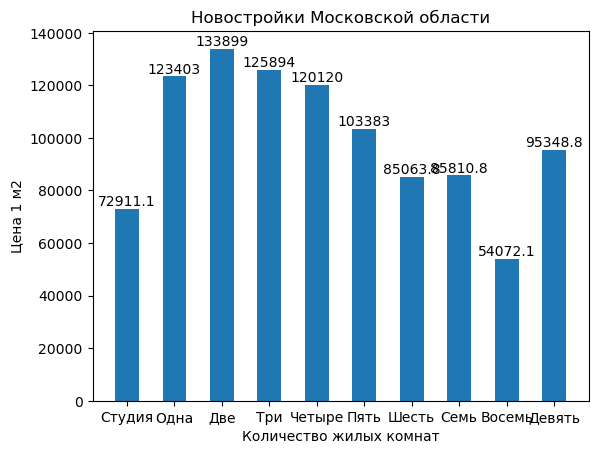

In [590]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_nov_mo['price_m2'], width)
ax.set_title('Новостройки Московской области')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. Московская область повторяет тенденцию за Санкт-Петербургом и Ленинградской областью, что самый дорогой 1 м2 в двушках и  трёшках, но цена за 1 м2 в однушках и четырёхкомнатных квартирах примерно равна цене 1 м2 в трёшках
<br>2. Квадратный метр в студиях самый дешёвый (если рассматривать массовое жильё), восьмикомнатного жилья только 2 объекта
<br>3. Больше всего продаются двухкомнатные квартиры (и однокомнатные - на 10000 объектов меньше)
</u></i></strong>

<h4>Краснодарский край</h4>

In [591]:
realty_kk.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,19805,19805,19805,19805,19805,19805,19805,19805,19805
1,229831,229831,229831,229831,229831,229831,229831,229831,229831
2,176687,176687,176687,176687,176687,176687,176687,176687,176687
3,88288,88288,88288,88288,88288,88288,88288,88288,88288
4,9191,9191,9191,9191,9191,9191,9191,9191,9191
5,877,877,877,877,877,877,877,877,877
6,67,67,67,67,67,67,67,67,67
7,15,15,15,15,15,15,15,15,15
8,3,3,3,3,3,3,3,3,3


In [592]:
prices_nov_kk = []

<strong>Студии</strong>

In [593]:
x_st = np.array(realty_kk.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_kk.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -553970.29 + 100369.89 * x
Коэффициент корреляции: 0.5462


<strong>Однушки</strong>

In [594]:
x_1 = np.array(realty_kk.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_kk.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -236415.27 + 71208.42 * x
Коэффициент корреляции: 0.4208


<strong>Двушки</strong>

In [595]:
x_2 = np.array(realty_kk.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_kk.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -1013519.38 + 84023.57 * x
Коэффициент корреляции: 0.4867


<strong>Трёшки</strong>

In [596]:
x_3 = np.array(realty_kk.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_kk.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -2782542.53 + 101200.22 * x
Коэффициент корреляции: 0.6344


<strong>Четыре комнаты</strong>

In [597]:
x_4 = np.array(realty_kk.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_kk.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -3757515.5 + 103502.77 * x
Коэффициент корреляции: 0.654


<strong>Пять комнат</strong>

In [598]:
x_5 = np.array(realty_kk.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_kk.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -694253.57 + 70209.25 * x
Коэффициент корреляции: 0.5027


<strong>Шесть комнат</strong>

In [599]:
x_6 = np.array(realty_kk.query('rooms == 6 and object_type == True').area).reshape(-1, 1)
y_6 = np.array(realty_kk.query('rooms == 6 and object_type == True').price)
model = LinearRegression().fit(x_6, y_6)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_6, y_6))**0.5, 4)}')
prices_nov_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -621447.47 + 69736.27 * x
Коэффициент корреляции: 0.488


<strong>Семь комнат</strong>

In [600]:
price = realty_kk.query('rooms == 7 and object_type == True').price.median() / realty_kk.query('rooms == 7 and object_type == True').area.median()
price

60714.28571428572

In [601]:
prices_nov_kk.append(price)

<strong>Восемь комнат</strong>

In [602]:
price = realty_kk.query('rooms == 8 and object_type == True').price.median() / realty_kk.query('rooms == 8 and object_type == True').area.median()
price

34570.09345794393

In [603]:
prices_nov_kk.append(price)

<strong>Девять комнат</strong>

In [604]:
price = realty_kk.query('rooms == 9 and object_type == True').price.median() / realty_kk.query('rooms == 9 and object_type == True').area.median()
price

59720.457433290976

In [605]:
prices_nov_kk.append(price)

<strong><i>
Подведение итогов
</i></strong>

In [606]:
prices_nov_kk = pd.DataFrame(pd.Series(prices_nov_kk).apply(lambda x: round(x, 2)))
prices_nov_kk.columns = ['price_m2']
prices_nov_kk

,price_m2
0,100369.89
1,71208.42
2,84023.57
3,101200.22
4,103502.77
5,70209.25
6,69736.27
7,60714.29
8,34570.09
9,59720.46


[Text(0, 0, '100370'),
 Text(0, 0, '71208.4'),
 Text(0, 0, '84023.6'),
 Text(0, 0, '101200'),
 Text(0, 0, '103503'),
 Text(0, 0, '70209.2'),
 Text(0, 0, '69736.3'),
 Text(0, 0, '60714.3'),
 Text(0, 0, '34570.1'),
 Text(0, 0, '59720.5')]

<Figure size 900x1700 with 0 Axes>

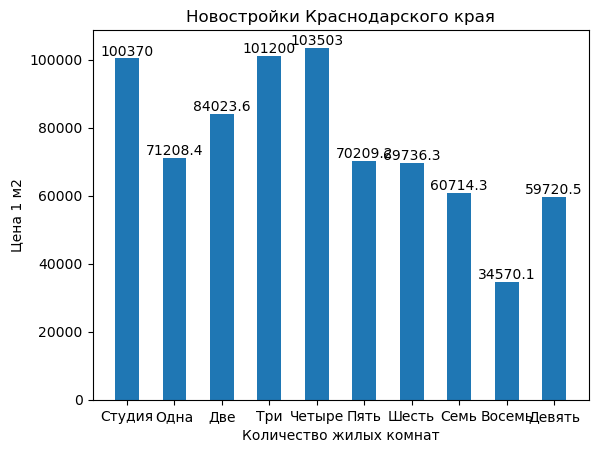

In [607]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_nov_kk['price_m2'], width)
ax.set_title('Новостройки Краснодарского края')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. Краснодарский край не следует ранее обозначенной тенденции
<br>2. Самый дорогой 1 м2 - в четырёхкомнатных квартирах и, с небольшим отрывом - в трёхкомнатных и студиях
<br>3. В Краснодарском крае выгодно покупать однокомнатные квартиры, 1 м2 стоит меньше всего за просмотренные ранее регионы
</u></i></strong>

<h4>Оставшиеся регионы</h4>

In [608]:
realty_mass.query('object_type == True').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,84659,84659,84659,84659,84659,84659,84659,84659,84659
1,807547,807547,807547,807547,807547,807547,807547,807547,807547
2,815493,815493,815493,815493,815493,815493,815493,815493,815493
3,523651,523651,523651,523651,523651,523651,523651,523651,523651
4,86048,86048,86048,86048,86048,86048,86048,86048,86048
5,6629,6629,6629,6629,6629,6629,6629,6629,6629
6,239,239,239,239,239,239,239,239,239
7,43,43,43,43,43,43,43,43,43
8,25,25,25,25,25,25,25,25,25


In [609]:
prices_nov_mass = []

<strong>Студии</strong>

In [610]:
x_st = np.array(realty_mass.query('rooms == -1 and object_type == True').area).reshape(-1, 1)
y_st = np.array(realty_mass.query('rooms == -1 and object_type == True').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 215932.79 + 50765.09 * x
Коэффициент корреляции: 0.6262


<strong>Однушки</strong>

In [611]:
x_1 = np.array(realty_mass.query('rooms == 1 and object_type == True').area).reshape(-1, 1)
y_1 = np.array(realty_mass.query('rooms == 1 and object_type == True').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 61018.99 + 56866.23 * x
Коэффициент корреляции: 0.476


<strong>Двушки</strong>

In [612]:
x_2 = np.array(realty_mass.query('rooms == 2 and object_type == True').area).reshape(-1, 1)
y_2 = np.array(realty_mass.query('rooms == 2 and object_type == True').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -1265774.47 + 79976.4 * x
Коэффициент корреляции: 0.6132


<strong>Трёшки</strong>

In [613]:
x_3 = np.array(realty_mass.query('rooms == 3 and object_type == True').area).reshape(-1, 1)
y_3 = np.array(realty_mass.query('rooms == 3 and object_type == True').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -2314376.09 + 86650.49 * x
Коэффициент корреляции: 0.692


<strong>Четыре комнаты</strong>

In [614]:
x_4 = np.array(realty_mass.query('rooms == 4 and object_type == True').area).reshape(-1, 1)
y_4 = np.array(realty_mass.query('rooms == 4 and object_type == True').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -2777396.38 + 83754.78 * x
Коэффициент корреляции: 0.7084


<strong>Пять комнат</strong>

In [615]:
x_5 = np.array(realty_mass.query('rooms == 5 and object_type == True').area).reshape(-1, 1)
y_5 = np.array(realty_mass.query('rooms == 5 and object_type == True').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -2106836.11 + 72147.99 * x
Коэффициент корреляции: 0.5961


<strong>Шесть комнат</strong>

In [616]:
x_6 = np.array(realty_mass.query('rooms == 6 and object_type == True').area).reshape(-1, 1)
y_6 = np.array(realty_mass.query('rooms == 6 and object_type == True').price)
model = LinearRegression().fit(x_6, y_6)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_6, y_6))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -1524127.5 + 60179.44 * x
Коэффициент корреляции: 0.5572


<strong>Семь комнат</strong>

In [617]:
x_7 = np.array(realty_mass.query('rooms == 7 and object_type == True').area).reshape(-1, 1)
y_7 = np.array(realty_mass.query('rooms == 7 and object_type == True').price)
model = LinearRegression().fit(x_7, y_7)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_7, y_7))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 141898.04 + 39777.66 * x
Коэффициент корреляции: 0.4245


<strong>Восемь комнат</strong>

In [618]:
price = realty_mass.query('rooms == 8 and object_type == True').price.median() / realty_kk.query('rooms == 8 and object_type == True').area.median()
price

28598.130841121496

In [619]:
prices_nov_mass.append(price)

<strong>Девять комнат</strong>

In [620]:
x_9 = np.array(realty_mass.query('rooms == 9 and object_type == True').area).reshape(-1, 1)
y_9 = np.array(realty_mass.query('rooms == 9 and object_type == True').price)
model = LinearRegression().fit(x_9, y_9)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_9, y_9))**0.5, 4)}')
prices_nov_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -124394.63 + 48354.34 * x
Коэффициент корреляции: 0.7332


<strong><i>
Подведение итогов
</i></strong>

In [621]:
prices_nov_mass = pd.DataFrame(pd.Series(prices_nov_mass).apply(lambda x: round(x, 2)))
prices_nov_mass.columns = ['price_m2']
prices_nov_mass

,price_m2
0,50765.09
1,56866.23
2,79976.40
3,86650.49
4,83754.78
5,72147.99
6,60179.44
7,39777.66
8,28598.13
9,48354.34


[Text(0, 0, '50765.1'),
 Text(0, 0, '56866.2'),
 Text(0, 0, '79976.4'),
 Text(0, 0, '86650.5'),
 Text(0, 0, '83754.8'),
 Text(0, 0, '72148'),
 Text(0, 0, '60179.4'),
 Text(0, 0, '39777.7'),
 Text(0, 0, '28598.1'),
 Text(0, 0, '48354.3')]

<Figure size 900x1700 with 0 Axes>

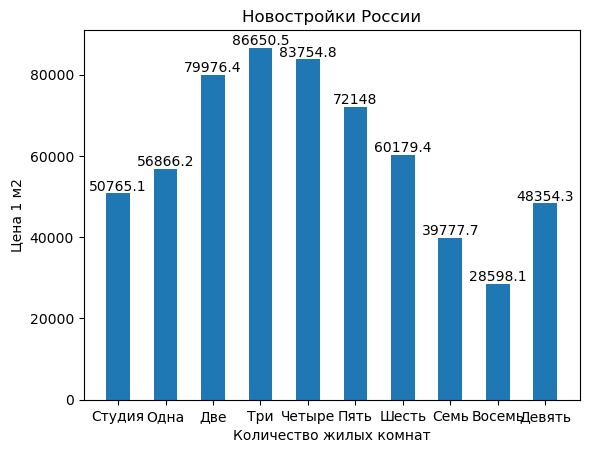

In [622]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_nov_mass['price_m2'], width)
ax.set_title('Новостройки России')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. В среднем по России самый дорогой квадратный метр жилплощади - в трёхкомнатных квартирах, чуть меньше - в четырёхкомнатных
<br>2. На диаграмме видна зависимомть: стоимость квадратного метра повышается от студий до трёхкомнатных квартир (51, 57, 80, 87 тыс рублей), затем снижается до восьмиконатного жилья (84, 72, 60, 40, 29 тыс. рублей), а на девятикомнатном жилье тенденция не соблюдается [при увеличении числа жилых комнат]
<br>3. В целом, 1 м2 любого жилья дешевле в России, чем 1 м2 любого жилья в рассмотренных отдельно регионах
</u></i></strong>

<h4>Сводная информация за 6 датасетов</h4>

<strong>По цене за 1 м2</strong>

<Figure size 1600x48000 with 0 Axes>

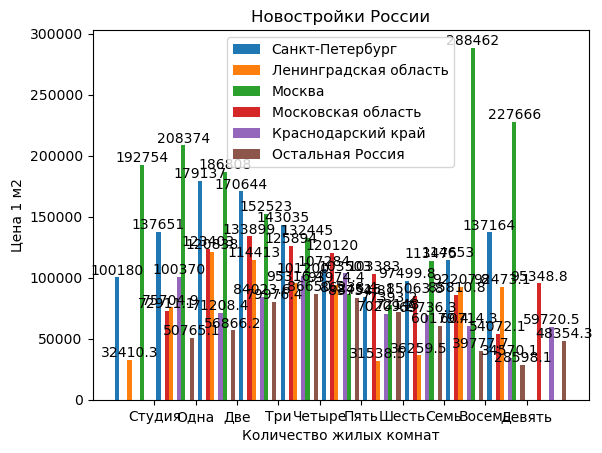

In [623]:
x = np.array(prices.index)
width = 0.1
plt.figure(figsize=(16, 480))
fig, ax = plt.subplots()
grf_spb = plt.bar(x - width * 9, prices['price_m2'], width, label='Санкт-Петербург')
grf_lo = plt.bar(x - width * 6, prices_nov_lo['price_m2'], width, label='Ленинградская область')
grf_msk = plt.bar(x - width * 3, prices_nov_msk['price_m2'], width, label='Москва')
grf_mo = plt.bar(x + width * 3, prices_nov_mo['price_m2'], width, label='Московская область')
grf_kk = plt.bar(x + width * 6, prices_nov_kk['price_m2'], width, label='Краснодарский край')
grf_mass = plt.bar(x + width * 9, prices_nov_mass['price_m2'], width, label='Остальная Россия')
ax.set_title('Новостройки России')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[2])
ax.bar_label(ax.containers[3])
ax.bar_label(ax.containers[4])
ax.bar_label(ax.containers[5])
ax.legend()

In [624]:
prices_nov = pd.DataFrame([prices['price_m2'], prices_nov_lo['price_m2'], prices_nov_msk['price_m2'], 
                          prices_nov_mo['price_m2'], prices_nov_kk['price_m2'], prices_nov_mass['price_m2']])
prices_nov.insert(0, 'Region', ['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
prices_nov.columns = ['Region', 'Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
prices_nov = prices_nov.reset_index(drop=True)
prices_nov

,Region,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
0,Санкт-Петербург,100179.63,137650.54,179137.40,170643.62,143034.75,107283.66,84515.06,97499.78,114652.86,137164.04
1,Ленинградская область,32410.34,75704.94,120838.25,114412.81,95316.44,93974.36,31538.46,36259.54,92207.79,92473.12
2,Москва,192753.57,208374.25,186808.36,152522.69,132444.53,86238.38,77393.22,113475.18,288461.54,227665.71
3,Московская область,72911.07,123403.10,133898.97,125894.03,120120.25,103383.02,85063.75,85810.81,54072.11,95348.84
4,Краснодарский край,100369.89,71208.42,84023.57,101200.22,103502.77,70209.25,69736.27,60714.29,34570.09,59720.46
5,Регионы,50765.09,56866.23,79976.40,86650.49,83754.78,72147.99,60179.44,39777.66,28598.13,48354.34


In [625]:
x

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

<Figure size 640x480 with 0 Axes>

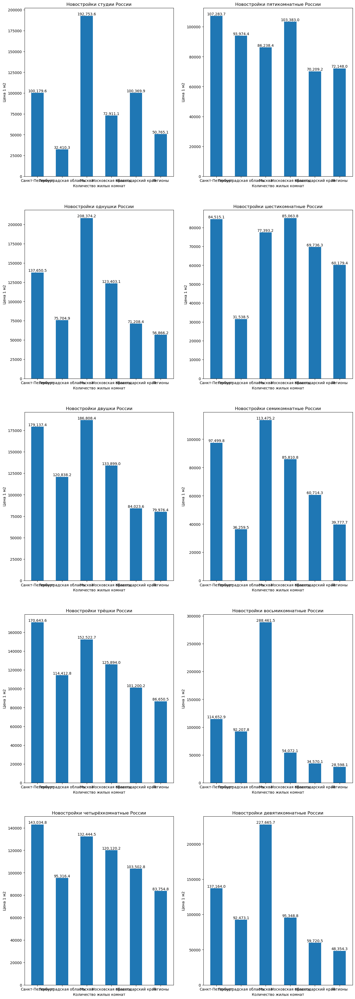

In [626]:
x = np.array(prices_nov.index)
width = 0.5
plt.figure()
fig, ax = plt.subplots(5, 2, figsize=(16, 48))

ax[0, 0].bar(x, prices_nov['Студия'], width)
ax[0, 0].set_title('Новостройки студии России')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 0].set_xlabel('Количество жилых комнат')
ax[0, 0].set_ylabel('Цена 1 м2')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')

ax[1, 0].bar(x, prices_nov['Одна'], width)
ax[1, 0].set_title('Новостройки однушки России')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 0].set_xlabel('Количество жилых комнат')
ax[1, 0].set_ylabel('Цена 1 м2')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')

ax[2, 0].bar(x, prices_nov['Две'], width)
ax[2, 0].set_title('Новостройки двушки России')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 0].set_xlabel('Количество жилых комнат')
ax[2, 0].set_ylabel('Цена 1 м2')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')

ax[3, 0].bar(x, prices_nov['Три'], width)
ax[3, 0].set_title('Новостройки трёшки России')
ax[3, 0].set_xticks(x)
ax[3, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 0].set_xlabel('Количество жилых комнат')
ax[3, 0].set_ylabel('Цена 1 м2')
ax[3, 0].bar_label(ax[3, 0].containers[0], fmt='{:,.1f}')

ax[4, 0].bar(x, prices_nov['Четыре'], width)
ax[4, 0].set_title('Новостройки четырёхкомнатные России')
ax[4, 0].set_xticks(x)
ax[4, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 0].set_xlabel('Количество жилых комнат')
ax[4, 0].set_ylabel('Цена 1 м2')
ax[4, 0].bar_label(ax[4, 0].containers[0], fmt='{:,.1f}')

ax[0, 1].bar(x, prices_nov['Пять'], width)
ax[0, 1].set_title('Новостройки пятикомнатные России')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 1].set_xlabel('Количество жилых комнат')
ax[0, 1].set_ylabel('Цена 1 м2')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')

ax[1, 1].bar(x, prices_nov['Шесть'], width)
ax[1, 1].set_title('Новостройки шестикомнатные России')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 1].set_xlabel('Количество жилых комнат')
ax[1, 1].set_ylabel('Цена 1 м2')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')

ax[2, 1].bar(x, prices_nov['Семь'], width)
ax[2, 1].set_title('Новостройки семикомнатные России')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 1].set_xlabel('Количество жилых комнат')
ax[2, 1].set_ylabel('Цена 1 м2')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')

ax[3, 1].bar(x, prices_nov['Восемь'], width)
ax[3, 1].set_title('Новостройки восьмикомнатные России')
ax[3, 1].set_xticks(x)
ax[3, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 1].set_xlabel('Количество жилых комнат')
ax[3, 1].set_ylabel('Цена 1 м2')
ax[3, 1].bar_label(ax[3, 1].containers[0], fmt='{:,.1f}')

ax[4, 1].bar(x, prices_nov['Девять'], width)
ax[4, 1].set_title('Новостройки девятикомнатные России')
ax[4, 1].set_xticks(x)
ax[4, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 1].set_xlabel('Количество жилых комнат')
ax[4, 1].set_ylabel('Цена 1 м2')
ax[4, 1].bar_label(ax[4, 1].containers[0], fmt='{:,.1f}')

plt.savefig('grf29.png')

<strong>Выводы</strong>

<table>
    <tr>
        <th>Количество комнат</th>
        <th>Самый дорогой 1 м2</th>
        <th>Самый дешёвый 1 м2</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Москва (192'754)</td>
        <td>Ленинградская область (32'410,3)</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Москва (208'374)</td>
        <td>Оставшиеся (56'866,2)</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Москва (186'808)</td>
        <td>Оставшиеся (79'976,4)</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Санкт-Петербург (170'644)</td>
        <td>Оставшиеся (86'650,5)</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Санкт-Петербург (143'035)</td>
        <td>Оставшиеся (83'754,8)</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Санкт-Петербург (107'284)</td>
        <td>Краснодарский край (70'209,2)</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Московская область (85'063,8)</td>
        <td>Ленинградская область (31'538,5)</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Москва (113'475)</td>
        <td>Ленинградская область (36'259,5)</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Москва (288'462)</td>
        <td>Оставшиеся (28'598,1)</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Москва (227'666)</td>
        <td>Оставшиеся (48'354,3)</td>
    </tr>
</table>

<p>Из массового жилья (студии, однушки, двушки) в Москве жильё наименее доступно, а наиболее доступно в оставшихся регионах (одна и две комнаты) и Ленинградской области (студии).
<p> В шести группах недвижимости из 10 по количеству комнат самый дорогой 1 м2 в Москве, что делает её самым недоступным регионом, а среди восьми- и девятикомнатного жилья - выбросом

<strong>По объёмам продаж</strong>

In [627]:
sellings_nov = pd.DataFrame([realty_spb.query('object_type == True').groupby(by='rooms').count()['price'],
                            realty_lo.query('object_type == True').groupby(by='rooms').count()['price'],
                            realty_msk.query('object_type == True').groupby(by='rooms').count()['price'],
                            realty_mo.query('object_type == True').groupby(by='rooms').count()['price'],
                            realty_kk.query('object_type == True').groupby(by='rooms').count()['price'],
                            realty_mass.query('object_type == True').groupby(by='rooms').count()['price']])
sellings_nov.insert(0, 'Regions', ['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
sellings_nov.columns = ['Region', 'Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
sellings_nov = sellings_nov.reset_index(drop=True)
sellings_nov

,Region,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
0,Санкт-Петербург,10879,90661,83432,56757,9233,1748,238,45,16,10
1,Ленинградская область,2956,16680,12312,6116,589,40,3,1,1,1
2,Москва,14167,68842,81875,50118,5168,502,44,15,5,6
3,Московская область,8548,139923,144264,74148,7414,656,47,7,2,10
4,Краснодарский край,19805,229831,176687,88288,9191,877,67,15,3,19
5,Регионы,84659,807547,815493,523651,86048,6629,239,43,25,49


<Figure size 640x480 with 0 Axes>

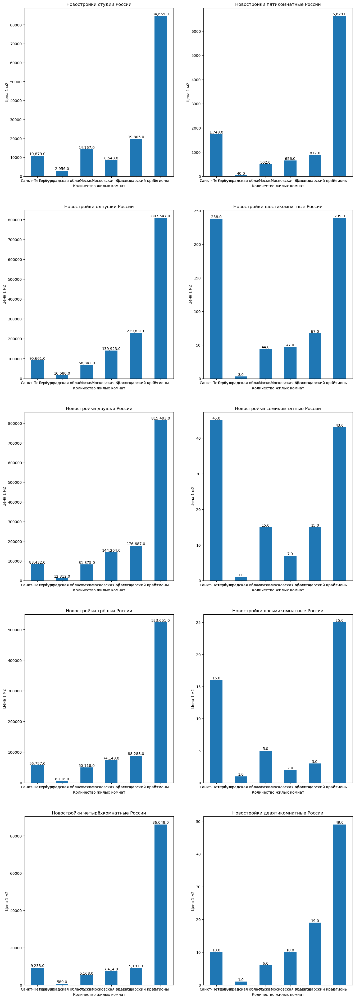

In [628]:
x = np.array(sellings_nov.index)
width = 0.5
plt.figure()
fig, ax = plt.subplots(5, 2, figsize=(16, 48))

ax[0, 0].bar(x, sellings_nov['Студия'], width)
ax[0, 0].set_title('Новостройки студии России')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 0].set_xlabel('Количество жилых комнат')
ax[0, 0].set_ylabel('Цена 1 м2')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')

ax[1, 0].bar(x, sellings_nov['Одна'], width)
ax[1, 0].set_title('Новостройки однушки России')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 0].set_xlabel('Количество жилых комнат')
ax[1, 0].set_ylabel('Цена 1 м2')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')

ax[2, 0].bar(x, sellings_nov['Две'], width)
ax[2, 0].set_title('Новостройки двушки России')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 0].set_xlabel('Количество жилых комнат')
ax[2, 0].set_ylabel('Цена 1 м2')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')

ax[3, 0].bar(x, sellings_nov['Три'], width)
ax[3, 0].set_title('Новостройки трёшки России')
ax[3, 0].set_xticks(x)
ax[3, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 0].set_xlabel('Количество жилых комнат')
ax[3, 0].set_ylabel('Цена 1 м2')
ax[3, 0].bar_label(ax[3, 0].containers[0], fmt='{:,.1f}')

ax[4, 0].bar(x, sellings_nov['Четыре'], width)
ax[4, 0].set_title('Новостройки четырёхкомнатные России')
ax[4, 0].set_xticks(x)
ax[4, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 0].set_xlabel('Количество жилых комнат')
ax[4, 0].set_ylabel('Цена 1 м2')
ax[4, 0].bar_label(ax[4, 0].containers[0], fmt='{:,.1f}')

ax[0, 1].bar(x, sellings_nov['Пять'], width)
ax[0, 1].set_title('Новостройки пятикомнатные России')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 1].set_xlabel('Количество жилых комнат')
ax[0, 1].set_ylabel('Цена 1 м2')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')

ax[1, 1].bar(x, sellings_nov['Шесть'], width)
ax[1, 1].set_title('Новостройки шестикомнатные России')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 1].set_xlabel('Количество жилых комнат')
ax[1, 1].set_ylabel('Цена 1 м2')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')

ax[2, 1].bar(x, sellings_nov['Семь'], width)
ax[2, 1].set_title('Новостройки семикомнатные России')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 1].set_xlabel('Количество жилых комнат')
ax[2, 1].set_ylabel('Цена 1 м2')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')

ax[3, 1].bar(x, sellings_nov['Восемь'], width)
ax[3, 1].set_title('Новостройки восьмикомнатные России')
ax[3, 1].set_xticks(x)
ax[3, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 1].set_xlabel('Количество жилых комнат')
ax[3, 1].set_ylabel('Цена 1 м2')
ax[3, 1].bar_label(ax[3, 1].containers[0], fmt='{:,.1f}')

ax[4, 1].bar(x, sellings_nov['Девять'], width)
ax[4, 1].set_title('Новостройки девятикомнатные России')
ax[4, 1].set_xticks(x)
ax[4, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 1].set_xlabel('Количество жилых комнат')
ax[4, 1].set_ylabel('Цена 1 м2')
ax[4, 1].bar_label(ax[4, 1].containers[0], fmt='{:,.1f}')

plt.savefig('grf30.png')

<strong>Выводы</strong>

<table>
    <tr>
        <th>Количество комнат</th>
        <th>Лидер по объёмам продажи</th>
        <th>Последний по объёмам продажи</th>
        <th>В оставшихся регионах</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Краснодарский край (19805)</td>
        <td>Ленинградская область (2956)</td>
        <td>84659</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Краснодарский край (229831)</td>
        <td>Ленинградская область (16680)</td>
        <td>807547</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Краснодарский край (176687)</td>
        <td>Ленинградская область (12312)</td>
        <td>815493</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Краснодарский край (88288)</td>
        <td>Ленинградская область (6116)</td>
        <td>523651</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Санкт-Петребург (9233)</td>
        <td>Ленинградская область (589)</td>
        <td>86048</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Санкт-Петербург (1748)</td>
        <td>Ленинградская область (40)</td>
        <td>6629</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Санкт-Петербург (238)</td>
        <td>Ленинградская область (3)</td>
        <td>239</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Санкт-Петербург(45)</td>
        <td>Ленинградская область (1)</td>
        <td>43</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Санкт-Петербург (16)</td>
        <td>Ленинградская область (1)</td>
        <td>25</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Краснодарский край (19)</td>
        <td>Ленинградская область (1)</td>
        <td>49</td>
    </tr>
</table>

<p>В Ленинградской области недвижимость всех видов продавалась наименьшими темпами
<p>Из массового жилья квартир в новостройках в Краснодарском крае продано больше всего
<p>В Санкт-Петербурге большими темпами продаётся крупное жильё, вероятно, в Сестрорецком районе
<p>Москва не является лидером по продажам квартир в новостройках для жилья с любым количеством комнат

<h3>Рассмотрение вторичного рынка</h3>

<h4>Санкт-Петербург</h4>

In [629]:
realty_spb.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,11752,11752,11752,11752,11752,11752,11752,11752,11752
1,82998,82998,82998,82998,82998,82998,82998,82998,82998
2,63760,63760,63760,63760,63760,63760,63760,63760,63760
3,29727,29727,29727,29727,29727,29727,29727,29727,29727
4,2620,2620,2620,2620,2620,2620,2620,2620,2620
5,141,141,141,141,141,141,141,141,141
6,3,3,3,3,3,3,3,3,3
7,5,5,5,5,5,5,5,5,5
8,1,1,1,1,1,1,1,1,1


In [630]:
prices_vt_spb = []

<strong>Студии</strong>

In [631]:
x_st = np.array(realty_spb.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_spb.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = -350692.68 + 144893.82 * x
Коэффициент корреляции: 0.6067


<strong>Однушки</strong>

In [632]:
x_1 = np.array(realty_spb.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_spb.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = -2497113.16 + 196971.38 * x
Коэффициент корреляции: 0.6179


<strong>Двушки</strong>

In [633]:
x_2 = np.array(realty_spb.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_spb.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = -3655505.79 + 192000.84 * x
Коэффициент корреляции: 0.6259


<strong>Трёшки</strong>

In [634]:
x_3 = np.array(realty_spb.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_spb.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = -3039597.82 + 166970.08 * x
Коэффициент корреляции: 0.6508


<strong>Четыре комнаты</strong>

In [635]:
x_4 = np.array(realty_spb.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_spb.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = 1306464.58 + 129813.3 * x
Коэффициент корреляции: 0.5756


<strong>Пять комнат</strong>

In [636]:
x_5 = np.array(realty_spb.query('rooms == 5 and object_type == False').area).reshape(-1, 1)
y_5 = np.array(realty_spb.query('rooms == 5 and object_type == False').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_vt_spb.append(round(model.coef_.item(), 2))

Модель регресии: y = -2221579.67 + 158932.38 * x
Коэффициент корреляции: 0.693


<strong>Шесть комнат</strong>

In [637]:
price = realty_spb.query('rooms == 6 and object_type == False').price.median() / realty_spb.query('rooms == 6 and object_type == False').area.median()
price

108769.23076923077

In [638]:
prices_vt_spb.append(round(price, 2))

<strong>Семь комнат</strong>

In [639]:
price = realty_spb.query('rooms == 7 and object_type == False').price.median() / realty_spb.query('rooms == 7 and object_type == False').area.median()
prices_vt_spb.append(round(price, 2))
price

93846.15384615384

<strong>Восемь комнат</strong>

In [640]:
price = realty_spb.query('rooms == 8 and object_type == False').price.median() / realty_spb.query('rooms == 8 and object_type == False').area.median()
prices_vt_spb.append(round(price, 2))
price

112214.28571428571

<strong>Девять комнат</strong>

In [641]:
price = realty_spb.query('rooms == 9 and object_type == False').price.median() / realty_spb.query('rooms == 9 and object_type == False').area.median()
prices_vt_spb.append(round(price, 2))
price

123963.133640553

<strong><i>
Подведение итогов
</i></strong>

In [642]:
prices_vt_spb = pd.DataFrame(pd.Series(prices_vt_spb))
prices_vt_spb.columns = ['price_m2']
prices_vt_spb

,price_m2
0,144893.82
1,196971.38
2,192000.84
3,166970.08
4,129813.30
5,158932.38
6,108769.23
7,93846.15
8,112214.29
9,123963.13


[Text(0, 0, '144894'),
 Text(0, 0, '196971'),
 Text(0, 0, '192001'),
 Text(0, 0, '166970'),
 Text(0, 0, '129813'),
 Text(0, 0, '158932'),
 Text(0, 0, '108769'),
 Text(0, 0, '93846.1'),
 Text(0, 0, '112214'),
 Text(0, 0, '123963')]

<Figure size 900x1700 with 0 Axes>

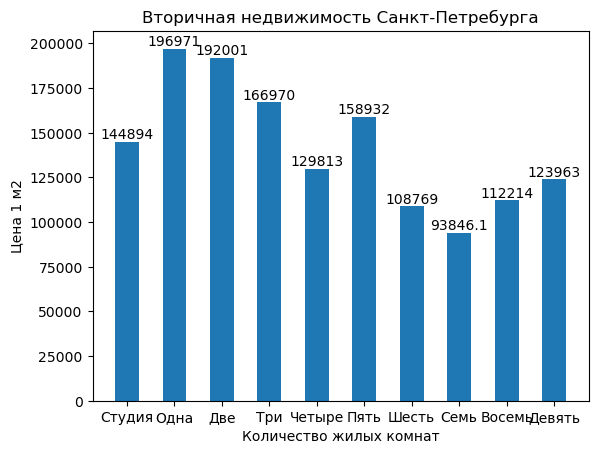

In [643]:
x = np.array(prices_vt_spb.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_spb['price_m2'], width)
ax.set_title('Вторичная недвижимость Санкт-Петребурга')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Вывод: самая маленькая цена за 1 м2 у семикомнатного жилья, самая большая - у однушек и двушек, потому что они пользуются повышенным спросом
</u></i></strong>

<h4>Ленинградская область</h4>

In [644]:
realty_lo.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,1122,1122,1122,1122,1122,1122,1122,1122,1122
1,6027,6027,6027,6027,6027,6027,6027,6027,6027
2,4399,4399,4399,4399,4399,4399,4399,4399,4399
3,1601,1601,1601,1601,1601,1601,1601,1601,1601
4,83,83,83,83,83,83,83,83,83
5,5,5,5,5,5,5,5,5,5
6,1,1,1,1,1,1,1,1,1
7,1,1,1,1,1,1,1,1,1
9,1,1,1,1,1,1,1,1,1


In [645]:
prices_vt_lo = []

<strong>Студии</strong>

In [646]:
x_st = np.array(realty_lo.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_lo.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 615473.39 + 65494.63 * x
Коэффициент корреляции: 0.4467


<strong>Однушки</strong>

In [647]:
x_1 = np.array(realty_lo.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_lo.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 888563.49 + 68471.49 * x
Коэффициент корреляции: 0.4162


<strong>Двушки</strong>

In [648]:
x_2 = np.array(realty_lo.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_lo.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 930060.51 + 71152.63 * x
Коэффициент корреляции: 0.4724


<strong>Трёшки</strong>

In [649]:
x_3 = np.array(realty_lo.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_lo.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 372307.97 + 78427.48 * x
Коэффициент корреляции: 0.5289


<strong>Четыре комнаты</strong>

In [650]:
x_4 = np.array(realty_lo.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_lo.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_lo.append(round(model.coef_.item(), 2))

Модель регресии: y = 14907.54 + 87961.22 * x
Коэффициент корреляции: 0.553


<strong>Пять комнат</strong>

In [651]:
price = realty_lo.query('rooms == 5 and object_type == False').price.median() / realty_lo.query('rooms == 5 and object_type == False').area.median()
prices_vt_lo.append(round(price, 2))
price

89699.75961538461

<strong>Шесть комнат</strong>

In [652]:
price = realty_lo.query('rooms == 6 and object_type == False').price.median() / realty_lo.query('rooms == 6 and object_type == False').area.median()
prices_vt_lo.append(round(price, 2))
price

45000.0

<strong>Семь комнат</strong>

In [653]:
price = realty_lo.query('rooms == 7 and object_type == False').price.median() / realty_lo.query('rooms == 7 and object_type == False').area.median()
prices_vt_lo.append(round(price, 2))
price

45579.778270509974

<strong>Восемь комнат</strong>

In [654]:
price = realty_lo.query('rooms == 8 and object_type == False').price.median() / realty_lo.query('rooms == 8 and object_type == False').area.median()
prices_vt_lo.append(0)

<strong>Девять комнат</strong>

In [655]:
price = realty_lo.query('rooms == 9 and object_type == False').price.median() / realty_lo.query('rooms == 9 and object_type == False').area.median()
prices_vt_lo.append(round(price, 2))
price

125000.0

<strong><i>
Подведение итогов
</i></strong>

In [656]:
prices_vt_lo = pd.DataFrame(pd.Series(prices_vt_lo))
prices_vt_lo.columns = ['price_m2']
prices_vt_lo

,price_m2
0,65494.63
1,68471.49
2,71152.63
3,78427.48
4,87961.22
5,89699.76
6,45000.00
7,45579.78
8,0.00
9,125000.00


[Text(0, 0, '65494.6'),
 Text(0, 0, '68471.5'),
 Text(0, 0, '71152.6'),
 Text(0, 0, '78427.5'),
 Text(0, 0, '87961.2'),
 Text(0, 0, '89699.8'),
 Text(0, 0, '45000'),
 Text(0, 0, '45579.8'),
 Text(0, 0, '0'),
 Text(0, 0, '125000')]

<Figure size 900x1700 with 0 Axes>

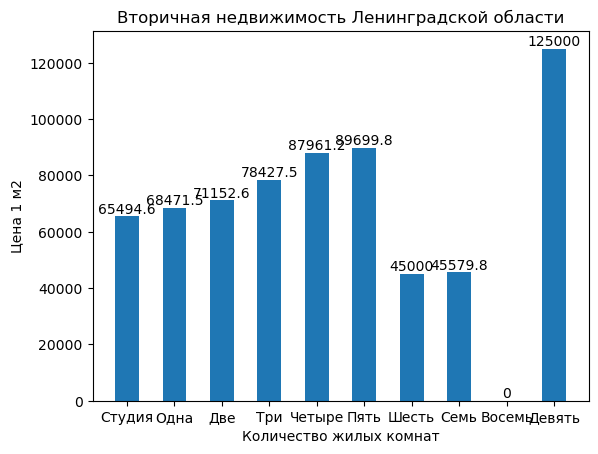

In [657]:
x = np.array(prices_vt_lo.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_lo['price_m2'], width)
ax.set_title('Вторичная недвижимость Ленинградской области')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы: <p>1. Наблюдается тенденция к росту цены одного квадратного метра при увеличении числа комнат (от студий до пятикомнатных)
<p>2. Восьмикомнатного вторичного жилья в Ленинградской области продано не было                                                                      
</u></i></strong>

<h4>Москва</h4>

In [658]:
realty_msk.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,8044,8044,8044,8044,8044,8044,8044,8044,8044
1,66090,66090,66090,66090,66090,66090,66090,66090,66090
2,68648,68648,68648,68648,68648,68648,68648,68648,68648
3,32571,32571,32571,32571,32571,32571,32571,32571,32571
4,2580,2580,2580,2580,2580,2580,2580,2580,2580
5,118,118,118,118,118,118,118,118,118
6,4,4,4,4,4,4,4,4,4


In [659]:
prices_vt_msk = []

<strong>Студии</strong>

In [660]:
x_st = np.array(realty_msk.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_msk.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 2087516.06 + 150121.12 * x
Коэффициент корреляции: 0.6792


<strong>Однушки</strong>

In [661]:
x_1 = np.array(realty_msk.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_msk.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = -1388448.92 + 231496.24 * x
Коэффициент корреляции: 0.5978


<strong>Двушки</strong>

In [662]:
x_2 = np.array(realty_msk.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_msk.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = -1697635.33 + 207270.32 * x
Коэффициент корреляции: 0.4771


<strong>Трёшки</strong>

In [663]:
x_3 = np.array(realty_msk.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_msk.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = -175749.44 + 168765.01 * x
Коэффициент корреляции: 0.4316


<strong>Четыре комнаты</strong>

In [664]:
x_4 = np.array(realty_msk.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_msk.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 1539742.24 + 150231.19 * x
Коэффициент корреляции: 0.4001


<strong>Пять комнат</strong>

In [665]:
x_5 = np.array(realty_msk.query('rooms == 5 and object_type == False').area).reshape(-1, 1)
y_5 = np.array(realty_msk.query('rooms == 5 and object_type == False').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_vt_msk.append(round(model.coef_.item(), 2))

Модель регресии: y = 6071642.83 + 79977.05 * x
Коэффициент корреляции: 0.3703


<strong>Шесть комнат</strong>

In [666]:
price = realty_msk.query('rooms == 9 and object_type == True').price.median() / realty_msk.query('rooms == 9 and object_type == True').area.median()
prices_vt_msk.append(round(price, 2))
price

227665.7060518732

<strong>Семь комнат</strong>

In [667]:
prices_vt_msk.append(0)

<strong>Восемь комнат</strong>

In [668]:
prices_vt_msk.append(0)

<strong>Девять комнат</strong>

In [669]:
prices_vt_msk.append(0)

<strong><i>
Подведение итогов
</i></strong>

In [670]:
prices_vt_msk = pd.DataFrame(pd.Series(prices_vt_msk))
prices_vt_msk.columns = ['price_m2']
prices_vt_msk

,price_m2
0,150121.12
1,231496.24
2,207270.32
3,168765.01
4,150231.19
5,79977.05
6,227665.71
7,0.00
8,0.00
9,0.00


[Text(0, 0, '150121'),
 Text(0, 0, '231496'),
 Text(0, 0, '207270'),
 Text(0, 0, '168765'),
 Text(0, 0, '150231'),
 Text(0, 0, '79977.1'),
 Text(0, 0, '227666'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '0')]

<Figure size 900x1700 with 0 Axes>

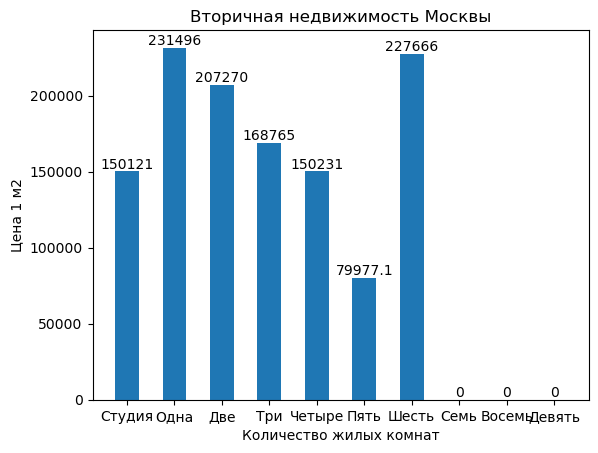

In [671]:
x = np.array(prices_vt_msk.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_msk['price_m2'], width)
ax.set_title('Вторичная недвижимость Москвы')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. Самый дорогой квадратный метр жилья - в однушках
<br>2. Для 1-5 комнатных квартир наблюдается тенденция к уменьшению стоимости квадратного метра жилья при увеличении количества комнат
<br>3. Цена за м2 в студии сильно отличается от цены м2 в однушке, но примерно равна цене м2 в четырёхкоматной квартире
<br>4. Жильё 7, 8 и 9 комнат не продавалось
</u></i></strong>

<h4>Московская область</h4>

In [672]:
realty_mo.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,6959,6959,6959,6959,6959,6959,6959,6959,6959
1,51079,51079,51079,51079,51079,51079,51079,51079,51079
2,44209,44209,44209,44209,44209,44209,44209,44209,44209
3,18498,18498,18498,18498,18498,18498,18498,18498,18498
4,947,947,947,947,947,947,947,947,947
5,47,47,47,47,47,47,47,47,47
6,7,7,7,7,7,7,7,7,7
7,2,2,2,2,2,2,2,2,2
9,1,1,1,1,1,1,1,1,1


In [673]:
prices_vt_mo = []

<strong>Студии</strong>

In [674]:
x_st = np.array(realty_mo.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_mo.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 2875340.46 + 19542.02 * x
Коэффициент корреляции: 0.1394


<strong>Однушки</strong>

In [675]:
x_1 = np.array(realty_mo.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_mo.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 1999075.33 + 57756.68 * x
Коэффициент корреляции: 0.2857


<strong>Двушки</strong>

In [676]:
x_2 = np.array(realty_mo.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_mo.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 2950672.22 + 50058.13 * x
Коэффициент корреляции: 0.2479


<strong>Трёшки</strong>

In [677]:
x_3 = np.array(realty_mo.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_mo.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 3614317.45 + 47249.59 * x
Коэффициент корреляции: 0.2667


<strong>Четыре комнаты</strong>

In [678]:
x_4 = np.array(realty_mo.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_mo.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 4460917.95 + 53743.96 * x
Коэффициент корреляции: 0.3153


<strong>Пять комнат</strong>

In [679]:
x_5 = np.array(realty_mo.query('rooms == 5 and object_type == False').area).reshape(-1, 1)
y_5 = np.array(realty_mo.query('rooms == 5 and object_type == False').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_vt_mo.append(round(model.coef_.item(), 2))

Модель регресии: y = 6217903.51 + 40790.52 * x
Коэффициент корреляции: 0.1787


<strong>Шесть комнат</strong>

In [680]:
price = realty_mo.query('rooms == 6 and object_type == False').price.median() / realty_mo.query('rooms == 6 and object_type == False').area.median()
prices_vt_mo.append(round(price, 2))
price

53731.34328358209

<strong>Семь комнат</strong>

In [681]:
price = realty_mo.query('rooms == 7 and object_type == False').price.median() / realty_mo.query('rooms == 7 and object_type == False').area.median()
prices_vt_mo.append(round(price, 2))
price

90700.32017075774

<strong>Восемь комнат</strong>

In [682]:
prices_vt_mo.append(0)

<strong>Девять комнат</strong>

In [683]:
price = realty_mo.query('rooms == 9 and object_type == False').price.median() / realty_mo.query('rooms == 9 and object_type == False').area.median()
prices_vt_mo.append(round(price, 2))
price

64019.4489465154

<strong><i>
Подведение итогов
</i></strong>

In [684]:
prices_vt_mo = pd.DataFrame(pd.Series(prices_vt_mo).apply(lambda x: round(x, 2)))
prices_vt_mo.columns = ['price_m2']
prices_vt_mo

,price_m2
0,19542.02
1,57756.68
2,50058.13
3,47249.59
4,53743.96
5,40790.52
6,53731.34
7,90700.32
8,0.00
9,64019.45


[Text(0, 0, '19542'),
 Text(0, 0, '57756.7'),
 Text(0, 0, '50058.1'),
 Text(0, 0, '47249.6'),
 Text(0, 0, '53744'),
 Text(0, 0, '40790.5'),
 Text(0, 0, '53731.3'),
 Text(0, 0, '90700.3'),
 Text(0, 0, '0'),
 Text(0, 0, '64019.4')]

<Figure size 900x1700 with 0 Axes>

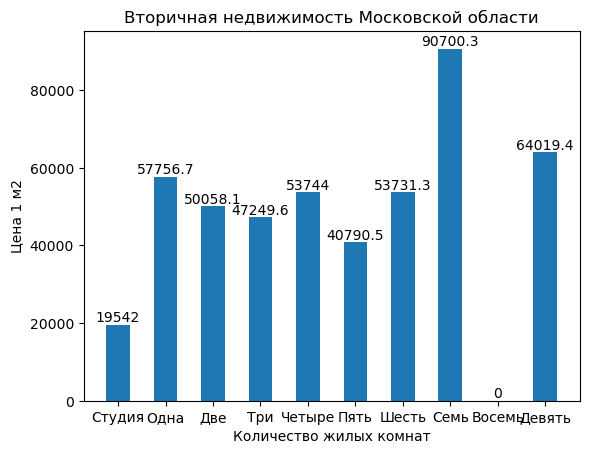

In [685]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_mo['price_m2'], width)
ax.set_title('Вторичная недвижимость Московской области')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. Цена 1 м2 в одно- двух- трёх- четырёх- шестикомнатных квартирах примерно равны
<br>2. Цена 1 м2 в студия рекордно низкая, а в семикомнатных квартирах - высокая
<br>3. Восьмикомнатных квартир в продаже нет
</u></i></strong>

<h4>Краснодарский край</h4>

In [686]:
realty_kk.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,7216,7216,7216,7216,7216,7216,7216,7216,7216
1,50428,50428,50428,50428,50428,50428,50428,50428,50428
2,32196,32196,32196,32196,32196,32196,32196,32196,32196
3,9927,9927,9927,9927,9927,9927,9927,9927,9927
4,609,609,609,609,609,609,609,609,609
5,110,110,110,110,110,110,110,110,110
6,7,7,7,7,7,7,7,7,7
7,6,6,6,6,6,6,6,6,6
8,1,1,1,1,1,1,1,1,1


In [687]:
prices_vt_kk = []

<strong>Студии</strong>

In [688]:
x_st = np.array(realty_kk.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_kk.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -556857.8 + 95487.11 * x
Коэффициент корреляции: 0.5968


<strong>Однушки</strong>

In [689]:
x_1 = np.array(realty_kk.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_kk.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = 169377.48 + 57602.58 * x
Коэффициент корреляции: 0.3012


<strong>Двушки</strong>

In [690]:
x_2 = np.array(realty_kk.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_kk.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -191467.09 + 62382.06 * x
Коэффициент корреляции: 0.3515


<strong>Трёшки</strong>

In [691]:
x_3 = np.array(realty_kk.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_kk.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = -2549116.69 + 90409.66 * x
Коэффициент корреляции: 0.5237


<strong>Четыре комнаты</strong>

In [692]:
x_4 = np.array(realty_kk.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_kk.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = 574472.85 + 58666.06 * x
Коэффициент корреляции: 0.325


<strong>Пять комнат</strong>

In [693]:
x_5 = np.array(realty_kk.query('rooms == 5 and object_type == False').area).reshape(-1, 1)
y_5 = np.array(realty_kk.query('rooms == 5 and object_type == False').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_vt_kk.append(round(model.coef_.item(), 2))

Модель регресии: y = 1054112.79 + 48598.02 * x
Коэффициент корреляции: 0.311


<strong>Шесть комнат</strong>

In [694]:
price = realty_kk.query('rooms == 6 and object_type == False').price.median() / realty_kk.query('rooms == 6 and object_type == False').area.median()
prices_vt_kk.append(round(price, 2))
price

47692.307692307695

<strong>Семь комнат</strong>

In [695]:
price = realty_kk.query('rooms == 7 and object_type == False').price.median() / realty_kk.query('rooms == 7 and object_type == False').area.median()
prices_vt_kk.append(round(price, 2))
price

54433.71378402107

<strong>Восемь комнат</strong>

In [696]:
price = realty_kk.query('rooms == 8 and object_type == False').price.median() / realty_kk.query('rooms == 8 and object_type == False').area.median()
prices_vt_kk.append(round(price, 2))
price

61921.51898734177

<strong>Девять комнат</strong>

In [697]:
price = realty_kk.query('rooms == 9 and object_type == False').price.median() / realty_kk.query('rooms == 9 and object_type == False').area.median()
prices_vt_kk.append(round(price, 2))
price

46976.96078431373

<strong><i>
Подведение итогов
</i></strong>

In [698]:
prices_vt_kk = pd.DataFrame(pd.Series(prices_vt_kk))
prices_vt_kk.columns = ['price_m2']
prices_vt_kk

,price_m2
0,95487.11
1,57602.58
2,62382.06
3,90409.66
4,58666.06
5,48598.02
6,47692.31
7,54433.71
8,61921.52
9,46976.96


[Text(0, 0, '95487.1'),
 Text(0, 0, '57602.6'),
 Text(0, 0, '62382.1'),
 Text(0, 0, '90409.7'),
 Text(0, 0, '58666.1'),
 Text(0, 0, '48598'),
 Text(0, 0, '47692.3'),
 Text(0, 0, '54433.7'),
 Text(0, 0, '61921.5'),
 Text(0, 0, '46977')]

<Figure size 900x1700 with 0 Axes>

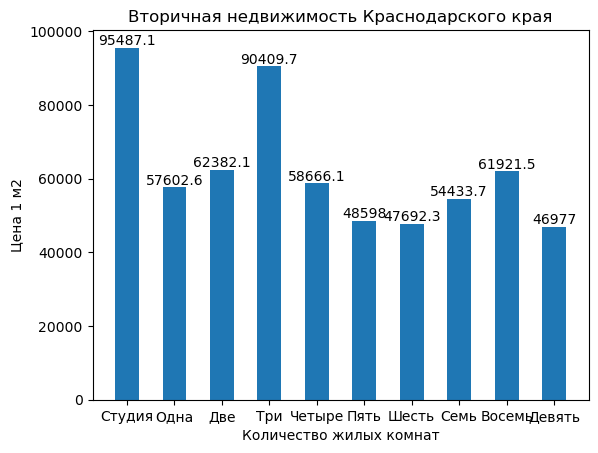

In [699]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_kk['price_m2'], width)
ax.set_title('Вторичная недвижимость Краснодарского края')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. Самый дорогой квадратный метр во вторичной недвижимости Краснодарского края - в студиях и трёхкомнатных квартирах
<br>2. В одно- двух- и четырёхкомнатных квартирах на вторичном рынке квадратный метр жилплощади стоит примерно 60'000 тысяч рублей
</u></i></strong>

<h4>Оставшиеся регионы</h4>

In [700]:
realty_mass.query('object_type == False').groupby(by='rooms').count()

,price,date,region,building_type,level,levels,area,kitchen_area,object_type
rooms,,,,,,,,,
-1,117957,117957,117957,117957,117957,117957,117957,117957,117957
1,417124,417124,417124,417124,417124,417124,417124,417124,417124
2,270056,270056,270056,270056,270056,270056,270056,270056,270056
3,172096,172096,172096,172096,172096,172096,172096,172096,172096
4,7616,7616,7616,7616,7616,7616,7616,7616,7616
5,528,528,528,528,528,528,528,528,528
6,27,27,27,27,27,27,27,27,27
7,16,16,16,16,16,16,16,16,16
8,5,5,5,5,5,5,5,5,5


In [701]:
prices_vt_mass = []

<strong>Студии</strong>

In [702]:
x_st = np.array(realty_mass.query('rooms == -1 and object_type == False').area).reshape(-1, 1)
y_st = np.array(realty_mass.query('rooms == -1 and object_type == False').price)
model = LinearRegression().fit(x_st, y_st)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_st, y_st))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 436103.76 + 33987.15 * x
Коэффициент корреляции: 0.4773


<strong>Однушки</strong>

In [703]:
x_1 = np.array(realty_mass.query('rooms == 1 and object_type == False').area).reshape(-1, 1)
y_1 = np.array(realty_mass.query('rooms == 1 and object_type == False').price)
model = LinearRegression().fit(x_1, y_1)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_1, y_1))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 901386.28 + 27836.94 * x
Коэффициент корреляции: 0.2234


<strong>Двушки</strong>

In [704]:
x_2 = np.array(realty_mass.query('rooms == 2 and object_type == False').area).reshape(-1, 1)
y_2 = np.array(realty_mass.query('rooms == 2 and object_type == False').price)
model = LinearRegression().fit(x_2, y_2)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_2, y_2))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -223671.32 + 57009.23 * x
Коэффициент корреляции: 0.3824


<strong>Трёшки</strong>

In [705]:
x_3 = np.array(realty_mass.query('rooms == 3 and object_type == False').area).reshape(-1, 1)
y_3 = np.array(realty_mass.query('rooms == 3 and object_type == False').price)
model = LinearRegression().fit(x_3, y_3)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_3, y_3))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -1435057.72 + 64377.9 * x
Коэффициент корреляции: 0.4495


<strong>Четыре комнаты</strong>

In [706]:
x_4 = np.array(realty_mass.query('rooms == 4 and object_type == False').area).reshape(-1, 1)
y_4 = np.array(realty_mass.query('rooms == 4 and object_type == False').price)
model = LinearRegression().fit(x_4, y_4)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_4, y_4))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = -1772099.0 + 81939.52 * x
Коэффициент корреляции: 0.5886


<strong>Пять комнат</strong>

In [707]:
x_5 = np.array(realty_mass.query('rooms == 5 and object_type == False').area).reshape(-1, 1)
y_5 = np.array(realty_mass.query('rooms == 5 and object_type == False').price)
model = LinearRegression().fit(x_5, y_5)
print(f'Модель регресии: y = {round(model.intercept_, 2)} + {round(model.coef_.item(), 2)} * x')
print(f'Коэффициент корреляции: {round((model.score(x_5, y_5))**0.5, 4)}')
prices_vt_mass.append(round(model.coef_.item(), 2))

Модель регресии: y = 772086.36 + 55151.61 * x
Коэффициент корреляции: 0.5298


<strong>Шесть комнат</strong>

In [708]:
price = realty_mass.query('rooms == 6 and object_type == False').price.median() / realty_kk.query('rooms == 6 and object_type == False').area.median()
prices_vt_mass.append(round(price, 2))
price

43338.46153846154

<strong>Семь комнат</strong>

In [709]:
price = realty_mass.query('rooms == 7 and object_type == False').price.median() / realty_kk.query('rooms == 7 and object_type == False').area.median()
prices_vt_mass.append(round(price, 2))
price

47006.14574187884

<strong>Восемь комнат</strong>

In [710]:
price = realty_mass.query('rooms == 8 and object_type == False').price.median() / realty_kk.query('rooms == 8 and object_type == False').area.median()
prices_vt_mass.append(round(price, 2))
price

43843.037974683546

<strong>Девять комнат</strong>

In [711]:
price = realty_mass.query('rooms == 9 and object_type == False').price.median() / realty_kk.query('rooms == 9 and object_type == False').area.median()
prices_vt_mass.append(round(price, 2))
price

74351.77696078432

<strong><i>
Подведение итогов
</i></strong>

In [712]:
prices_vt_mass = pd.DataFrame(pd.Series(prices_vt_mass))
prices_vt_mass.columns = ['price_m2']
prices_vt_mass

,price_m2
0,33987.15
1,27836.94
2,57009.23
3,64377.90
4,81939.52
5,55151.61
6,43338.46
7,47006.15
8,43843.04
9,74351.78


[Text(0, 0, '33987.2'),
 Text(0, 0, '27836.9'),
 Text(0, 0, '57009.2'),
 Text(0, 0, '64377.9'),
 Text(0, 0, '81939.5'),
 Text(0, 0, '55151.6'),
 Text(0, 0, '43338.5'),
 Text(0, 0, '47006.2'),
 Text(0, 0, '43843'),
 Text(0, 0, '74351.8')]

<Figure size 900x1700 with 0 Axes>

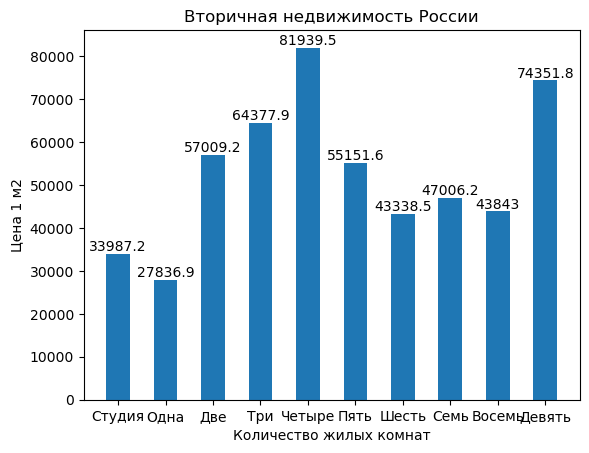

In [713]:
x = np.array(prices.index)
width = 0.5
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots()
grf = plt.bar(x, prices_vt_mass['price_m2'], width)
ax.set_title('Вторичная недвижимость России')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])

<strong><i><u>
Выводы:
<br>1. В среднем по России самый дорогой квадратный метр жилплощади - в четырёхкомнатных квартирах
<br>2. Тенденций роста или снижения цены 1 м2 при увеличении числа комнат выявить нельзя
<br>3. Маленькие коэффициенты корреляции - возможно, внутри группы оставшихся регионов необходимо дополнительно выделить подгруппы регионов (по квантилям 33,3%)
</u></i></strong>

<h4>Сводная информация за 6 датасетов</h4>

<strong>По цене за 1 м2</strong>

In [714]:
x = np.array(prices_vt_spb.index)
width = 0.1
plt.figure(figsize=(480, 32))
fig, ax = plt.subplots(figsize=(480, 32))
grf_spb = plt.bar(x - width * 9, prices_vt_spb['price_m2'], width, label='Санкт-Петербург')
grf_lo = plt.bar(x - width * 6, prices_vt_lo['price_m2'], width, label='Ленинградская область')
grf_msk = plt.bar(x - width * 3, prices_vt_msk['price_m2'], width, label='Москва')
grf_mo = plt.bar(x + width * 3, prices_vt_mo['price_m2'], width, label='Московская область')
grf_kk = plt.bar(x + width * 6, prices_vt_kk['price_m2'], width, label='Краснодарский край')
grf_mass = plt.bar(x + width * 9, prices_vt_mass['price_m2'], width, label='Остальная Россия')
ax.set_title('Вторичная недвижимость России')
ax.set_xticks(x)
ax.set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax.set_xlabel('Количество жилых комнат')
ax.set_ylabel('Цена 1 м2')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[2])
ax.bar_label(ax.containers[3])
ax.bar_label(ax.containers[4])
ax.bar_label(ax.containers[5])
ax.legend()
plt.savefig('grf.png')

<Figure size 48000x3200 with 0 Axes>

In [715]:
prices_vt = pd.DataFrame([prices_vt_spb['price_m2'], prices_vt_lo['price_m2'], prices_vt_msk['price_m2'], 
                          prices_vt_mo['price_m2'], prices_vt_kk['price_m2'], prices_vt_mass['price_m2']])
prices_vt.insert(0, 'Region', ['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
prices_vt.columns = ['Region', 'Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
prices_vt = prices_vt.reset_index(drop=True)
prices_vt

,Region,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
0,Санкт-Петербург,144893.82,196971.38,192000.84,166970.08,129813.30,158932.38,108769.23,93846.15,112214.29,123963.13
1,Ленинградская область,65494.63,68471.49,71152.63,78427.48,87961.22,89699.76,45000.00,45579.78,0.00,125000.00
2,Москва,150121.12,231496.24,207270.32,168765.01,150231.19,79977.05,227665.71,0.00,0.00,0.00
3,Московская область,19542.02,57756.68,50058.13,47249.59,53743.96,40790.52,53731.34,90700.32,0.00,64019.45
4,Краснодарский край,95487.11,57602.58,62382.06,90409.66,58666.06,48598.02,47692.31,54433.71,61921.52,46976.96
5,Регионы,33987.15,27836.94,57009.23,64377.90,81939.52,55151.61,43338.46,47006.15,43843.04,74351.78


<Figure size 640x480 with 0 Axes>

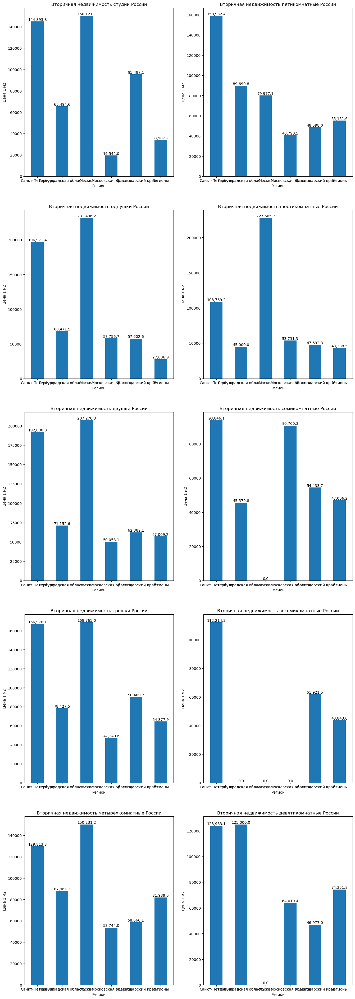

In [716]:
x = np.array(prices_vt.index)
width = 0.5
plt.figure()
fig, ax = plt.subplots(5, 2, figsize=(16, 48))

ax[0, 0].bar(x, prices_vt['Студия'], width)
ax[0, 0].set_title('Вторичная недвижимость студии России')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 0].set_xlabel('Регион')
ax[0, 0].set_ylabel('Цена 1 м2')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')

ax[1, 0].bar(x, prices_vt['Одна'], width)
ax[1, 0].set_title('Вторичная недвижимость однушки России')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 0].set_xlabel('Регион')
ax[1, 0].set_ylabel('Цена 1 м2')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')

ax[2, 0].bar(x, prices_vt['Две'], width)
ax[2, 0].set_title('Вторичная недвижимость двушки России')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 0].set_xlabel('Регион')
ax[2, 0].set_ylabel('Цена 1 м2')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')

ax[3, 0].bar(x, prices_vt['Три'], width)
ax[3, 0].set_title('Вторичная недвижимость трёшки России')
ax[3, 0].set_xticks(x)
ax[3, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 0].set_xlabel('Регион')
ax[3, 0].set_ylabel('Цена 1 м2')
ax[3, 0].bar_label(ax[3, 0].containers[0], fmt='{:,.1f}')

ax[4, 0].bar(x, prices_vt['Четыре'], width)
ax[4, 0].set_title('Вторичная недвижимость четырёхкомнатные России')
ax[4, 0].set_xticks(x)
ax[4, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 0].set_xlabel('Регион')
ax[4, 0].set_ylabel('Цена 1 м2')
ax[4, 0].bar_label(ax[4, 0].containers[0], fmt='{:,.1f}')

ax[0, 1].bar(x, prices_vt['Пять'], width)
ax[0, 1].set_title('Вторичная недвижимость пятикомнатные России')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 1].set_xlabel('Регион')
ax[0, 1].set_ylabel('Цена 1 м2')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')

ax[1, 1].bar(x, prices_vt['Шесть'], width)
ax[1, 1].set_title('Вторичная недвижимость шестикомнатные России')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 1].set_xlabel('Регион')
ax[1, 1].set_ylabel('Цена 1 м2')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')

ax[2, 1].bar(x, prices_vt['Семь'], width)
ax[2, 1].set_title('Вторичная недвижимость семикомнатные России')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 1].set_xlabel('Регион')
ax[2, 1].set_ylabel('Цена 1 м2')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')

ax[3, 1].bar(x, prices_vt['Восемь'], width)
ax[3, 1].set_title('Вторичная недвижимость восьмикомнатные России')
ax[3, 1].set_xticks(x)
ax[3, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 1].set_xlabel('Регион')
ax[3, 1].set_ylabel('Цена 1 м2')
ax[3, 1].bar_label(ax[3, 1].containers[0], fmt='{:,.1f}')

ax[4, 1].bar(x, prices_vt['Девять'], width)
ax[4, 1].set_title('Вторичная недвижимость девятикомнатные России')
ax[4, 1].set_xticks(x)
ax[4, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 1].set_xlabel('Регион')
ax[4, 1].set_ylabel('Цена 1 м2')
ax[4, 1].bar_label(ax[4, 1].containers[0], fmt='{:,.1f}')

plt.savefig('grf31.png')

<strong>Выводы</strong>

<table>
    <tr>
        <th>Количество комнат</th>
        <th>Самый дорогой 1 м2</th>
        <th>Самый дешёвый 1 м2</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Москва (150'121)</td>
        <td>Московская область (19'542)</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Москва (231'496)</td>
        <td>Оставшиеся (27'836,9)</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Москва (207'270)</td>
        <td>Московская область (50'058,1)</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Москва (168'765)</td>
        <td>Московская область (47'249,6)</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Москва (150'231)</td>
        <td>Московская область (53'744)</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Санкт-Петербург (158'932)</td>
        <td>Московская область (40'790,5)</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Москва (227'666)</td>
        <td>Оставшиеся (43'338,5)</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Санкт-Петербург (93'846,1)</td>
        <td>Ленинградская область (45'579,8)</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Санкт-Петребург (112'214)</td>
        <td>Оставшиеся (43'843)</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Ленинградская область (125'000)</td>
        <td>Краснодарский край (46'977)</td>
    </tr>
</table>

<p>1. Цены в Москве и Санкт-Петербурге существенно выше, чем в остальных регионах, на большинство вариантов недвижимости
<p>2. Цены на вторичную недвижимость в Московской области ниже, чем в прочих регионах

<strong>По объёмам продаж</strong>

In [717]:
sellings_vt = pd.DataFrame([realty_spb.query('object_type == False').groupby(by='rooms').count()['price'],
                            realty_lo.query('object_type == False').groupby(by='rooms').count()['price'],
                            realty_msk.query('object_type == False').groupby(by='rooms').count()['price'],
                            realty_mo.query('object_type == False').groupby(by='rooms').count()['price'],
                            realty_kk.query('object_type == False').groupby(by='rooms').count()['price'],
                            realty_mass.query('object_type == False').groupby(by='rooms').count()['price']])
sellings_vt.insert(0, 'Regions', ['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
sellings_vt.columns = ['Region', 'Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
sellings_vt = sellings_vt.fillna(0).reset_index(drop=True)
sellings_vt

,Region,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
0,Санкт-Петербург,11752.0,82998.0,63760.0,29727.0,2620.0,141.0,3.0,5.0,1.0,2.0
1,Ленинградская область,1122.0,6027.0,4399.0,1601.0,83.0,5.0,1.0,1.0,0.0,1.0
2,Москва,8044.0,66090.0,68648.0,32571.0,2580.0,118.0,4.0,0.0,0.0,0.0
3,Московская область,6959.0,51079.0,44209.0,18498.0,947.0,47.0,7.0,2.0,0.0,1.0
4,Краснодарский край,7216.0,50428.0,32196.0,9927.0,609.0,110.0,7.0,6.0,1.0,3.0
5,Регионы,117957.0,417124.0,270056.0,172096.0,7616.0,528.0,27.0,16.0,5.0,16.0


<Figure size 640x480 with 0 Axes>

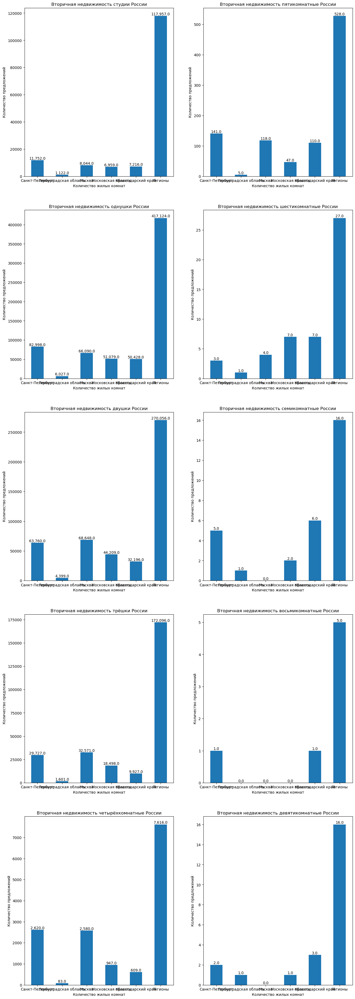

In [718]:
x = np.array(sellings_vt.index)
width = 0.5
plt.figure()
fig, ax = plt.subplots(5, 2, figsize=(16, 48))

ax[0, 0].bar(x, sellings_vt['Студия'], width)
ax[0, 0].set_title('Вторичная недвижимость студии России')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 0].set_xlabel('Количество жилых комнат')
ax[0, 0].set_ylabel('Количество предложений')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')

ax[1, 0].bar(x, sellings_vt['Одна'], width)
ax[1, 0].set_title('Вторичная недвижимость однушки России')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 0].set_xlabel('Количество жилых комнат')
ax[1, 0].set_ylabel('Количество предложений')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')

ax[2, 0].bar(x, sellings_vt['Две'], width)
ax[2, 0].set_title('Вторичная недвижимость двушки России')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 0].set_xlabel('Количество жилых комнат')
ax[2, 0].set_ylabel('Количество предложений')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')

ax[3, 0].bar(x, sellings_vt['Три'], width)
ax[3, 0].set_title('Вторичная недвижимость трёшки России')
ax[3, 0].set_xticks(x)
ax[3, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 0].set_xlabel('Количество жилых комнат')
ax[3, 0].set_ylabel('Количество предложений')
ax[3, 0].bar_label(ax[3, 0].containers[0], fmt='{:,.1f}')

ax[4, 0].bar(x, sellings_vt['Четыре'], width)
ax[4, 0].set_title('Вторичная недвижимость четырёхкомнатные России')
ax[4, 0].set_xticks(x)
ax[4, 0].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 0].set_xlabel('Количество жилых комнат')
ax[4, 0].set_ylabel('Количество предложений')
ax[4, 0].bar_label(ax[4, 0].containers[0], fmt='{:,.1f}')

ax[0, 1].bar(x, sellings_vt['Пять'], width)
ax[0, 1].set_title('Вторичная недвижимость пятикомнатные России')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[0, 1].set_xlabel('Количество жилых комнат')
ax[0, 1].set_ylabel('Количество предложений')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')

ax[1, 1].bar(x, sellings_vt['Шесть'], width)
ax[1, 1].set_title('Вторичная недвижимость шестикомнатные России')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[1, 1].set_xlabel('Количество жилых комнат')
ax[1, 1].set_ylabel('Количество предложений')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')

ax[2, 1].bar(x, sellings_vt['Семь'], width)
ax[2, 1].set_title('Вторичная недвижимость семикомнатные России')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[2, 1].set_xlabel('Количество жилых комнат')
ax[2, 1].set_ylabel('Количество предложений')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')

ax[3, 1].bar(x, sellings_vt['Восемь'], width)
ax[3, 1].set_title('Вторичная недвижимость восьмикомнатные России')
ax[3, 1].set_xticks(x)
ax[3, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[3, 1].set_xlabel('Количество жилых комнат')
ax[3, 1].set_ylabel('Количество предложений')
ax[3, 1].bar_label(ax[3, 1].containers[0], fmt='{:,.1f}')

ax[4, 1].bar(x, sellings_vt['Девять'], width)
ax[4, 1].set_title('Вторичная недвижимость девятикомнатные России')
ax[4, 1].set_xticks(x)
ax[4, 1].set_xticklabels(['Санкт-Петербург', 'Ленинградская область', 'Москва', 'Московская область', 'Краснодарский край', 'Регионы'])
ax[4, 1].set_xlabel('Количество жилых комнат')
ax[4, 1].set_ylabel('Количество предложений')
ax[4, 1].bar_label(ax[4, 1].containers[0], fmt='{:,.1f}')

plt.savefig('grf32.png')

<strong>Выводы</strong>

<table>
    <tr>
        <th>Количество комнат</th>
        <th>Лидер по объёмам продажи</th>
        <th>Последний по объёмам продажи</th>
        <th>В оставшихся регионах</th>
        <th>Продаж нет</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Санкт-Петербург (11'752)</td>
        <td>Ленинградская область(1'122)</td>
        <td>117'957</td>
        <td>-</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Санкт-Петербург (82'998)</td>
        <td>Ленинградская область (6'027)</td>
        <td>417'124</td>
        <td>-</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Москва (68'648)</td>
        <td>Ленинградская область (4'399)</td>
        <td>270'056</td>
        <td>-</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Москва (32'571)</td>
        <td>Ленинградская область (1'601)</td>
        <td>172'096</td>
        <td>-</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Санкт-Петербург (6'260)</td>
        <td>Ленинградская область (83)</td>
        <td>7'616</td>
        <td>-</td>
    </tr>
    </tr>
    <tr>
        <td>5</td>
        <td>Санкт-Петербург (141)</td>
        <td>Ленинградская область (5)</td>
        <td>528</td>
        <td>-</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Московская область, Краснодарский край (7)</td>
        <td>Ленинградская область(1)</td>
        <td>27</td>
        <td>-</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Краснодарский край (6)</td>
        <td>Ленинградская область (1)</td>
        <td>16</td>
        <td>Москва</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Санкт-Петербург, Краснодарский край (1)</td>
        <td>Санкт-Петербург, Краснодарский край (1)</td>
        <td>5</td>
        <td>Ленинградская область, Москва, Московская область</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Краснодарский край (3)</td>
        <td>Ленинградская область, Московская область (1)</td>
        <td>16</td>
        <td>Москва</td>
    </tr>
</table>

<p>В Ленинградской области недвижимость всех видов продавалась наименьшими темпами
<p>Из массового жилья квартир на вторичном рынке лучше всего продажи шли в Санкт-Петербурге (студии и однушки) и в Москве (двушки и трёшки)
<p>Жилья с количеством комнат семь и более в Москве на вторичном рынке продано не было
<p>Во всём датасете только 7 объектов относятся к группе "Вторичный рынок - Восемь комнат"

<h3>Сравнение первичного и вторичного рынка</h3>

<strong>По ценам</strong>

In [719]:
prices_nov_t = prices_nov.T
prices_nov_t.columns = list(prices_nov_t.loc['Region'].values)
prices_nov_t = prices_nov_t[1:].reset_index(drop=True)
prices_nov_t

,Санкт-Петербург,Ленинградская область,Москва,Московская область,Краснодарский край,Регионы
0,100179.63,32410.34,192753.57,72911.07,100369.89,50765.09
1,137650.54,75704.94,208374.25,123403.1,71208.42,56866.23
2,179137.4,120838.25,186808.36,133898.97,84023.57,79976.4
3,170643.62,114412.81,152522.69,125894.03,101200.22,86650.49
4,143034.75,95316.44,132444.53,120120.25,103502.77,83754.78
5,107283.66,93974.36,86238.38,103383.02,70209.25,72147.99
6,84515.06,31538.46,77393.22,85063.75,69736.27,60179.44
7,97499.78,36259.54,113475.18,85810.81,60714.29,39777.66
8,114652.86,92207.79,288461.54,54072.11,34570.09,28598.13
9,137164.04,92473.12,227665.71,95348.84,59720.46,48354.34


In [720]:
prices_vt_t = prices_vt.T
prices_vt_t.columns = list(prices_vt_t.loc['Region'].values)
prices_vt_t = prices_vt_t[1:].reset_index(drop=True)
prices_vt_t

,Санкт-Петербург,Ленинградская область,Москва,Московская область,Краснодарский край,Регионы
0,144893.82,65494.63,150121.12,19542.02,95487.11,33987.15
1,196971.38,68471.49,231496.24,57756.68,57602.58,27836.94
2,192000.84,71152.63,207270.32,50058.13,62382.06,57009.23
3,166970.08,78427.48,168765.01,47249.59,90409.66,64377.9
4,129813.3,87961.22,150231.19,53743.96,58666.06,81939.52
5,158932.38,89699.76,79977.05,40790.52,48598.02,55151.61
6,108769.23,45000.0,227665.71,53731.34,47692.31,43338.46
7,93846.15,45579.78,0.0,90700.32,54433.71,47006.15
8,112214.29,0.0,0.0,0.0,61921.52,43843.04
9,123963.13,125000.0,0.0,64019.45,46976.96,74351.78


<Figure size 900x1700 with 0 Axes>

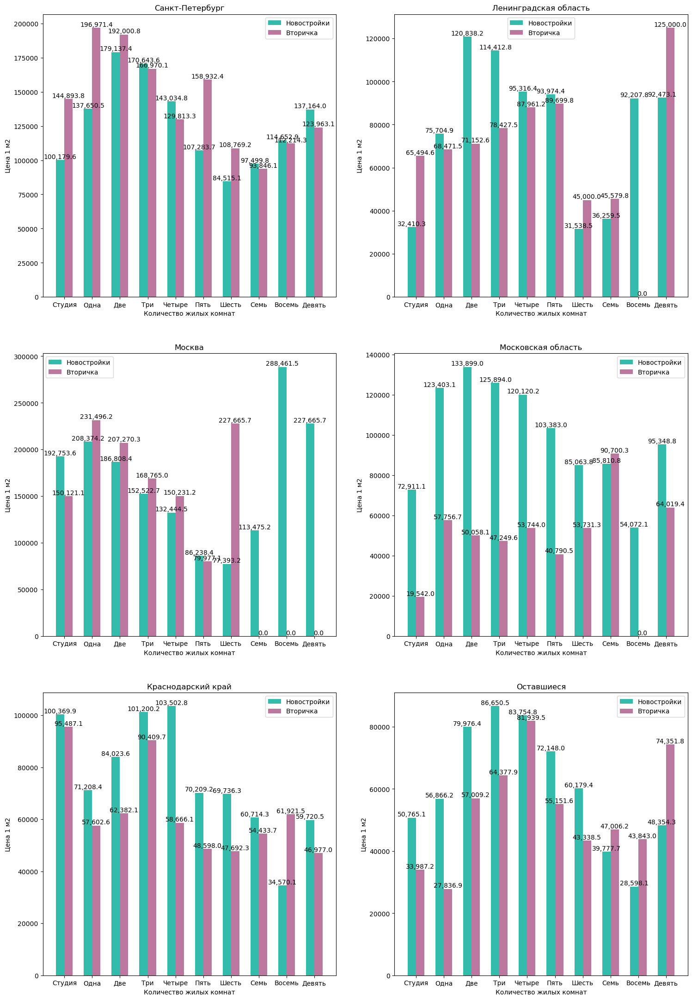

In [721]:
x = np.array(prices_vt_t.index)
width = 0.3
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots(3, 2, figsize=(18, 27))

ax[0, 0].bar(x - width * 0.5, prices_nov_t['Санкт-Петербург'], width, color='#33bcab', label='Новостройки')
ax[0, 0].bar(x + width * 0.5, prices_vt_t['Санкт-Петербург'], width, color='#bc779f', label='Вторичка')
ax[0, 0].set_title('Санкт-Петербург')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[0, 0].set_xlabel('Количество жилых комнат')
ax[0, 0].set_ylabel('Цена 1 м2')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')
ax[0, 0].bar_label(ax[0, 0].containers[1], fmt='{:,.1f}')
ax[0, 0].legend()

ax[0, 1].bar(x - width * 0.5, prices_nov_t['Ленинградская область'], width, color='#33bcab', label='Новостройки')
ax[0, 1].bar(x + width * 0.5, prices_vt_t['Ленинградская область'], width, color='#bc779f', label='Вторичка')
ax[0, 1].set_title('Ленинградская область')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[0, 1].set_xlabel('Количество жилых комнат')
ax[0, 1].set_ylabel('Цена 1 м2')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')
ax[0, 1].bar_label(ax[0, 1].containers[1], fmt='{:,.1f}')
ax[0, 1].legend()

ax[1, 0].bar(x - width * 0.5, prices_nov_t['Москва'], width, color='#33bcab', label='Новостройки')
ax[1, 0].bar(x + width * 0.5, prices_vt_t['Москва'], width, color='#bc779f', label='Вторичка')
ax[1, 0].set_title('Москва')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[1, 0].set_xlabel('Количество жилых комнат')
ax[1, 0].set_ylabel('Цена 1 м2')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')
ax[1, 0].bar_label(ax[1, 0].containers[1], fmt='{:,.1f}')
ax[1, 0].legend()

ax[1, 1].bar(x - width * 0.5, prices_nov_t['Московская область'], width, color='#33bcab', label='Новостройки')
ax[1, 1].bar(x + width * 0.5, prices_vt_t['Московская область'], width, color='#bc779f', label='Вторичка')
ax[1, 1].set_title('Московская область')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[1, 1].set_xlabel('Количество жилых комнат')
ax[1, 1].set_ylabel('Цена 1 м2')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')
ax[1, 1].bar_label(ax[1, 1].containers[1], fmt='{:,.1f}')
ax[1, 1].legend()

ax[2, 0].bar(x - width * 0.5, prices_nov_t['Краснодарский край'], width, color='#33bcab', label='Новостройки')
ax[2, 0].bar(x + width * 0.5, prices_vt_t['Краснодарский край'], width, color='#bc779f', label='Вторичка')
ax[2, 0].set_title('Краснодарский край')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[2, 0].set_xlabel('Количество жилых комнат')
ax[2, 0].set_ylabel('Цена 1 м2')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')
ax[2, 0].bar_label(ax[2, 0].containers[1], fmt='{:,.1f}')
ax[2, 0].legend()

ax[2, 1].bar(x - width * 0.5, prices_nov_t['Регионы'], width, color='#33bcab', label='Новостройки')
ax[2, 1].bar(x + width * 0.5, prices_vt_t['Регионы'], width, color='#bc779f', label='Вторичка')
ax[2, 1].set_title('Оставшиеся')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[2, 1].set_xlabel('Количество жилых комнат')
ax[2, 1].set_ylabel('Цена 1 м2')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')
ax[2, 1].bar_label(ax[2, 1].containers[1], fmt='{:,.1f}')
ax[2, 1].legend()

plt.savefig('grf33.png')

<strong>Выводы</strong>
<p>1. На массовое жильё цены квадратного метра на вторичном рынке меньше, чем в новостройках - справедливо для Ленинградской области, Московской области, Краснодарского края, Оставшихся
<p>2. В Московской области и Оставшихся регионов эти цены различаются существенно, в Ленинградской - для двушек и трёшек - отличие цен также существенно
<p>3. В Санкт-Петербурге и Москве 1 м2 на вторичном рынке дороже, чем в новостройках

In [722]:
sellings_nov_t = sellings_nov.T
sellings_nov_t.columns = list(sellings_nov_t.loc['Region'].values)
sellings_nov_t = sellings_nov_t[1:].reset_index(drop=True)
sellings_nov_t

,Санкт-Петербург,Ленинградская область,Москва,Московская область,Краснодарский край,Регионы
0,10879,2956,14167,8548,19805,84659
1,90661,16680,68842,139923,229831,807547
2,83432,12312,81875,144264,176687,815493
3,56757,6116,50118,74148,88288,523651
4,9233,589,5168,7414,9191,86048
5,1748,40,502,656,877,6629
6,238,3,44,47,67,239
7,45,1,15,7,15,43
8,16,1,5,2,3,25
9,10,1,6,10,19,49


In [723]:
sellings_vt_t = sellings_vt.T
sellings_vt_t.columns = list(sellings_vt_t.loc['Region'].values)
sellings_vt_t = sellings_vt_t[1:].reset_index(drop=True)
sellings_vt_t

,Санкт-Петербург,Ленинградская область,Москва,Московская область,Краснодарский край,Регионы
0,11752.0,1122.0,8044.0,6959.0,7216.0,117957.0
1,82998.0,6027.0,66090.0,51079.0,50428.0,417124.0
2,63760.0,4399.0,68648.0,44209.0,32196.0,270056.0
3,29727.0,1601.0,32571.0,18498.0,9927.0,172096.0
4,2620.0,83.0,2580.0,947.0,609.0,7616.0
5,141.0,5.0,118.0,47.0,110.0,528.0
6,3.0,1.0,4.0,7.0,7.0,27.0
7,5.0,1.0,0.0,2.0,6.0,16.0
8,1.0,0.0,0.0,0.0,1.0,5.0
9,2.0,1.0,0.0,1.0,3.0,16.0


<Figure size 900x1700 with 0 Axes>

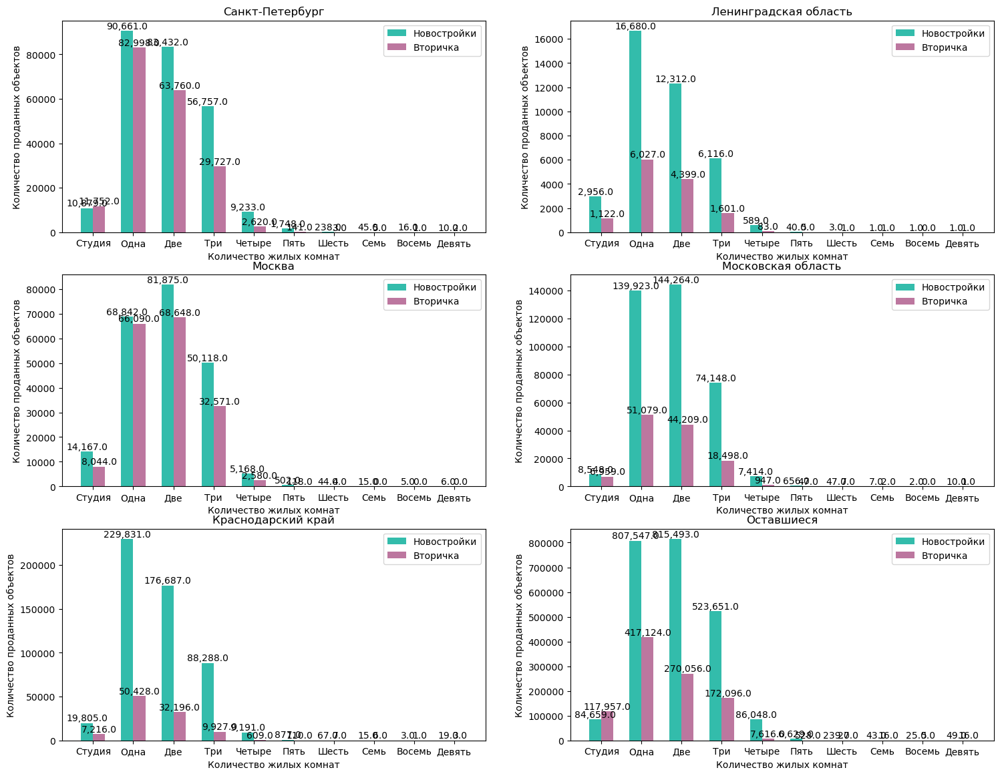

In [724]:
x = np.array(prices_vt_t.index)
width = 0.3
plt.figure(figsize=(9, 17))
fig, ax = plt.subplots(3, 2, figsize=(18, 14))

ax[0, 0].bar(x - width * 0.5, sellings_nov_t['Санкт-Петербург'], width, color='#33bcab', label='Новостройки')
ax[0, 0].bar(x + width * 0.5, sellings_vt_t['Санкт-Петербург'], width, color='#bc779f', label='Вторичка')
ax[0, 0].set_title('Санкт-Петербург')
ax[0, 0].set_xticks(x)
ax[0, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[0, 0].set_xlabel('Количество жилых комнат')
ax[0, 0].set_ylabel('Количество проданных объектов')
ax[0, 0].bar_label(ax[0, 0].containers[0], fmt='{:,.1f}')
ax[0, 0].bar_label(ax[0, 0].containers[1], fmt='{:,.1f}')
ax[0, 0].legend()

ax[0, 1].bar(x - width * 0.5, sellings_nov_t['Ленинградская область'], width, color='#33bcab', label='Новостройки')
ax[0, 1].bar(x + width * 0.5, sellings_vt_t['Ленинградская область'], width, color='#bc779f', label='Вторичка')
ax[0, 1].set_title('Ленинградская область')
ax[0, 1].set_xticks(x)
ax[0, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[0, 1].set_xlabel('Количество жилых комнат')
ax[0, 1].set_ylabel('Количество проданных объектов')
ax[0, 1].bar_label(ax[0, 1].containers[0], fmt='{:,.1f}')
ax[0, 1].bar_label(ax[0, 1].containers[1], fmt='{:,.1f}')
ax[0, 1].legend()

ax[1, 0].bar(x - width * 0.5, sellings_nov_t['Москва'], width, color='#33bcab', label='Новостройки')
ax[1, 0].bar(x + width * 0.5, sellings_vt_t['Москва'], width, color='#bc779f', label='Вторичка')
ax[1, 0].set_title('Москва')
ax[1, 0].set_xticks(x)
ax[1, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[1, 0].set_xlabel('Количество жилых комнат')
ax[1, 0].set_ylabel('Количество проданных объектов')
ax[1, 0].bar_label(ax[1, 0].containers[0], fmt='{:,.1f}')
ax[1, 0].bar_label(ax[1, 0].containers[1], fmt='{:,.1f}')
ax[1, 0].legend()

ax[1, 1].bar(x - width * 0.5, sellings_nov_t['Московская область'], width, color='#33bcab', label='Новостройки')
ax[1, 1].bar(x + width * 0.5, sellings_vt_t['Московская область'], width, color='#bc779f', label='Вторичка')
ax[1, 1].set_title('Московская область')
ax[1, 1].set_xticks(x)
ax[1, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[1, 1].set_xlabel('Количество жилых комнат')
ax[1, 1].set_ylabel('Количество проданных объектов')
ax[1, 1].bar_label(ax[1, 1].containers[0], fmt='{:,.1f}')
ax[1, 1].bar_label(ax[1, 1].containers[1], fmt='{:,.1f}')
ax[1, 1].legend()

ax[2, 0].bar(x - width * 0.5, sellings_nov_t['Краснодарский край'], width, color='#33bcab', label='Новостройки')
ax[2, 0].bar(x + width * 0.5, sellings_vt_t['Краснодарский край'], width, color='#bc779f', label='Вторичка')
ax[2, 0].set_title('Краснодарский край')
ax[2, 0].set_xticks(x)
ax[2, 0].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[2, 0].set_xlabel('Количество жилых комнат')
ax[2, 0].set_ylabel('Количество проданных объектов')
ax[2, 0].bar_label(ax[2, 0].containers[0], fmt='{:,.1f}')
ax[2, 0].bar_label(ax[2, 0].containers[1], fmt='{:,.1f}')
ax[2, 0].legend()

ax[2, 1].bar(x - width * 0.5, sellings_nov_t['Регионы'], width, color='#33bcab', label='Новостройки')
ax[2, 1].bar(x + width * 0.5, sellings_vt_t['Регионы'], width, color='#bc779f', label='Вторичка')
ax[2, 1].set_title('Оставшиеся')
ax[2, 1].set_xticks(x)
ax[2, 1].set_xticklabels(['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять'])
ax[2, 1].set_xlabel('Количество жилых комнат')
ax[2, 1].set_ylabel('Количество проданных объектов')
ax[2, 1].bar_label(ax[2, 1].containers[0], fmt='{:,.1f}')
ax[2, 1].bar_label(ax[2, 1].containers[1], fmt='{:,.1f}')
ax[2, 1].legend()

plt.savefig('grf34.png')

<strong>Выводы</strong>
<p>1. В новостройках квартир больше продавалось практически для всех вариантов жилья
<p>2. Для Ленинградской области, Московской области, Краснодарского края и Оставшихся регионов эта разница существенная
<p>3. Жилья с количеством комнат пять и более продано пренебрежимо мало

<h2>5. Исследование месяца для покупки недвижимости</h2>

In [725]:
def grfc(dataframe_1, dataframe_2, index):
    return (ax[index].plot(x, dataframe_1[dataframe_1.columns[index]], 'o-', label='Новостройки'),
            ax[index].plot(x, dataframe_2[dataframe_2.columns[index]], 'o-', label='Вторичка'),
            ax[index].set_title(f'Количество комнат {dataframe_1.columns[index]}'),
            ax[index].set_xticks(x),
            ax[index].set_xticklabels(['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь']),
            ax[index].set_xlabel('Месяц'),
            ax[index].set_ylabel('Медианная цена'),
            ax[index].legend())

<h3>Санкт-Петербург</h3>

In [726]:
realty_nov_spb_grouped = pd.DataFrame()
realty_nov_spb_grouped.insert(0, 0, realty_spb.query('rooms == -1 and object_type == True').groupby(by=realty_spb['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_spb_grouped.insert(i, i, realty_spb.query('rooms == @i and object_type == True').groupby(by=realty_spb['date'].dt.month).price.median())
realty_nov_spb_grouped = realty_nov_spb_grouped.fillna(0)
realty_nov_spb_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_spb_grouped
                              

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,3500000.0,4550000.0,6100000.0,7700000.0,9700000.0,11995000.0,12150000.0,10300000.0,19440000.0,15621500.0
2,3471500.0,4700000.0,6474000.0,8400000.0,9950000.0,11900000.0,15400000.0,10950000.0,12500000.0,4050000.0
3,3900000.0,4900000.0,6600000.0,8500000.0,10850000.0,12875000.0,14100000.0,15000000.0,20500000.0,10700000.0
4,3998500.0,5200000.0,6900000.0,8950000.0,11000000.0,13300000.0,15700000.0,16700000.0,17450000.0,16200000.0
5,3500000.0,4550000.0,6200000.0,7993525.0,10201000.0,12000000.0,12075000.0,17200000.0,12500000.0,0.0
6,3410000.0,4500000.0,6000000.0,7800000.0,9999000.0,12600000.0,10999000.0,12150000.0,13790000.0,14800000.0
7,3450000.0,4540000.0,6150000.0,8100000.0,10000000.0,13500000.0,13849500.0,11000000.0,16100000.0,0.0
8,3400000.0,4550000.0,6198500.0,8000000.0,10400000.0,12500000.0,15300000.0,0.0,0.0,0.0
9,3350000.0,4900000.0,6000000.0,7500000.0,9217862.5,11499500.0,12000000.0,11700000.0,18900000.0,0.0


In [727]:
realty_vt_spb_grouped = pd.DataFrame()
realty_vt_spb_grouped.insert(0, 0, realty_spb.query('rooms == -1 and object_type == False').groupby(by=realty_spb['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_spb_grouped.insert(i, i, realty_spb.query('rooms == @i and object_type == False').groupby(by=realty_spb['date'].dt.month).price.median())
realty_vt_spb_grouped = realty_vt_spb_grouped.fillna(0)
realty_vt_spb_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_spb_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,3097000.0,4489742.5,6548766.5,10000000.0,14358494.0,10697600.0,0.0,0.0,0.0,0.0
2,3297450.0,4629540.0,6961283.5,10521500.0,15125049.0,19127680.0,0.0,0.0,0.0,0.0
3,3376631.0,4624514.0,7034207.5,10378749.5,15347446.0,11973610.0,6100000.0,0.0,4713000.0,0.0
4,3405850.0,5103455.0,8122499.5,11192186.0,16693748.5,13776263.0,0.0,13350000.0,0.0,0.0
5,3074250.0,4503000.0,6851745.5,10138776.0,15839040.0,13200000.0,0.0,0.0,0.0,0.0
6,3100000.0,4377840.0,6543000.0,9950000.0,15547308.0,16453130.0,0.0,7200000.0,0.0,3750000.0
7,3167899.0,4547165.0,6922356.0,10400000.0,14700000.0,18833675.0,0.0,0.0,0.0,0.0
8,3100000.0,4500000.0,6806264.0,9900000.0,12382900.0,19367984.0,0.0,0.0,0.0,0.0
9,3100000.0,4400000.0,6625000.0,9803252.5,14560000.0,19713500.0,0.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

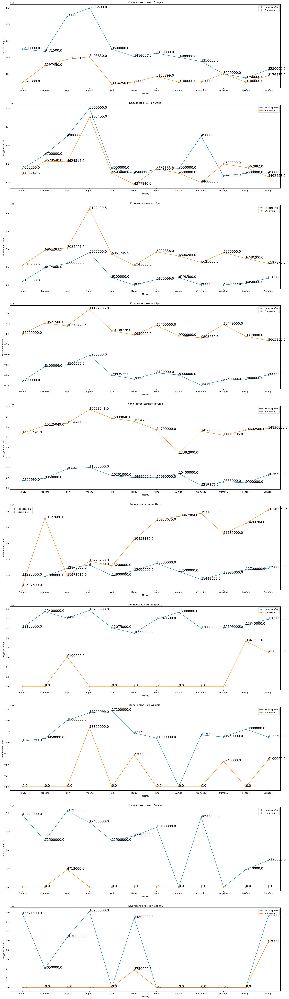

In [728]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(10, 1, figsize=(24, 88))

  # Желание сделать код короче победило (сначала здесь была простыня для каждого столбца отдельно), я нашёл способ, как это сделать. 
  # И даже понял, как добавить подписи цены, посмотрел в документации
for i in range(10):
    grfc(realty_nov_spb_grouped, realty_vt_spb_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_spb_grouped[realty_nov_spb_grouped.columns[i]], realty_nov_spb_grouped[realty_nov_spb_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_spb_grouped[realty_vt_spb_grouped.columns[i]], realty_vt_spb_grouped[realty_vt_spb_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf35.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Ноябрь (3'150'000)</td>
        <td>Май (3'074'250)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Октябрь (4'470'000)</td>
        <td>Июнь (4'377'840)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Июнь (6'543'000)</td>
        <td>Октябрь (5'999'999)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Декабрь (9'665'850)</td>
        <td>Сентябрь (7'500'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Август (12'382'900)</td>
        <td>Сентябрь (9'217'862,5)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Март (11'973'610)</td>
        <td>Сентябрь (11'499'500)</td>
    </tr>
    <tr>
        <td>Шесть комнат</td>
        <td>Июнь (10'999'000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Семь комнат</td>
        <td>Январь (10'300'000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Восемь комнат</td>
        <td>Ноябрь (4'740'000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Девять комнат</td>
        <td>Февраль (4'050'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Апрель (3998500)</td>
        <td>Апрель (3405850)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Апрель (5200000)</td>
        <td>Апрель (5103455)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Апрель (8122499,5)</td>
        <td>Апрель (6900000)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Апрель (11192186)</td>
        <td>Апрель (8950000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Апрель (16693748,5)</td>
        <td>Апрель (11000000)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Декабрь(20140059,5)</td>
        <td>Июль (13500000)</td>
    </tr>
    <tr>
        <td>Шесть комнат</td>
        <td>Апрель (16700000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Семь комнат</td>
        <td>Май (17200000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Восемь комнат</td>
        <td>Март (20500000)</td>
        <td>Недостаточно данных</td>
    </tr>
    <tr>
        <td>Девять комнат</td>
        <td>Апрель (16200000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<p>1. Покупать квартиру выгоднее всего осенью
<p>2. Продавать квартиру выгоднее всего весной, особенно, в апреле

<h3>Ленинградская область</h3>

In [729]:
realty_nov_lo_grouped = pd.DataFrame()
realty_nov_lo_grouped.insert(0, 0, realty_lo.query('rooms == -1 and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_lo_grouped.insert(i, i, realty_lo.query('rooms == @i and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
realty_nov_lo_grouped = realty_nov_lo_grouped.fillna(0)
realty_nov_lo_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_lo_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,2875000.0,3350000.0,3700000.0,4500000.0,3999000.0,4850000.0,0.0,0.0,0.0,8600000.0
2,2950000.0,3486000.0,3800000.0,4850000.0,4150000.0,6300000.0,4100000.0,0.0,0.0,0.0
3,3000000.0,3700000.0,4000000.0,4600000.0,3620000.0,5990000.0,1950000.0,0.0,0.0,0.0
4,3470000.0,3800000.0,4650000.0,4890000.0,4550000.0,5000000.0,0.0,0.0,0.0,0.0
5,2850000.0,3400000.0,4050000.0,4600000.0,3500000.0,1975000.0,0.0,0.0,0.0,0.0
6,2800000.0,3350000.0,3970000.0,4125000.0,3550000.0,5400000.0,0.0,0.0,0.0,0.0
7,2800000.0,3400000.0,4000000.0,4600000.0,4200000.0,8468000.0,0.0,0.0,3550000.0,0.0
8,2750000.0,3400000.0,4100000.0,4700000.0,4500000.0,0.0,0.0,0.0,0.0,0.0
9,2800000.0,3300000.0,3935000.0,4700000.0,4150000.0,2950000.0,0.0,5700000.0,0.0,0.0


In [730]:
realty_vt_lo_grouped = pd.DataFrame()
realty_vt_lo_grouped.insert(0, 0, realty_lo.query('rooms == -1 and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_lo_grouped.insert(i, i, realty_lo.query('rooms == @i and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
realty_vt_lo_grouped = realty_vt_lo_grouped.fillna(0)
realty_vt_lo_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_lo_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,2135000.0,3162896.0,4484780.0,6000000.0,6996205.0,0.0,0.0,0.0,0.0,0.0
2,2347000.0,3340272.0,5301844.0,6677736.0,7200000.0,0.0,3420000.0,0.0,0.0,5000000.0
3,2400000.0,4070110.0,5454013.0,6520075.0,8434024.0,0.0,0.0,0.0,0.0,0.0
4,2305000.0,3995000.0,5100000.0,6900000.0,9693498.5,0.0,0.0,0.0,0.0,0.0
5,2060000.0,3337966.0,5100000.0,5940000.0,6267800.0,0.0,0.0,0.0,0.0,0.0
6,2100000.0,3338485.0,4935000.0,6934263.5,6400000.0,0.0,0.0,0.0,0.0,0.0
7,2090000.0,3509251.5,5195000.0,7154000.0,7453908.0,0.0,0.0,0.0,0.0,0.0
8,2385000.0,3200000.0,5009480.0,6332015.0,7354873.0,0.0,0.0,0.0,0.0,0.0
9,2300000.0,3200000.0,4550000.0,6354615.0,7265000.0,0.0,0.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

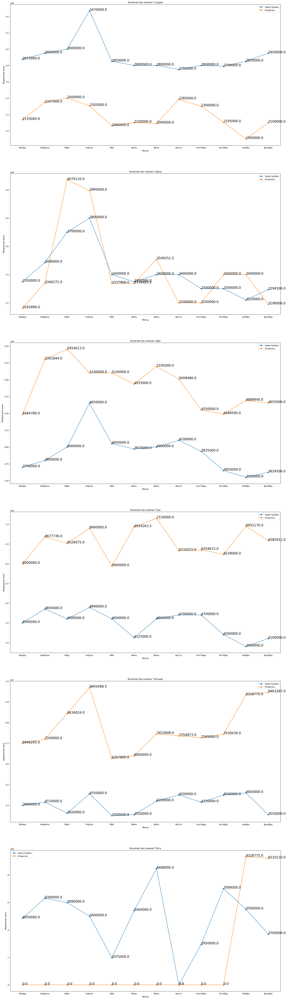

In [731]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(6, 1, figsize=(24, 88))

  # Для шести комнат и выше строить графики смысла нет, потому что недостаточно данных для выяснения наиболее привлекательных месяцев (надо 6 и более)
for i in range(6):
    grfc(realty_nov_lo_grouped, realty_vt_lo_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_lo_grouped[realty_nov_lo_grouped.columns[i]], realty_nov_lo_grouped[realty_nov_lo_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_lo_grouped[realty_vt_lo_grouped.columns[i]], realty_vt_lo_grouped[realty_vt_lo_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf36.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Август (2'750'000)</td>
        <td>Ноябрь (1'900'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Ноябрь (3'220'000)</td>
        <td>Январь (3'162'896)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Ноябрь (3'550'000)</td>
        <td>Январь (4'484'780)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Ноябрь (3'900'000)</td>
        <td>Май (5'940'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Май (3'500'000)</td>
        <td>Май (6'267'800)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Май (1'975'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Апрель (3'470'000)</td>
        <td>Март (2'400'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Апрель (3'800'000)</td>
        <td>Март (4'070'110)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Апрель (4'650'000)</td>
        <td>Март (5'454'013)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Апрель (4'890'000)</td>
        <td>Июль (7'154'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Ноябрь (4'600'000)</td>
        <td>Апрель (9'693'498,5)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Июль(8'468'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<p>1. Покупать квартиру выгоднее всего с ноября по январь
<p>2. Продавать квартиру выгоднее всего весной, особенно, в апреле (новостройки) и марте (вторичный рынок)
<p>3. Цены на вторичном рынке достигают своего пика через два месяца после пика цен на новостройках
<p>4. Ненормально, что в Ленинградской области недвижимость на вторичном рынке стоит дороже, чем в новостройках, за исключением студий

<h3>Москва</h3>

In [732]:
realty_nov_msk_grouped = pd.DataFrame()
realty_nov_msk_grouped.insert(0, 0, realty_msk.query('rooms == -1 and object_type == True').groupby(by=realty_msk['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_msk_grouped.insert(i, i, realty_msk.query('rooms == @i and object_type == True').groupby(by=realty_msk['date'].dt.month).price.median())
realty_nov_msk_grouped = realty_nov_msk_grouped.fillna(0)
realty_nov_msk_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_msk_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,3800000.0,7000000.0,9500000.0,12500000.0,15500000.0,17800000.0,20461000.0,0.0,0.0,7300000.0
2,3800000.0,7300000.0,10000000.0,12592109.5,15700000.0,18150000.0,16250000.0,15500000.0,12100000.0,8500000.0
3,3900000.0,7600000.0,10350000.0,13000000.0,16550000.0,17950000.0,17509283.0,16575000.0,0.0,0.0
4,4050000.0,7900000.0,10600000.0,13500000.0,16400000.0,17900000.0,22700000.0,0.0,19500000.0,4000000.0
5,3550000.0,6935000.0,9500000.0,12500000.0,15500000.0,16850000.0,18445000.0,6500000.0,0.0,0.0
6,3600000.0,7000000.0,9500000.0,12250000.0,15900000.0,17400000.0,14900000.0,0.0,0.0,0.0
7,3700000.0,7000000.0,9500000.0,12425000.0,16216000.0,17247500.0,14356919.0,17440000.0,10500000.0,0.0
8,3750000.0,7000000.0,9470000.0,12500000.0,16300000.0,20494658.5,17000000.0,15500000.0,15000000.0,0.0
9,3750000.0,6990000.0,9300000.0,12100000.0,15800000.0,17225000.0,20800000.0,16975000.0,0.0,0.0


In [733]:
realty_vt_msk_grouped = pd.DataFrame()
realty_vt_msk_grouped.insert(0, 0, realty_msk.query('rooms == -1 and object_type == False').groupby(by=realty_msk['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_msk_grouped.insert(i, i, realty_msk.query('rooms == @i and object_type == False').groupby(by=realty_msk['date'].dt.month).price.median())
realty_vt_msk_grouped = realty_vt_msk_grouped.fillna(0)
realty_vt_msk_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_msk_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,5462520.0,6552444.0,9463437.0,12841180.0,17428400.0,15517600.0,0.0,0.0,0.0,0.0
2,6000360.0,7308628.5,10200000.0,13919526.0,18846415.0,14722468.0,0.0,0.0,0.0,0.0
3,6192000.0,7176476.0,10335000.0,14084070.0,20569434.0,16039532.0,0.0,0.0,0.0,0.0
4,6182980.0,7693658.0,10654060.0,14069800.0,18459100.0,14300000.0,16806661.0,0.0,0.0,0.0
5,5579370.0,7009740.0,9684045.0,12355362.0,15674816.5,13541444.0,8000000.0,0.0,0.0,0.0
6,5994300.0,7067000.0,9795034.5,12717908.0,16123200.0,16500000.0,20490000.0,0.0,0.0,0.0
7,5200000.0,7150000.0,10219398.0,13206002.0,17602283.5,15061200.0,23000000.0,0.0,0.0,0.0
8,5340720.0,6870680.0,9669780.0,13094117.0,20952970.0,16850000.0,0.0,0.0,0.0,0.0
9,5123650.0,6549200.0,9029510.0,11900000.0,15749920.0,13328452.0,0.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

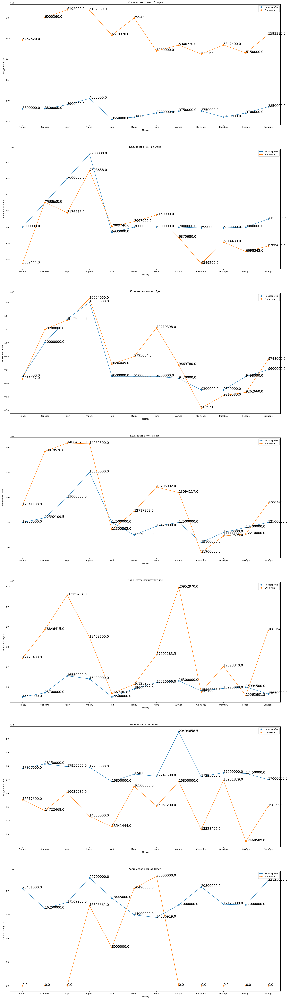

In [734]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(7, 1, figsize=(24, 88))

  # Для семи комнат и выше строить графики смысла нет, потому что недостаточно данных для выяснения наиболее привлекательных месяцев (надо 6 и более)
for i in range(7):
    grfc(realty_nov_msk_grouped, realty_vt_msk_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_msk_grouped[realty_nov_msk_grouped.columns[i]], realty_nov_msk_grouped[realty_nov_msk_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_msk_grouped[realty_vt_msk_grouped.columns[i]], realty_vt_msk_grouped[realty_vt_msk_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf37.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Май (3'550'000)</td>
        <td>Сентябрь (5'123'650)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Май (6'935'000)</td>
        <td>Сентябрь (6'549'200)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Сентябрь, Октябрь (9'300'000)</td>
        <td>Сентябрь (9'029'510)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Сентябрь (12'100'000)</td>
        <td>Сентябрь (11'900'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Май (15'500'000)</td>
        <td>Ноябрь (15'563'601,5)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Май (16'850'000)</td>
        <td>Ноябрь (12'468'589)</td>
    </tr>
    <tr>
        <td>Щесть комнат</td>
        <td>Июль (14'356'919)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Апрель (4'050'000)</td>
        <td>Март (6'192'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Апрель (7'900'000)</td>
        <td>Апрель (7'693'658)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Апрель (10'600'000)</td>
        <td>Апрель (10'654'060)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Апрель (13'500'000)</td>
        <td>Март (14'084'070)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Март (16'550'000)</td>
        <td>Август (20'952'970)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Август (20'494'658,5)</td>
        <td>Октябрь (16'931'879)</td>
    </tr>
    <tr>
        <td>Щесть комнат</td>
        <td>Апрель(22'700'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<p>1. Покупать квартиру выгоднее всего осенью или в мае
<p>2. Продавать квартиру выгоднее всего весной, особенно, в апреле - массовые и в августе - более четырёх комнат
<p>3. Цены на вторичном рынке на студии выше, чем в новостройках
<p>4. Цены на студии в новостройках менее всего подвержены месячным колебаниям

<h3>Московская область</h3>

In [735]:
realty_nov_mo_grouped = pd.DataFrame()
realty_nov_mo_grouped.insert(0, 0, realty_mo.query('rooms == -1 and object_type == True').groupby(by=realty_mo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_mo_grouped.insert(i, i, realty_mo.query('rooms == @i and object_type == True').groupby(by=realty_mo['date'].dt.month).price.median())
realty_nov_mo_grouped = realty_nov_mo_grouped.fillna(0)
realty_nov_mo_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_mo_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,3150000.0,3400000.0,4200000.0,5500000.0,6525000.0,9500000.0,8695000.0,4900000.0,0.0,2400000.0
2,3250000.0,3500000.0,4370000.0,5600000.0,6400000.0,9500000.0,3800000.0,4900000.0,0.0,6900000.0
3,3300000.0,3700000.0,4500000.0,5880000.0,6800000.0,9500000.0,11800000.0,7200000.0,0.0,0.0
4,3560000.0,3800000.0,4650000.0,6100000.0,7825000.0,8500000.0,11800000.0,6350000.0,0.0,10600000.0
5,3000000.0,3350000.0,4200000.0,5500000.0,6225000.0,8390000.0,5845000.0,0.0,0.0,0.0
6,3180000.0,3490000.0,4285000.0,5410000.0,6500000.0,8500000.0,9300000.0,0.0,0.0,0.0
7,3195000.0,3580000.0,4300000.0,5500000.0,6500000.0,9850000.0,5125000.0,0.0,0.0,0.0
8,3250000.0,3499000.0,4200000.0,5500000.0,6250000.0,9700000.0,9800000.0,0.0,0.0,3800000.0
9,3050000.0,3350000.0,4100000.0,5400000.0,6300000.0,7695000.0,8900000.0,0.0,0.0,4200000.0


In [736]:
realty_vt_mo_grouped = pd.DataFrame()
realty_vt_mo_grouped.insert(0, 0, realty_mo.query('rooms == -1 and object_type == False').groupby(by=realty_mo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_mo_grouped.insert(i, i, realty_mo.query('rooms == @i and object_type == False').groupby(by=realty_mo['date'].dt.month).price.median())
realty_vt_mo_grouped = realty_vt_mo_grouped.fillna(0)
realty_vt_mo_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_mo_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1,3631320.0,4006065.0,5965230.0,7178330.0,9243387.0,9800000.0,6100000.0,4200000.0,0.0,0.0
2,3600000.0,4200000.0,5856602.0,7480000.0,10040978.5,15498600.0,1398000.0,0.0,0.0,0.0
3,3700000.0,4426650.0,6110440.0,7666198.0,10015720.0,10400000.0,0.0,0.0,0.0,0.0
4,3949060.0,4450000.0,6277062.5,7806876.0,10350235.0,12000000.0,7700000.0,0.0,0.0,0.0
5,2730000.0,3969700.0,5545740.0,6974040.0,10708260.0,14648860.0,0.0,0.0,0.0,0.0
6,2850065.0,3520049.0,4712760.5,6345468.0,9840000.0,10383670.0,0.0,4298620.0,0.0,0.0
7,2918350.0,4042202.0,5540320.0,6825020.0,9961875.0,13160870.0,7200000.0,0.0,0.0,0.0
8,3100000.0,3700000.0,5309590.0,6815365.0,9305400.0,6200000.0,0.0,0.0,0.0,0.0
9,2929050.0,3745085.0,5282028.0,6500000.0,7959745.0,13000000.0,12500000.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

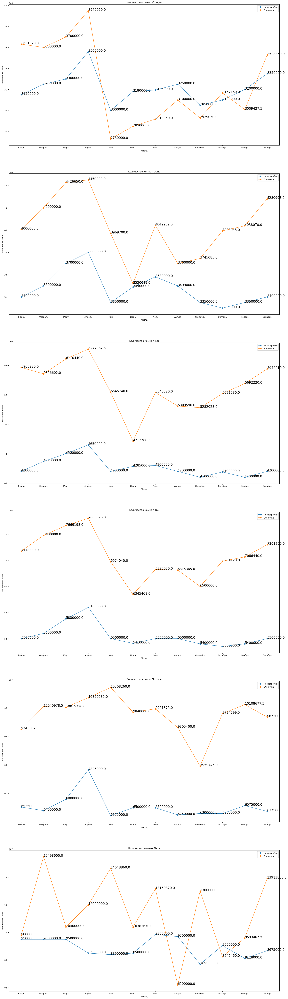

In [737]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(6, 1, figsize=(24, 88))

  # Для семи комнат и выше строить графики смысла нет, потому что недостаточно данных для выяснения наиболее привлекательных месяцев (надо 6 и более)
for i in range(6):
    grfc(realty_nov_mo_grouped, realty_vt_mo_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_mo_grouped[realty_nov_mo_grouped.columns[i]], realty_nov_mo_grouped[realty_nov_mo_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_mo_grouped[realty_vt_mo_grouped.columns[i]], realty_vt_mo_grouped[realty_vt_msk_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf38.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Май (3'000'000)</td>
        <td>Май (2'730'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Октябрь (3'300'000)</td>
        <td>Июнь (3'520'049)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Сентябрь, Ноябрь (4'100'000)</td>
        <td>Июнь (4'712'760,5)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Октябрь (5'350'000)</td>
        <td>Июнь (6'345'468)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Май (6'225'000)</td>
        <td>Сентябрь (7'959'745)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Октябрь (7'695'000)</td>
        <td>Август (6'200'000)</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Апрель (3'560'000)</td>
        <td>Апрель (3'949'060)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Апрель (3'800'000)</td>
        <td>Апрель (4'450'000)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Апрель (4'650'000)</td>
        <td>Апрель (6'277'062,5)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Апрель (6'100'000)</td>
        <td>Апрель (7'806'876)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Апрель (7'825'000)</td>
        <td>Май (10'708'260)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Июль(9'850'000)</td>
        <td>Февраль (15'498'600)</td>
    </tr>
</table>

<p>1. Покупать квартиру выгоднее всего во вторичном фонде - в мае, а в новостройке - осенью
<p>2. Продавать квартиру выгоднее всего весной, особенно, в апреле
<p>3. Наблюдается интересный тренд на первичном рынке
<p>4. Недвижимость на вторичном рынке стабильно дороже, чем на первичном

<h3>Краснодарский край</h3>

In [738]:
realty_nov_kk_grouped = pd.DataFrame()
realty_nov_kk_grouped.insert(0, 0, realty_kk.query('rooms == -1 and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_kk_grouped.insert(i, i, realty_kk.query('rooms == @i and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
realty_nov_kk_grouped = realty_nov_kk_grouped.fillna(0)
realty_nov_kk_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_kk_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1.0,1300000.0,1950000.0,2950000.0,3650000.0,4700000.0,5857000.0,0.0,2450700.0,0.0,0.0
2.0,1500000.0,2000000.0,3000000.0,3900000.0,5150000.0,4950000.0,0.0,0.0,0.0,0.0
3.0,1575000.0,1995000.0,3100000.0,4000000.0,4500000.0,6000000.0,6100000.0,0.0,3699000.0,0.0
4.0,1400000.0,2000000.0,3000000.0,3950000.0,4300000.0,5500000.0,14500000.0,0.0,0.0,0.0
5.0,1380000.0,1930000.0,2847480.0,3700000.0,3800000.0,5249500.0,0.0,0.0,0.0,0.0
6.0,1350000.0,1950000.0,2900000.0,3900000.0,4950000.0,5900000.0,0.0,0.0,0.0,0.0
7.0,1350000.0,2000000.0,3000000.0,3810000.0,4575000.0,7500000.0,15000000.0,0.0,0.0,0.0
8.0,1490000.0,2000000.0,3000000.0,3700000.0,4225000.0,4800000.0,0.0,0.0,0.0,0.0
9.0,1495000.0,1980480.0,3050000.0,3850000.0,4050000.0,3050000.0,0.0,0.0,9500000.0,0.0


In [739]:
realty_vt_kk_grouped = pd.DataFrame()
realty_vt_kk_grouped.insert(0, 0, realty_kk.query('rooms == -1 and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_kk_grouped.insert(i, i, realty_kk.query('rooms == @i and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
realty_vt_kk_grouped = realty_vt_kk_grouped.fillna(0)
realty_vt_kk_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_kk_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1.0,1616120.0,1899000.0,2641800.0,3652000.0,13080000.0,0.0,0.0,0.0,0.0,0.0
2.0,2300000.0,1904420.0,2934000.0,3952000.0,12400000.0,7195000.0,0.0,0.0,0.0,0.0
3.0,1451000.0,1900000.0,2650000.0,3940000.0,5549999.5,5500000.0,0.0,0.0,0.0,0.0
4.0,1508000.0,1886041.5,2836666.0,3897635.0,11000000.0,0.0,0.0,0.0,0.0,0.0
5.0,1375000.0,1840328.0,3005000.0,3979932.5,0.0,0.0,0.0,0.0,0.0,0.0
6.0,1621072.0,1909485.5,2800000.0,3867500.0,6950000.0,0.0,0.0,0.0,0.0,0.0
7.0,1600000.0,1850000.0,2900000.0,3778046.0,12100000.0,0.0,0.0,0.0,0.0,0.0
8.0,1500000.0,1900000.0,2650000.0,3750900.0,4300000.0,0.0,0.0,0.0,0.0,0.0
9.0,1325000.0,1900000.0,2819816.5,3901226.0,5800000.0,0.0,0.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

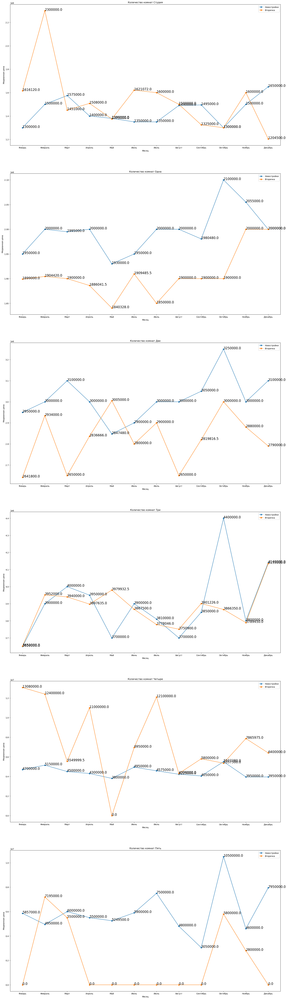

In [740]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(6, 1, figsize=(24, 88))

  # Для шести комнат и выше строить графики смысла нет, потому что недостаточно данных для выяснения наиболее привлекательных месяцев (надо 6 и более)
for i in range(6):
    grfc(realty_nov_kk_grouped, realty_vt_kk_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_kk_grouped[realty_nov_kk_grouped.columns[i]], realty_nov_kk_grouped[realty_nov_kk_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_kk_grouped[realty_vt_kk_grouped.columns[i]], realty_vt_kk_grouped[realty_vt_kk_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf39.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Январь, Октябрь (1'300'000)</td>
        <td>Декабрь (1'204'500)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Май (1'930'000)</td>
        <td>Май (1'840'328)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Май (2'847'480)</td>
        <td>Январь (2'641'800)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Январь (3'650'000)</td>
        <td>Январь (3'650'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Ноябрь, Декабрь (3'950'000)</td>
        <td>Август (4'300'000)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Сентябрь (3'050'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Декабрь (1'650'000)</td>
        <td>Февраль (2'300'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Октябрь (2'100'000)</td>
        <td>Нобрь, Декабрь (2'000'000)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Октябрь (3'250'000)</td>
        <td>Октябрь (3'000'000)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Октябрь (4'135'000)</td>
        <td>Декабрь (7'154'000)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Октбрь (5'507'380)</td>
        <td>Январь (13'080'000)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Октябрь(10'500'000)</td>
        <td>Недостаточно данных</td>
    </tr>
</table>

<p>1. Покупать квартиру выгоднее всего в январе или в мае
<p>2. Продавать квартиру выгоднее всего с отяюря по декабрь

<h3>Оставшиеся регионы</h3>

In [741]:
realty_nov_mass_grouped = pd.DataFrame()
realty_nov_mass_grouped.insert(0, 0, realty_mass.query('rooms == -1 and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_nov_mass_grouped.insert(i, i, realty_mass.query('rooms == @i and object_type == True').groupby(by=realty_lo['date'].dt.month).price.median())
realty_nov_mass_grouped = realty_nov_mass_grouped.fillna(0)
realty_nov_mass_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_nov_mass_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1.0,1485000.0,1725000.0,2370000.0,3100000.0,3549250.0,3250000.0,0.0,0.0,0.0,0.0
2.0,1430000.0,1700000.0,2277700.0,3070000.0,3600000.0,4750000.0,0.0,0.0,0.0,0.0
3.0,1460000.0,1670000.0,2350000.0,2900000.0,3520000.0,4900000.0,0.0,0.0,0.0,0.0
4.0,1560000.0,1680000.0,2285000.0,2900000.0,3200000.0,4870000.0,0.0,0.0,0.0,0.0
5.0,1475000.0,1650000.0,2315360.0,3000000.0,3425000.0,6375000.0,0.0,0.0,0.0,0.0
6.0,1730000.0,1700000.0,2300000.0,2800000.0,3425000.0,3800000.0,0.0,0.0,0.0,0.0
7.0,1350000.0,1700000.0,2340000.0,2950000.0,3650000.0,3990000.0,2000000.0,0.0,0.0,0.0
8.0,1700000.0,1650000.0,2350000.0,3120000.0,4000000.0,5400000.0,0.0,0.0,0.0,0.0
9.0,1186793.0,1740000.0,2400000.0,3100000.0,3550000.0,4900000.0,2000000.0,0.0,0.0,0.0


In [742]:
realty_vt_mass_grouped = pd.DataFrame()
realty_vt_mass_grouped.insert(0, 0, realty_mass.query('rooms == -1 and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
for i in range(1, 10):
    realty_vt_mass_grouped.insert(i, i, realty_mass.query('rooms == @i and object_type == False').groupby(by=realty_lo['date'].dt.month).price.median())
realty_vt_mass_grouped = realty_vt_mass_grouped.fillna(0)
realty_vt_mass_grouped.columns = ['Студия', 'Одна', 'Две', 'Три', 'Четыре', 'Пять', 'Шесть', 'Семь', 'Восемь', 'Девять']
realty_vt_mass_grouped

,Студия,Одна,Две,Три,Четыре,Пять,Шесть,Семь,Восемь,Девять
date,,,,,,,,,,
1.0,1825000.0,1350000.0,2380170.0,2200000.0,4145340.0,0.0,0.0,0.0,0.0,0.0
2.0,1690000.0,1301000.0,1889000.0,2036000.0,8963185.0,10675190.0,0.0,0.0,0.0,0.0
3.0,1330000.0,1300000.0,1850000.0,1950000.0,5279500.0,8269900.0,0.0,0.0,0.0,0.0
4.0,1700000.0,1550000.0,2500000.0,3442079.0,4934000.0,3367500.0,0.0,0.0,0.0,0.0
5.0,1460000.0,1450000.0,2669920.0,2120000.0,5929200.0,7900000.0,0.0,0.0,0.0,0.0
6.0,1618000.0,1504700.0,2385250.0,3100000.0,5120000.0,3621500.0,0.0,0.0,0.0,0.0
7.0,1550000.0,1300000.0,1799500.0,2000000.0,5500000.0,0.0,0.0,0.0,0.0,0.0
8.0,1580000.0,1350000.0,2078700.0,2100000.0,5075000.0,3532725.0,0.0,0.0,0.0,0.0
9.0,1872000.0,1450000.0,2707030.0,2861500.0,4549069.0,4355000.0,0.0,0.0,0.0,0.0


<Figure size 2500x8600 with 0 Axes>

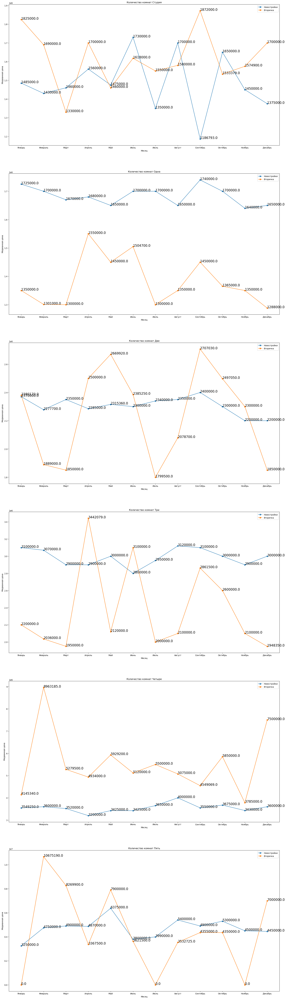

In [743]:
x = np.array(sorted(df['date'].dt.month.unique()))
plt.figure(figsize=(25, 86))
fig, ax = plt.subplots(6, 1, figsize=(24, 88))

  # Для шести комнат и выше строить графики смысла нет, потому что недостаточно данных для выяснения наиболее привлекательных месяцев (надо 6 и более)
for i in range(6):
    grfc(realty_nov_mass_grouped, realty_vt_mass_grouped, i)
    for x_coord, y_coord, label in zip(x, realty_nov_mass_grouped[realty_nov_mass_grouped.columns[i]], realty_nov_mass_grouped[realty_nov_mass_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    for x_coord, y_coord, label in zip(x, realty_vt_mass_grouped[realty_vt_mass_grouped.columns[i]], realty_vt_mass_grouped[realty_vt_mass_grouped.columns[i]]):
        ax[i].text(x_coord, y_coord, label, fontsize=16)
    i += 1

plt.savefig('grf40.png')

<strong>Выводы</strong>
1. Пояснение: я брал медианную цену, поскольку она устойчивее к выбросам, нежели средняя
2. Таблица приоритетных месяцев для покупки (самая низкая) и продажи (самая высокая) цены
<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Сентябрь (1'186'793)</td>
        <td>Март (1'330'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Ноябрь (1'640'000)</td>
        <td>Декабрь (1'288'000)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Ноябрь, Декабрь (2'200'000)</td>
        <td>Июль (1'799'500)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Июнь (2'800'000)</td>
        <td>Декабрь (1'948'350)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Апрель (3'200'000)</td>
        <td>Ноябрь (3'785'800)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Январь (3'250'000)</td>
        <td>Август (3'532'725)</td>
    </tr>
</table>

<table>
    <tr>
        <th></th>
        <th>Новостройка</th>
        <th>Вторичка</th>
    </tr>
    <tr>
        <td>Студия</td>
        <td>Июнь (1'730'000)</td>
        <td>Сентябрь (1'872'000)</td>
    </tr>
    <tr>
        <td>Однушка</td>
        <td>Сентябрь (1'740'000)</td>
        <td>Апрель (1'550'000)</td>
    </tr>
    <tr>
        <td>Двушка</td>
        <td>Сентябрь (2'400'000)</td>
        <td>Сентябрь (2'707'030)</td>
    </tr>
    <tr>
        <td>Трёшка</td>
        <td>Август (3'120'000)</td>
        <td>Апрель (3'442'079)</td>
    </tr>
    <tr>
        <td>Четыре комнаты</td>
        <td>Август (4'000'000)</td>
        <td>Февраль (8'963'185)</td>
    </tr>
    <tr>
        <td>Пять комнат</td>
        <td>Май(6'375'000)</td>
        <td>Февраль (10'675'190)</td>
    </tr>
</table>

<p>Тенденций ценообразлвания нет

<h2>6. Зависимость цены объекта от прочих признаков</h2>

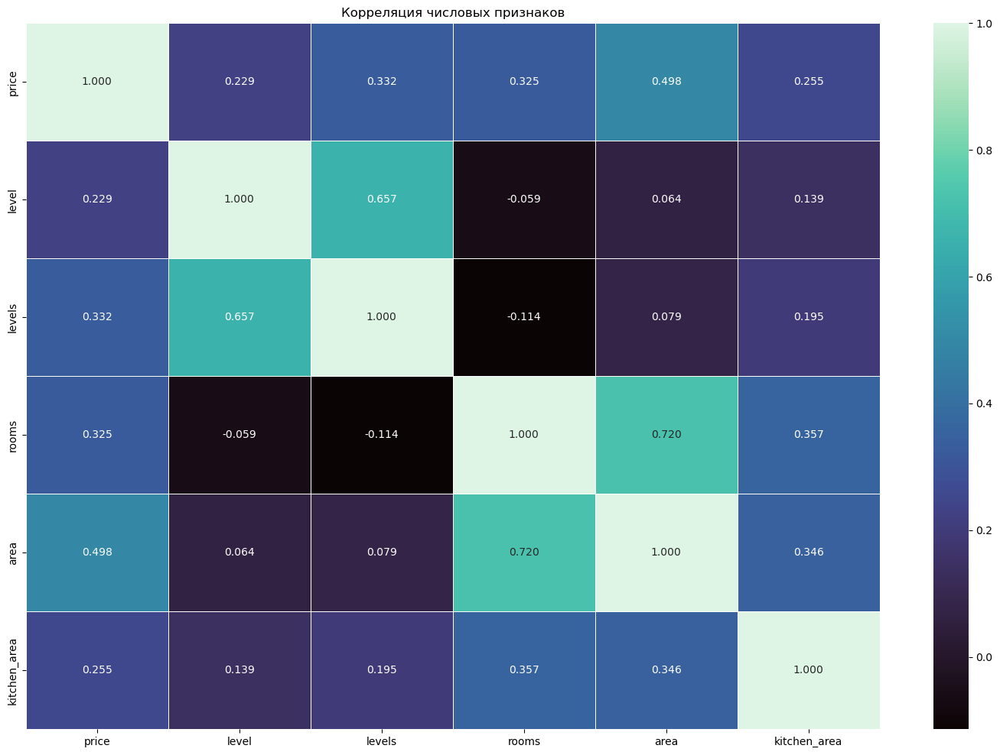

In [744]:
metrics = ['price', 'level', 'levels', 'rooms', 'area', 'kitchen_area']
correl_matrix = df[metrics].corr()

plt.figure(figsize=(18, 12))

sns.heatmap(correl_matrix, annot=True, cmap=sns.color_palette('mako', as_cmap=True), fmt='.3f', linewidths=0.5)

plt.title("Корреляция числовых признаков")
plt.savefig('grf41.png')

<strong><i><u>
Выводы:
</u></i></strong>
<br>1. Тесных и очень тесных зависимостей цены от каки-либо признаков не наблюдается
<br>2. Наиболее тесная связь цены с площадью (r = 0,498 - умеренная связь)
<br>3. Также умеренная связь наблюдается между ценой и количеством комнат (r = 0.325) и между ценой и количеством этажей (r = 0.332)
<br>4. Во всех случаях связь прямая
<br>5. Есть проблема мультиколлинеарности: между площадью и количеством комнат , а также между этажом и количеством этажей наблюдается тесная связь

<h2>7. Собственная гипотеза: медианная цена зависит от количества объявлений</h2>

<i>Пояснение: сильно углубляться в разделение датасета я не буду, только на вторичный/первичный рынок и рассматривать по регионам</i>

In [745]:
price_list = pd.DataFrame(df.query('object_type == True').groupby(by='region').price.median())
price_list.insert(1, 'vt', df.query('object_type == False').groupby(by='region').price.median())
price_list.columns = ['nov', 'vt']
price_list = price_list.set_index(regions.sort_values(by='code').reg_name)
price_list = price_list.fillna(0)
price_list

,nov,vt
reg_name,,
Москва,9000000.0,8953359.0
Еврейская автономная область,2199000.0,2151360.0
Московская область,4099000.0,4989320.0
Брянская область,2150000.0,2400000.0
Удмуртская Республика,2100000.0,2636740.0
...,...,...
Республика Северная Осетия — Алания,2150000.0,2615000.0
Мурманская область,2200000.0,1550000.0
Ямало-Ненецкий автономный округ,3550000.0,3350000.0


In [746]:
selling_list = pd.DataFrame(df.query('object_type == True').groupby(by='region').price.count())
selling_list.insert(1, 'vt', df.query('object_type == False').groupby(by='region').price.count())
selling_list.columns = ['nov', 'vt']
selling_list = selling_list.set_index(regions.sort_values(by='code').reg_name)
selling_list = selling_list.fillna(0)
selling_list

,nov,vt
reg_name,,
Москва,220742,178055.0
Еврейская автономная область,65,7.0
Московская область,375019,121749.0
Брянская область,1331,1149.0
Удмуртская Республика,40056,6772.0
...,...,...
Республика Северная Осетия — Алания,7133,2348.0
Мурманская область,545,1.0
Ямало-Ненецкий автономный округ,336,10.0


<Figure size 2800x6300 with 0 Axes>

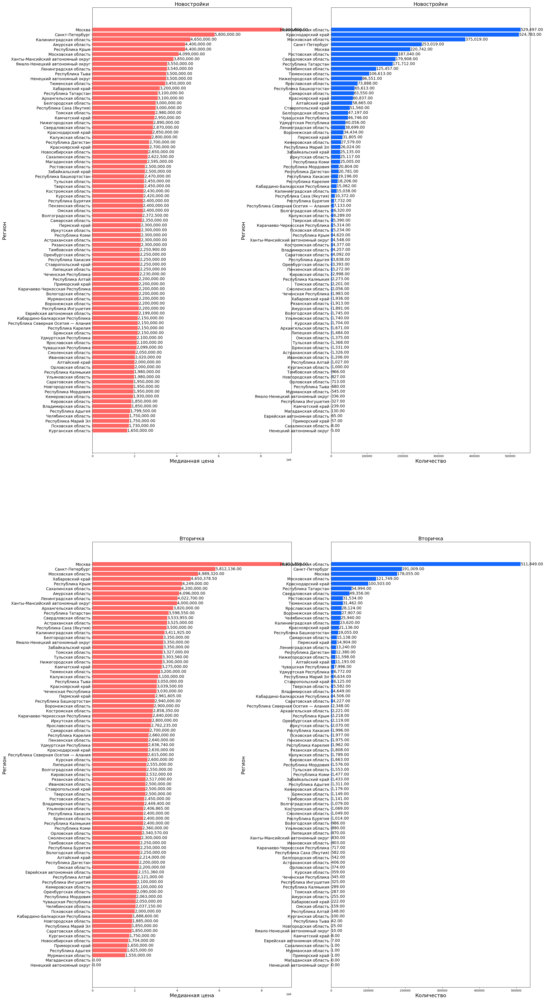

In [798]:
x = np.arange(0, regions.code.nunique())
width = 0.3
plt.figure(figsize=(28, 63))

fig, axs = plt.subplots(2, 2, figsize=(28, 63))

axs[0, 0].barh(x, price_list['nov'].sort_values(), color='#ff6764')
axs[0, 0].set_title('Новостройки', fontsize=18)
axs[0, 0].set_ylabel('Регион', fontsize=18)
axs[0, 0].set_xlabel('Медианная цена', fontsize=18)
axs[0, 0].set_yticks(x)
axs[0, 0].set_yticklabels(list(price_list.sort_values(by='nov').index), fontsize=14)
axs[0, 0].bar_label(axs[0, 0].containers[0], fmt='{:,.2f}', fontsize=14)

axs[1, 0].barh(x, price_list['vt'].sort_values(), color='#ff6764')
axs[1, 0].set_title('Вторичка', fontsize=18)
axs[1, 0].set_ylabel('Регион', fontsize=18)
axs[1, 0].set_xlabel('Медианная цена', fontsize=18)
axs[1, 0].set_yticks(x)
axs[1, 0].set_yticklabels(list(price_list.sort_values(by='vt').index), fontsize=14)
axs[1, 0].bar_label(axs[1, 0].containers[0], fmt='{:,.2f}', fontsize=14)

axs[0, 1].barh(x, selling_list['nov'].sort_values(), color='#1267ff')
axs[0, 1].set_title('Новостройки', fontsize=18)
axs[0, 1].set_ylabel('Регион', fontsize=18)
axs[0, 1].set_xlabel('Количество', fontsize=18)
axs[0, 1].set_yticks(x)
axs[0, 1].set_yticklabels(list(selling_list.sort_values(by='nov').index), fontsize=14)
axs[0, 1].bar_label(axs[0, 1].containers[0], fmt='{:,.2f}', fontsize=14)

axs[1, 1].barh(x, selling_list['vt'].sort_values(), color='#1267ff')
axs[1, 1].set_title('Вторичка', fontsize=18)
axs[1, 1].set_ylabel('Регион', fontsize=18)
axs[1, 1].set_xlabel('Количество', fontsize=18)
axs[1, 1].set_yticks(x)
axs[1, 1].set_yticklabels(list(selling_list.sort_values(by='vt').index), fontsize=14)
axs[1, 1].bar_label(axs[1, 1].containers[0], fmt='{:,.2f}', fontsize=14)

plt.savefig('grf42.png')

In [800]:
x_nov = np.array(selling_list['nov'])
y_nov = np.array(price_list['nov'])

model_nov = st.linregress(x_nov, y_nov)
print(f'Уравнение регрессии: Y = {round(model_nov.intercept, 2)} + {round(model_nov.slope, 2)} * x')
print(f'Коэффициент корреляции: {round(model_nov.rvalue, 4)}')
print(f'P-Value: {round(model_nov.pvalue, 4)}')

if model_nov.pvalue >= 0.05:
    print('Принимаем гипотезу о значимости уравнения регрессии')
else:
    print('Отклоняем гипотезу о значимости уравнения регрессии')

Уравнение регрессии: Y = 2480680.37 + 3.39 * x
Коэффициент корреляции: 0.3319
P-Value: 0.0022
Отклоняем гипотезу о значимости уравнения регрессии


In [749]:
round(st.shapiro(x_nov).statistic, 4)

0.4925

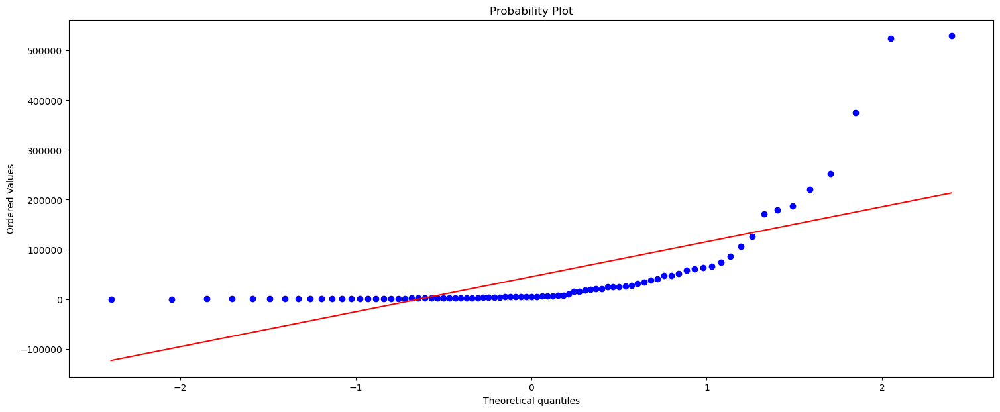

In [750]:
plt.figure(figsize=(18, 7))

st.probplot(x_nov, dist='norm', plot=plt)

plt.savefig('grf43.png')

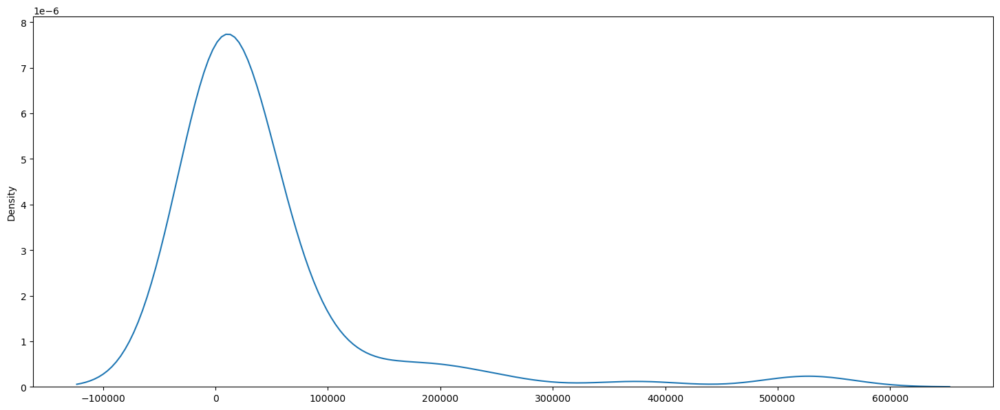

In [751]:
plt.figure(figsize=(18, 7))

sns.kdeplot(x_nov)

plt.savefig('grf44.png')

In [752]:
round(st.shapiro(y_nov).statistic, 4)

0.6575

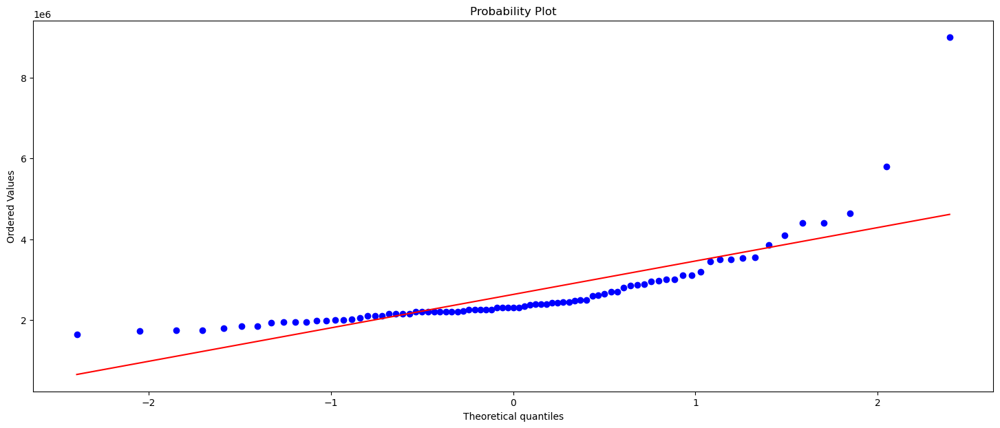

In [753]:
plt.figure(figsize=(18, 7))

st.probplot(y_nov, dist='norm', plot=plt)

plt.savefig('grf45.png')

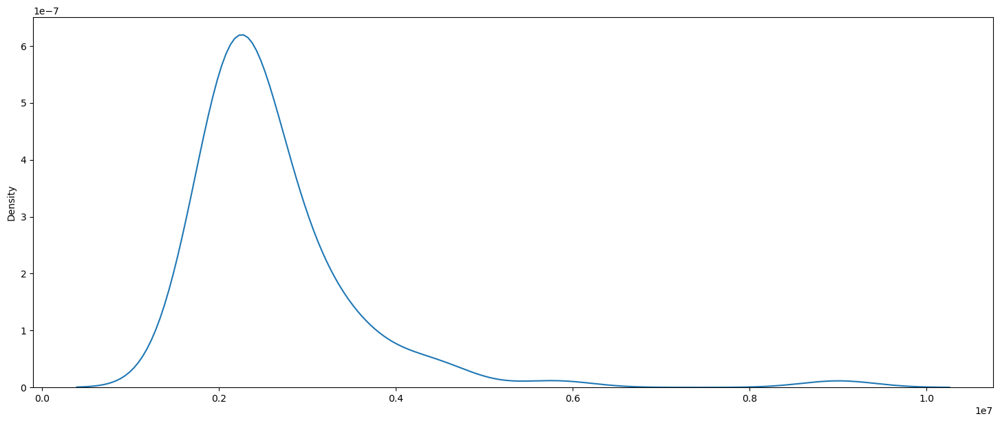

In [754]:
plt.figure(figsize=(18, 7))

sns.kdeplot(y_nov)

plt.savefig('grf46.png')

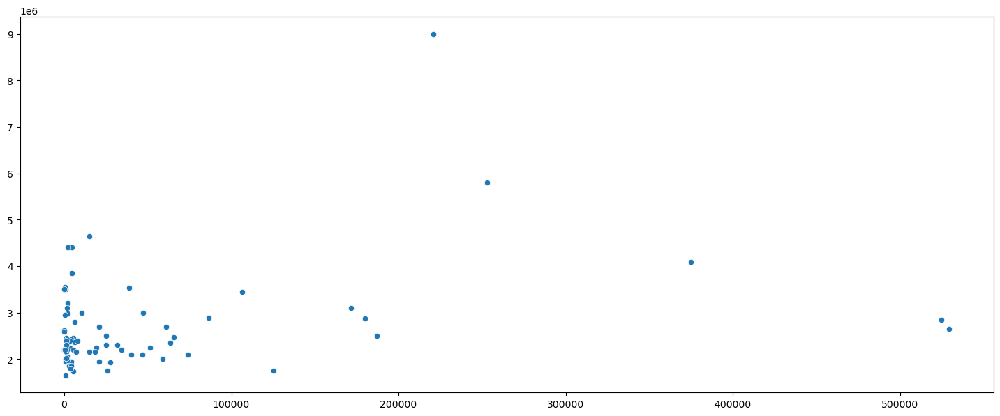

In [755]:
plt.figure(figsize=(18, 7))

sns.scatterplot(x=x_nov, y=y_nov)

plt.savefig('grf47.png')

In [756]:
x_vt = np.array(selling_list['vt'])
y_vt = np.array(price_list['vt'])

model_vt = st.linregress(x_vt, y_vt)
print(f'Уравнение регрессии: Y = {round(model_vt.intercept, 2)} + {round(model_vt.slope, 2)} * x')
print(f'Коэффициент корреляции: r = {round(model_vt.rvalue, 4)}')
print(f'P-Value: r = {round(model_vt.pvalue, 4)}')

if model_vt.pvalue >= 0.05:
    print('Принимаем гипотезу о значимости уравнения регрессии')
else:
    print('Отклоняем гипотезу о значимости уравнения регрессии')

Уравнение регрессии: Y = 2695085.28 + 4.33 * x
Коэффициент корреляции: r = 0.2458
P-Value: r = 0.0251
Отклоняем гипотезу о значимости уравнения регрессии


In [757]:
round(st.shapiro(x_vt).statistic, 4)

0.3091

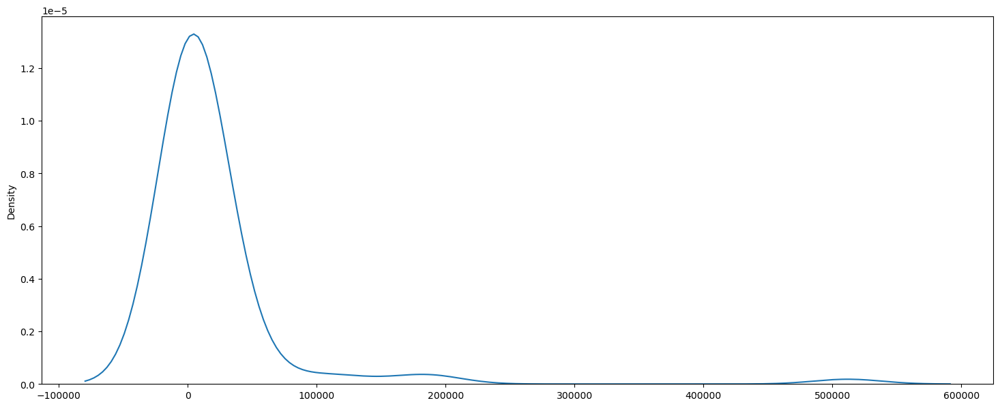

In [758]:
plt.figure(figsize=(18, 7))

sns.kdeplot(x_vt)

plt.savefig('grf48.png')

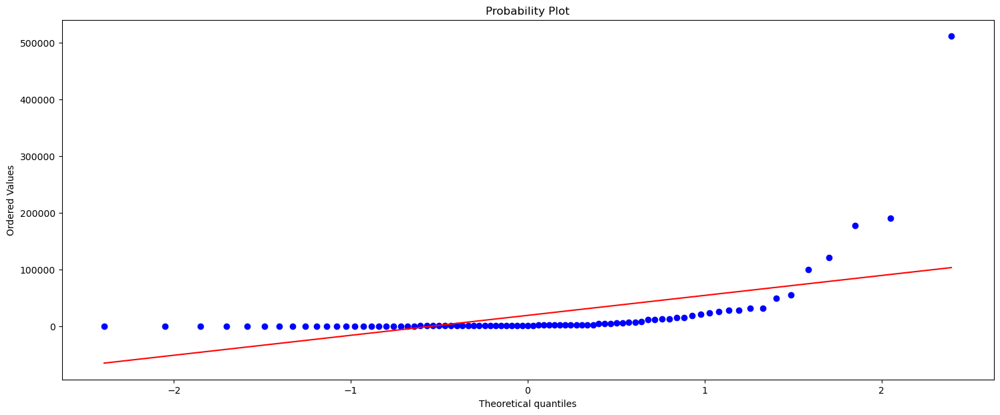

In [759]:
plt.figure(figsize=(18, 7))

st.probplot(x_vt, dist='norm', plot=plt)

plt.savefig('grf49.png')

In [760]:
round(st.shapiro(y_vt).statistic, 4)

0.8254

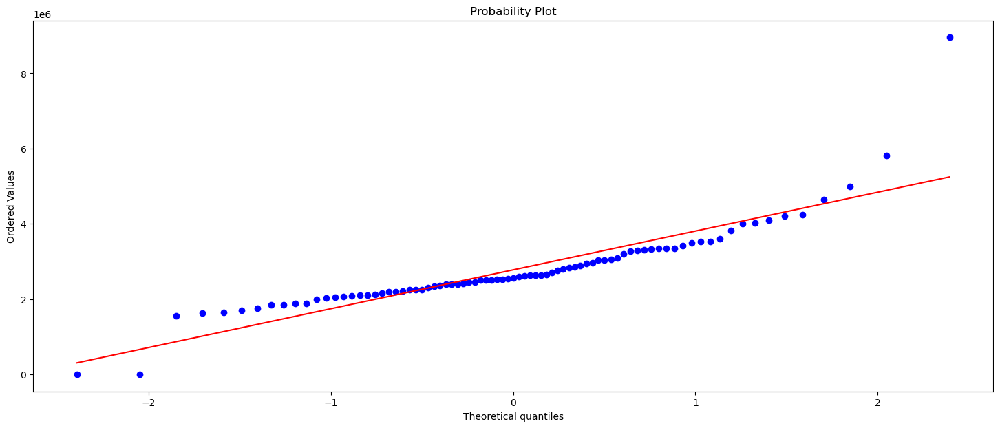

In [761]:
plt.figure(figsize=(18, 7))

st.probplot(y_vt, dist='norm', plot=plt)

plt.savefig('grf50.png')

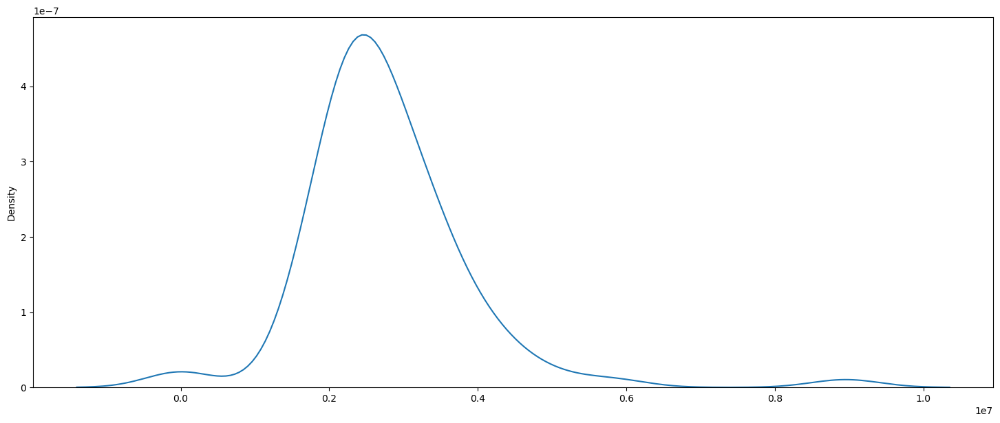

In [762]:
plt.figure(figsize=(18, 7))

sns.kdeplot(y_vt)

plt.savefig('grf51.png')

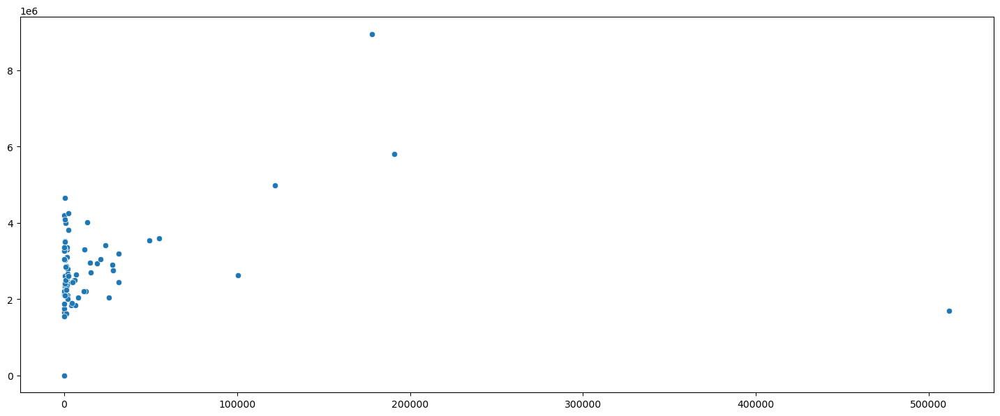

In [763]:
plt.figure(figsize=(18, 7))

sns.scatterplot(x=x_vt, y=y_vt)

plt.savefig('grf52.png')

<i>
<br>1. Коэффициент корреляции маленький (для первичного рынка установлена умеренная связь, для вторичного - слабая связь)
<br>2. Распределение цен на недвижимость ненормальное
<br>3. Распределение количества проданных объектов приближено к нормальному, особенно на вторичном рынке
<br>4. Исходя из графиков плотности распределения, картину сильно портят выбросы (очень длинные хвосты)
<br>5. Для распределения количества объявлений на вторичном рынке эти хвосты наиболее симметричны, поэтому, действительно, это распределение близко к норнмальному
<br>6. Возможно, беда кроется в том, что датасет надо было делить лучше</i>

<h2>8. Модель прогноза</h2>

In [764]:
df_model = df

In [765]:
df_model['price_m2'] = df_model['price'] / df_model['area']

In [766]:
metrics = ['price', 'level', 'levels', 'rooms', 'area', 'kitchen_area', 'price_m2']
correl_matrix = df[metrics].corr()

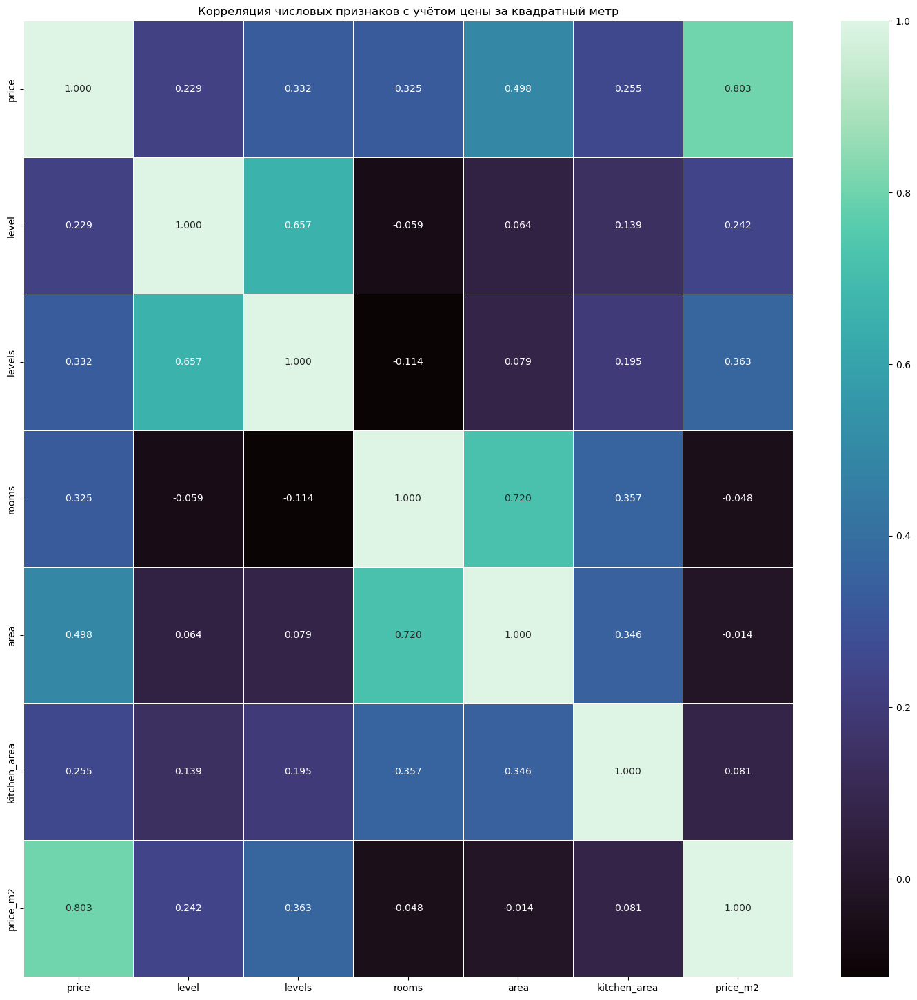

In [767]:
plt.figure(figsize=(18, 18))
sns.heatmap(correl_matrix, annot=True, cmap=sns.color_palette('mako', as_cmap=True), fmt='.3f', linewidths=0.5)
plt.title("Корреляция числовых признаков с учётом цены за квадратный метр")
plt.show()

<i><br>1. При добавлении новой метрики проблемы коллинеарности этой метрики с иными не возникает
<br>2. В модели будут использоваться только метрики, слабо коррелирующие между собой</i>

In [768]:
params = df_model[['region', 'building_type', 'object_type', 'levels', 'area', 'price_m2']]
target = df_model['price']

x_train, x_test, y_train, y_test = train_test_split(params, target, test_size=0.15, random_state=13)
pred_md = LinearRegression()
pred_md.fit(x_train, y_train)

pred_val = pred_md.predict(x_test)
error = mean_squared_error(y_test, pred_val)

print(f'Уравнение регрессии: y = {round(pred_md.intercept_, 2)} + {round(pred_md.coef_[0], 2)} * x1 + {round(pred_md.coef_[1], 2)} * x2 + {round(pred_md.coef_[2], 2)} * x3 + {round(pred_md.coef_[3], 2)} * x4 + {round(pred_md.coef_[4], 2)} * x5 + {round(pred_md.coef_[5], 2)} * x6')

qual_rmse = error ** 0.5
print(f'Качество модели (RMSE): {round(qual_rmse, 2)}')

determ_coef = r2_score(y_test, pred_val)
print(f'Коэффициент детерминации (R^2): {round(determ_coef, 2)}')
print(f'Коэффициент корреляции (R): {round(determ_coef **0.5, 2)}')

Уравнение регрессии: y = -4176485.33 + -6.3 * x1 + 6310.47 * x2 + 28005.7 * x3 + -65.24 * x4 + 80925.02 * x5 + 51.31 * x6
Качество модели (RMSE): 985926.47
Коэффициент детерминации (R^2): 0.9
Коэффициент корреляции (R): 0.95


<strong><i><u>
Выводы:
<br>1. Вариация цены объекта на 90% объясняется вариацией рассмотренных факторов
<br>2. Между рассмотренными переменными очень тесная связь
<br>3. По большому счёту, у нас есть категориальные переменные (регион, тип здания, тип рынка), вводить их в модель надо через фиктивные переменные, но тогда модель будет очень громоздкой, поэтому (если я выживу), буду делать отдельные модели для каждого региона(хотя бы)
</u></i></strong>

In [769]:
building_type = pd.DataFrame({'b_t': ['Другое', 'Панельный', 'Кирпично-монолитный', 'Кирпичный', 'Блочный', 'Деревянный']})
building_type

,b_t
0,Другое
1,Панельный
2,Кирпично-монолитный
3,Кирпичный
4,Блочный
5,Деревянный


In [770]:
coefs = np.array([np.NaN, np.NaN, np.NaN])
rvalues = np.array([np.NaN])
inters = np.array([np.NaN])

for i in list(sorted(df_model['region'].unique())):
    print(f'Регион: {regions[regions["code"] == i].reg_name.values}, Код: {i}', end='\n\n')
    for j in list(sorted(df_model['building_type'].unique())):
        print(f'Тип дома: {building_type.iloc[j].b_t}', end='\n\n')
        if df_model.query('region == @i and building_type == @j').shape[0] < 30:
            print(f'Нерепрезентативная выборка. Значений: {df_model.query("region == @i and building_type == @j").shape[0]}')
            print('-' * 15)

        else:
            params = df_model.query('region == @i and building_type == @j')[['levels', 'area', 'price_m2']]
            target = df_model.query('region == @i and building_type == @j')['price']

            x_train, x_test, y_train, y_test = train_test_split(params, target, test_size=0.5, random_state=7)
            pred_md = LinearRegression()
            pred_md.fit(x_train, y_train)

            pred_val = pred_md.predict(x_test)
            error = mean_squared_error(y_test, pred_val)

            print(f'Уравнение регрессии: y = {round(pred_md.intercept_, 2)} + {round(pred_md.coef_[0], 2)} * x1 + {round(pred_md.coef_[1], 2)} * x2 + {round(pred_md.coef_[2], 2)} * x3')

            qual_rmse = error ** 0.5
            print(f'Качество модели (RMSE): {round(qual_rmse, 2)}')

            determ_coef = r2_score(y_test, pred_val)
            coefs = np.column_stack((coefs, pred_md.coef_.round(2)))
            rvalues = np.vstack((rvalues, round(determ_coef **0.5, 2)))
            inters = np.vstack((inters, round(pred_md.intercept_, 2)))
            print(f'Коэффициент детерминации (R^2): {round(determ_coef, 2)}')
            print(f'Коэффициент корреляции (R): {round(determ_coef **0.5, 2)}')
            print('-' * 15)
        
    print('_______________________________________________________________________________', end='\n\n')

Регион: ['Москва'], Код: 3

Тип дома: Другое

Уравнение регрессии: y = -10477951.94 + -6725.11 * x1 + 219537.16 * x2 + 46.87 * x3
Качество модели (RMSE): 1554064.57
Коэффициент детерминации (R^2): 0.89
Коэффициент корреляции (R): 0.95
---------------
Тип дома: Панельный

Уравнение регрессии: y = -8997975.79 + 752.89 * x1 + 174956.76 * x2 + 50.2 * x3
Качество модели (RMSE): 797852.79
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.97
---------------
Тип дома: Кирпично-монолитный

Уравнение регрессии: y = -10097971.79 + 475.83 * x1 + 187303.3 * x2 + 52.78 * x3
Качество модели (RMSE): 1144792.38
Коэффициент детерминации (R^2): 0.94
Коэффициент корреляции (R): 0.97
---------------
Тип дома: Кирпичный

Уравнение регрессии: y = -10059257.78 + 8530.14 * x1 + 199968.45 * x2 + 48.78 * x3
Качество модели (RMSE): 1361191.46
Коэффициент детерминации (R^2): 0.93
Коэффициент корреляции (R): 0.96
---------------
Тип дома: Блочный

Уравнение регрессии: y = -8670953.59 + 26627.32 * x

C:\Users\Дмитрий\AppData\Local\Temp\ipykernel_10924\1340454058.py:31: RuntimeWarning: invalid value encountered in scalar power
  rvalues = np.vstack((rvalues, round(determ_coef **0.5, 2)))
C:\Users\Дмитрий\AppData\Local\Temp\ipykernel_10924\1340454058.py:34: RuntimeWarning: invalid value encountered in scalar power
  print(f'Коэффициент корреляции (R): {round(determ_coef **0.5, 2)}')


Уравнение регрессии: y = -2154354.43 + -9636.2 * x1 + 38850.02 * x2 + 56.2 * x3
Качество модели (RMSE): 179711.99
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.98
---------------
Тип дома: Деревянный

Нерепрезентативная выборка. Значений: 3
---------------
_______________________________________________________________________________

Регион: ['Мурманская область'], Код: 14368

Тип дома: Другое

Нерепрезентативная выборка. Значений: 0
---------------
Тип дома: Панельный

Уравнение регрессии: y = -2623564.96 + -9134.54 * x1 + 52363.6 * x2 + 52.04 * x3
Качество модели (RMSE): 201522.23
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.98
---------------
Тип дома: Кирпично-монолитный

Нерепрезентативная выборка. Значений: 1
---------------
Тип дома: Кирпичный

Уравнение регрессии: y = -2624395.76 + 1778.34 * x1 + 47503.79 * x2 + 55.92 * x3
Качество модели (RMSE): 265064.33
Коэффициент детерминации (R^2): 0.96
Коэффициент корреляции (R): 0.98
--------

In [771]:
rvalues

array([[ nan],
       [0.95],
       [0.97],
       [0.97],
       [0.96],
       [0.97],
       [0.96],
       [0.98],
       [0.97],
       [0.96],
       [0.96],
       [0.96],
       [0.95],
       [0.96],
       [0.98],
       [0.97],
       [0.97],
       [1.  ],
       [0.98],
       [0.98],
       [0.97],
       [0.97],
       [0.94],
       [0.96],
       [0.98],
       [0.97],
       [0.99],
       [0.97],
       [0.98],
       [0.98],
       [0.97],
       [0.96],
       [0.97],
       [0.99],
       [0.98],
       [0.97],
       [0.98],
       [0.96],
       [0.98],
       [0.98],
       [0.98],
       [0.97],
       [0.96],
       [0.82],
       [0.99],
       [0.98],
       [0.97],
       [0.97],
       [0.95],
       [0.92],
       [0.98],
       [0.98],
       [0.98],
       [0.96],
       [0.95],
       [0.97],
       [0.95],
       [0.98],
       [0.98],
       [0.97],
       [0.97],
       [0.98],
       [0.95],
       [0.98],
       [0.98],
       [0.98],
       [0.

In [772]:
coefs

array([[           nan, -6.7251100e+03,  7.5289000e+02, ...,
         2.1044045e+05,  5.4350000e+01, -3.6616490e+04],
       [           nan,  2.1953716e+05,  1.7495676e+05, ...,
         4.0678780e+04,  5.4737980e+04,  5.8609370e+04],
       [           nan,  4.6870000e+01,  5.0200000e+01, ...,
         4.9140000e+01,  5.3180000e+01,  6.5920000e+01]])

In [773]:
rvalues = rvalues.reshape(361)[~np.isnan(rvalues.reshape(361))]

In [774]:
rvalues

array([0.95, 0.97, 0.97, 0.96, 0.97, 0.96, 0.98, 0.97, 0.96, 0.96, 0.96,
       0.95, 0.96, 0.98, 0.97, 0.97, 1.  , 0.98, 0.98, 0.97, 0.97, 0.94,
       0.96, 0.98, 0.97, 0.99, 0.97, 0.98, 0.98, 0.97, 0.96, 0.97, 0.99,
       0.98, 0.97, 0.98, 0.96, 0.98, 0.98, 0.98, 0.97, 0.96, 0.82, 0.99,
       0.98, 0.97, 0.97, 0.95, 0.92, 0.98, 0.98, 0.98, 0.96, 0.95, 0.97,
       0.95, 0.98, 0.98, 0.97, 0.97, 0.98, 0.95, 0.98, 0.98, 0.98, 0.98,
       0.97, 0.94, 0.98, 0.96, 0.98, 0.96, 0.95, 0.94, 0.99, 0.93, 0.98,
       0.99, 0.97, 0.96, 0.97, 0.95, 0.95, 0.96, 0.95, 0.9 , 0.98, 0.97,
       0.98, 0.97, 0.95, 0.94, 0.97, 0.97, 0.97, 0.97, 0.97, 0.93, 0.99,
       0.98, 0.98, 0.98, 0.95, 0.94, 0.98, 0.94, 0.99, 0.98, 0.98, 0.97,
       0.95, 0.94, 0.98, 0.96, 0.97, 0.97, 0.94, 0.97, 0.96, 0.98, 0.97,
       0.97, 0.96, 0.97, 0.98, 0.97, 0.97, 0.97, 0.97, 0.99, 0.98, 0.98,
       0.98, 0.98, 0.98, 0.97, 0.97, 0.97, 0.72, 0.96, 0.97, 0.96, 0.96,
       0.96, 0.95, 0.98, 0.97, 0.98, 0.98, 0.97, 0.

In [775]:
coefs_x1 = coefs[0]
coefs_x2 = coefs[1]
coefs_x3 = coefs[2]

In [776]:
coefs_x1 = coefs_x1[~np.isnan(coefs_x1)]

In [777]:
coefs_x2 = coefs_x2[~np.isnan(coefs_x2)]

In [778]:
coefs_x3 = coefs_x3[~np.isnan(coefs_x3)]

In [779]:
inters = inters.reshape(361)[~np.isnan(inters.reshape(361))]

In [780]:
inters

array([-10477951.94,  -8997975.79, -10097971.79, -10059257.78,
        -8670953.59,  -8199639.22,  -1651829.72,  -5435989.3 ,
        -4546022.7 ,  -5363260.52,  -4022965.94,  -3785111.26,
        -2984324.37,  -1582590.56,  -1653456.84,  -2366151.62,
        -3230883.78,  -2267078.03,  -3314668.69,  -2493093.75,
        -2117884.76,  -1144835.69,  -2170621.97,  -3116170.78,
        -3407068.24,  -2135485.54,  -3165789.49,  -2895844.88,
        -3472328.15,  -2997208.62,  -2398374.36,  -1685616.06,
        -3494458.82,  -2683987.61,  -4457992.93,  -3797362.95,
        -2747251.09,  -2731811.86,  -2164899.05,  -3330259.85,
        -2759129.76,  -2015476.21,  -1593255.91,  -5397012.51,
        -4064832.71,  -5105476.4 ,  -4645048.12,  -3037396.45,
        -2550572.13,  -1925474.22,  -2909892.03,  -2452948.08,
        -2278053.87,  -4036638.81,  -2681536.13,  -2405456.39,
        -3660633.59,  -1999937.36,  -3666916.8 ,  -2898780.4 ,
        -2360319.3 ,  -2543758.18,  -7673874.46,  -5539

In [781]:
rvalue_median = np.median(rvalues)
rvalue_median

0.97

In [782]:
coef_x1_median = np.median(coefs_x1)
coef_x1_median

-793.76

In [783]:
coef_x2_median = np.median(coefs_x2)
coef_x2_median

51265.5

In [784]:
coef_x3_median = np.median(coefs_x3)
coef_x3_median

54.075

In [785]:
inter_median = np.median(inters)
inter_median

-2821365.48

In [786]:
print(f'Усреднённая модель регрессии: Y = {inter_median} + {coef_x1_median} * x1 + {coef_x2_median} * x2 + {coef_x3_median} * x3 + delt')
print(f'Усреднённый коэффициент корреляции: {rvalue_median}')
print(f'Усреднённый коэффициент детерминации: {round(rvalue_median **2, 2)}')

Усреднённая модель регрессии: Y = -2821365.48 + -793.76 * x1 + 51265.5 * x2 + 54.075 * x3 + delt
Усреднённый коэффициент корреляции: 0.97
Усреднённый коэффициент детерминации: 0.94


In [787]:
round(np.std(rvalues), 4)

0.0313

In [788]:
round((np.std(rvalues, ddof=1) / np.mean(rvalues)), 4)

0.0326

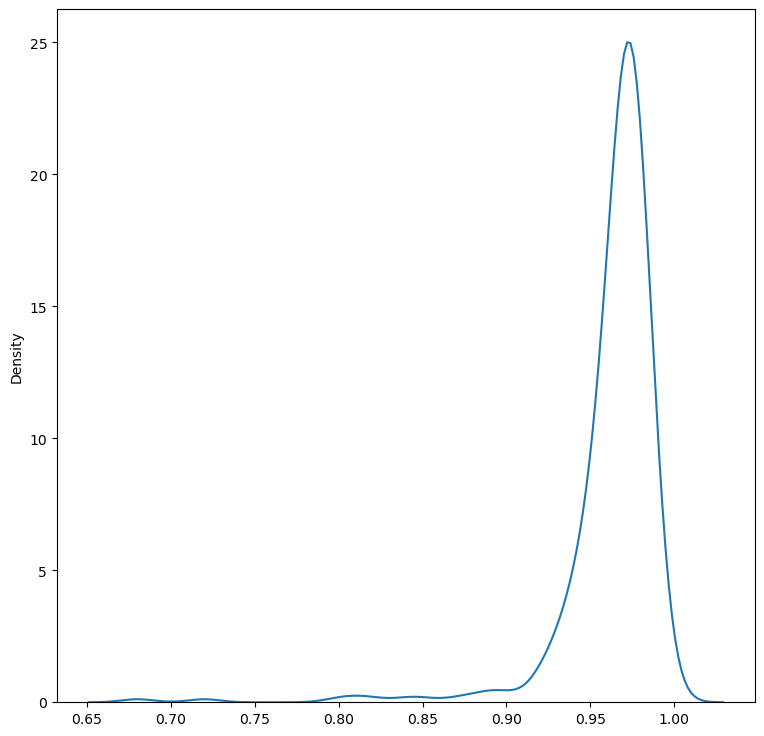

In [789]:
plt.figure(figsize=(9, 9))
sns.kdeplot(rvalues)
plt.show()

<strong><i><u>
Выводы:
1. Медианный коэффициент корреляции за все регионы составил 0,97, что свидетельствует об очень тесной связи
2. Дисперсия коэффициента корреляции составила 0,0313, а коэффициент вариации - 0,0326, что свидетельствует о равномерном распределнии коэффициента корреляции для каждого региона и типа дома
3. Вариация цены на 94% объясняется изменением количества этажей, площадью и ценой квадратного метра
4. При введении типа рынка коэффициент корреляции не изменяется, поэтому в итоговую модель я его не вводил (ниже есть пример с введённой такой переменной)
</u></i></strong>

In [790]:
coefs_ = np.array([np.NaN, np.NaN, np.NaN, np.NaN])
rvalues_ = np.array([np.NaN])
inters_ = np.array([np.NaN])

for i in list(sorted(df_model['region'].unique())):
    print(f'Регион: {regions[regions["code"] == i].reg_name.values}, Код: {i}', end='\n\n')
    for j in list(sorted(df_model['building_type'].unique())):
        print(f'Тип дома: {building_type.iloc[j].b_t}', end='\n\n')
        if df_model.query('region == @i and building_type == @j').shape[0] < 30:
            print(f'Нерепрезентативная выборка. Значений: {df_model.query("region == @i and building_type == @j").shape[0]}')
            print('-' * 15)

        else:
            params = df_model.query('region == @i and building_type == @j')[['object_type', 'levels', 'area', 'price_m2']]
            target = df_model.query('region == @i and building_type == @j')['price']

            x_train, x_test, y_train, y_test = train_test_split(params, target, test_size=0.5, random_state=7)
            pred_md = LinearRegression()
            pred_md.fit(x_train, y_train)

            pred_val = pred_md.predict(x_test)
            error = mean_squared_error(y_test, pred_val)

            print(f'Уравнение регрессии: y = {round(pred_md.intercept_, 2)} + {round(pred_md.coef_[0], 2)} * x1 + {round(pred_md.coef_[1], 2)} * x2 + {round(pred_md.coef_[2], 2)} * x3  + {round(pred_md.coef_[3], 2)} * x4')

            qual_rmse = error ** 0.5
            print(f'Качество модели (RMSE): {round(qual_rmse, 2)}')

            determ_coef = r2_score(y_test, pred_val)
            coefs_ = np.column_stack((coefs_, pred_md.coef_.round(2)))
            rvalues_ = np.vstack((rvalues_, round(determ_coef **0.5, 2)))
            inters_ = np.vstack((inters_, round(pred_md.intercept_, 2)))
            print(f'Коэффициент детерминации (R^2): {round(determ_coef, 2)}')
            print(f'Коэффициент корреляции (R): {round(determ_coef **0.5, 2)}')
            print('-' * 15)
        
    print('_______________________________________________________________________________', end='\n\n')

Регион: ['Москва'], Код: 3

Тип дома: Другое

Уравнение регрессии: y = -10676250.16 + 232033.28 * x1 + 3029.4 * x2 + 218640.15 * x3  + 46.54 * x4
Качество модели (RMSE): 1557070.28
Коэффициент детерминации (R^2): 0.89
Коэффициент корреляции (R): 0.95
---------------
Тип дома: Панельный

Уравнение регрессии: y = -9201057.48 + 319316.62 * x1 + 10311.64 * x2 + 174155.02 * x3  + 49.39 * x4
Качество модели (RMSE): 787424.18
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.97
---------------
Тип дома: Кирпично-монолитный

Уравнение регрессии: y = -10099772.25 + 19852.55 * x1 + 664.87 * x2 + 187272.36 * x3  + 52.75 * x4
Качество модели (RMSE): 1144847.86
Коэффициент детерминации (R^2): 0.94
Коэффициент корреляции (R): 0.97
---------------
Тип дома: Кирпичный

Уравнение регрессии: y = -10200998.71 + 140950.96 * x1 + 11003.07 * x2 + 199931.07 * x3  + 48.72 * x4
Качество модели (RMSE): 1360893.14
Коэффициент детерминации (R^2): 0.93
Коэффициент корреляции (R): 0.96
------------

C:\Users\Дмитрий\AppData\Local\Temp\ipykernel_10924\3321000046.py:31: RuntimeWarning: invalid value encountered in scalar power
  rvalues_ = np.vstack((rvalues_, round(determ_coef **0.5, 2)))
C:\Users\Дмитрий\AppData\Local\Temp\ipykernel_10924\3321000046.py:34: RuntimeWarning: invalid value encountered in scalar power
  print(f'Коэффициент корреляции (R): {round(determ_coef **0.5, 2)}')


Уравнение регрессии: y = -3147693.04 + 40800.7 * x1 + -2897.29 * x2 + 42552.84 * x3  + 73.94 * x4
Качество модели (RMSE): 322361.06
Коэффициент детерминации (R^2): 0.94
Коэффициент корреляции (R): 0.97
---------------
Тип дома: Блочный

Уравнение регрессии: y = -1993056.5 + -137602.28 * x1 + -11398.97 * x2 + 38663.72 * x3  + 56.05 * x4
Качество модели (RMSE): 182850.43
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.98
---------------
Тип дома: Деревянный

Нерепрезентативная выборка. Значений: 3
---------------
_______________________________________________________________________________

Регион: ['Мурманская область'], Код: 14368

Тип дома: Другое

Нерепрезентативная выборка. Значений: 0
---------------
Тип дома: Панельный

Уравнение регрессии: y = -2623564.96 + 0.0 * x1 + -9134.54 * x2 + 52363.6 * x3  + 52.04 * x4
Качество модели (RMSE): 201522.23
Коэффициент детерминации (R^2): 0.95
Коэффициент корреляции (R): 0.98
---------------
Тип дома: Кирпично-монолитный



In [791]:
rvalues_ = rvalues_.reshape(361)[~np.isnan(rvalues_.reshape(361))]

In [792]:
coefs_b_x1 = coefs_[0]
coefs_b_x2 = coefs_[1]
coefs_b_x3 = coefs_[2]
coefs_b_x4 = coefs_[3]

coefs_b_x1 = coefs_b_x1[~np.isnan(coefs_b_x1)]
coefs_b_x2 = coefs_b_x2[~np.isnan(coefs_b_x2)]
coefs_b_x3 = coefs_b_x3[~np.isnan(coefs_b_x3)]
coefs_b_x4 = coefs_b_x4[~np.isnan(coefs_b_x4)]

In [793]:
rvalue_b_median = np.median(rvalues_)
rvalue_b_median

0.97

In [794]:
coef_b_x1_median = np.median(coefs_b_x1)
coef_b_x1_median

0.0

<i>Медианный коэффициент при переменной типа рынка равен 0, поэтому мы не будем дальше проверять модель, как в примере выше</i>